In [211]:
import numpy as np
import pandas as pd
import tqdm
from sklearn import tree
from kmodes.kmodes import KModes
from sklearn.cluster import SpectralClustering
from collections import Counter
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.cluster import AffinityPropagation
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
import math 
import sklearn
import scipy.special as sp
from tqdm import tqdm
from keras.models import Sequential
from keras.layers import Dense
from keras.activations import *
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.decomposition import FastICA
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
%matplotlib notebook

df=[]
df1=[]
#for i in range(7):
#    df.append(pd.read_csv("/home/franc/franc/matches/b"+str(i)+".csv"))

#for i in range(7):
#    df.append(pd.read_csv("/home/franc/franc/matches/n"+str(i)+".csv"))
    
#for i in range(7):
#    df.append(pd.read_csv("/home/franc/franc/matches/d2"+str(i)+".csv"))
    
for i in range(6):
    df.append(pd.read_csv("/home/franc/franc/matches/d1"+str(i)+".csv"))    
#df1.append(pd.read_csv("/home/franc/franc/matches/DNK.csv"))

df=pd.concat(df,sort=False)
#df1=pd.concat(df1,sort=False)

In [212]:
def Probability(rating1, rating2): 
  
    return 1.0 * 1.0 / (1 + 1.0 * math.pow(10, 1.0 * ((rating1) - rating2) / 400)) 
  
  
# Function to calculate Elo rating 
# K is a constant. 
# d determines whether 
# Player A wins or Player B.  
def EloRating(Ra, Rb, K, d): 
   
      
    # To calculate the Winning 
    # Probability of Player B 
  
    # To calculate the Winning 
    # Probability of Player A 
    Pa = nprob(Ra, Rb) 
    Pb = 1-Pa
    # Case -1 When Player A wins 
    # Updating the Elo Ratings 
    if (d == 1) : 
        Ra = Ra + K * (1 - Pa) 
        Rb = Rb + K * (0 - Pb) 
      
  
    # Case -2 When Player B wins 
    # Updating the Elo Ratings 
    elif (d==0.5) : 
        Ra = Ra + K * (0.5 - Pa) 
        Rb = Rb + K * (0.5 - Pb) 
      
    else : 
        Ra = Ra + K * (0 - Pa) 
        Rb = Rb + K * (1 - Pb) 
      
    return Ra,Rb
    print("Updated Ratings:-") 
    print("Ra =", round(Ra, 6)," Rb =", round(Rb, 6))

def Probabilityad(rating1, rating2): 
  
    return 1.0 * 1.0 / (1 + 1.0 * math.pow(10, 1.0 * ((rating1) - rating2) / 400)) 

def nprob(rating1, rating2): 
  
    return 1/2*(1 + sp.erf((rating1-rating2)/(300*math.sqrt(2)))) 

def spreadelo(Ra, Rb, K, ga,gb,n): 
   
      
    # To calculate the Winning 
    # Probability of Player B 
    Pa = nprob(Ra, Rb) 
  
    # To calculate the Winning 
    # Probability of Player A 
    Pb = 1-Pa 
  
    # Case -1 When Player A wins 
    # Updating the Elo Ratings 
    if ga-gb > n:
        Ra=Ra+K*(1-Pa)
        Rb=Rb+K*(0-Pb)
    else:
        Ra=Ra+K*(0-Pa)
        Rb=Rb+K*(1-Pb)
      
    return Ra,Rb

def adelo(Ra, Rb, K, g,n): 
   
      
    # To calculate the Winning 
    # Probability of Player B 
    Pa = nprob(Ra, Rb) 
  
    # To calculate the Winning 
    # Probability of Player A 
    Pb = 1-Pa 
  
    # Case -1 When Player A wins 
    # Updating the Elo Ratings 
    if g > n:
        Ra=Ra+K*(1-Pa)
        Rb=Rb+K*(0-Pb)
    else:
        Ra=Ra+K*(0-Pa)
        Rb=Rb+K*(1-Pb)
      
    return Ra,Rb

def kgvelo(Ra, Rb, K, ga,gb): 
   
      
    # To calculate the Winning 
    # Probability of Player B 
    Pa = nprob(Ra, Rb) 
  
    # To calculate the Winning 
    # Probability of Player A 
    Pb = 1-Pa 
  
    # Case -1 When Player A wins 
    # Updating the Elo Ratings 
    if ga==0:
        Ra=Ra+K*(0-Pa)
    else:
        Ra=Ra+K*(1-Pa)
        
    if gb==0:
        Rb=Rb+K*(0-Pb)
    else:
        Rb=Rb+K*(1-Pb)
      
    return Ra,Rb

In [213]:
rat_dic={}


In [214]:
df


,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,BbAv<2.5,BbAH,BbAHh,BbMxAHH,BbAvAHH,BbMxAHA,BbAvAHA,PSCH,PSCD,PSCA
0,D1,24/08/12,Dortmund,Werder Bremen,2,1,H,1,0,H,...,2.45,22.0,-1.50,1.91,1.85,2.10,2.03,1.29,6.37,11.20
1,D1,25/08/12,Augsburg,Fortuna Dusseldorf,0,2,A,0,0,D,...,1.79,20.0,-0.25,1.84,1.76,2.19,2.13,2.08,3.45,4.01
2,D1,25/08/12,Ein Frankfurt,Leverkusen,2,1,H,0,1,A,...,1.92,21.0,0.25,1.83,1.77,2.16,2.12,2.99,3.54,2.48
3,D1,25/08/12,Freiburg,Mainz,1,1,D,0,0,D,...,1.76,22.0,0.00,1.88,1.84,2.07,2.00,2.78,3.45,2.71
4,D1,25/08/12,Greuther Furth,Bayern Munich,0,3,A,0,1,A,...,2.24,21.0,1.25,2.03,1.98,1.94,1.89,8.65,4.76,1.44
5,D1,25/08/12,Hamburg,Nurnberg,0,1,A,0,0,D,...,1.86,20.0,-0.50,2.18,2.12,1.80,1.77,2.40,3.39,3.26
6,D1,25/08/12,Mgladbach,Hoffenheim,2,1,H,1,0,H,...,1.83,20.0,-0.50,2.05,2.00,1.94,1.87,1.98,3.58,4.24
7,D1,26/08/12,Hannover,Schalke 04,2,2,D,1,0,H,...,1.95,19.0,0.00,2.14,2.08,1.82,1.77,3.70,3.66,2.09
8,D1,26/08/12,Stuttgart,Wolfsburg,0,1,A,0,0,D,...,2.21,15.0,-0.50,2.03,1.98,1.94,1.90,1.98,3.79,3.98
9,D1,31/08/12,Mainz,Greuther Furth,0,1,A,0,0,D,...,1.83,21.0,-0.50,1.86,1.84,2.09,2.05,1.85,3.67,4.80


In [215]:
df['Date']=pd.to_datetime(df['Date']
                              ,infer_datetime_format=True)
last_two=df[(df["Date"].dt.year>2012) & (df["Date"].dt.year<2017)]
for i in df.HomeTeam.unique():
    rat_dic[i]={"tr":1500,"tr1":1500,"tr-1":1500,"tr2":1500,"tr-2":1500,"ar":1500,"ar1":1500,"ar2":1500,"dr":1500,"dr1":1500,"dr2":1500,"kgv":1500,"nm":0}
    

In [5]:
df1['Date']=pd.to_datetime(df1['Date']
                              ,infer_datetime_format=True)
last_two1=df1[(df1["Date"].dt.year>2012) & (df1["Date"].dt.year<2017)]
for i in df1.Home.unique():
    rat_dic[i]={"tr":1500,"tr1":1500,"tr-1":1500,"tr2":1500,"tr-2":1500,"ar":1500,"ar1":1500,"ar2":1500,"dr":1500,"dr1":1500,"dr2":1500,"kgv":1500,"nm":0}
    

In [216]:
test=df[(df["Date"].dt.year>=2014)]
#test1=df1[(df1["Date"].dt.year>=2014)]

In [7]:
test1.Home.unique()

array(['Vestsjaelland', 'Odense', 'Viborg', 'Aarhus', 'Brondby',
       'Esbjerg', 'Nordsjaelland', 'Sonderjyske', 'Aalborg', 'Randers FC',
       'FC Copenhagen', 'Midtjylland', 'Silkeborg', 'Hobro', 'Horsens',
       'Lyngby', 'Helsingor', 'Vendsyssel', 'Vejle'], dtype=object)

In [217]:
rat_dic

{'Dortmund': {'tr': 1500,
  'tr1': 1500,
  'tr-1': 1500,
  'tr2': 1500,
  'tr-2': 1500,
  'ar': 1500,
  'ar1': 1500,
  'ar2': 1500,
  'dr': 1500,
  'dr1': 1500,
  'dr2': 1500,
  'kgv': 1500,
  'nm': 0},
 'Augsburg': {'tr': 1500,
  'tr1': 1500,
  'tr-1': 1500,
  'tr2': 1500,
  'tr-2': 1500,
  'ar': 1500,
  'ar1': 1500,
  'ar2': 1500,
  'dr': 1500,
  'dr1': 1500,
  'dr2': 1500,
  'kgv': 1500,
  'nm': 0},
 'Ein Frankfurt': {'tr': 1500,
  'tr1': 1500,
  'tr-1': 1500,
  'tr2': 1500,
  'tr-2': 1500,
  'ar': 1500,
  'ar1': 1500,
  'ar2': 1500,
  'dr': 1500,
  'dr1': 1500,
  'dr2': 1500,
  'kgv': 1500,
  'nm': 0},
 'Freiburg': {'tr': 1500,
  'tr1': 1500,
  'tr-1': 1500,
  'tr2': 1500,
  'tr-2': 1500,
  'ar': 1500,
  'ar1': 1500,
  'ar2': 1500,
  'dr': 1500,
  'dr1': 1500,
  'dr2': 1500,
  'kgv': 1500,
  'nm': 0},
 'Greuther Furth': {'tr': 1500,
  'tr1': 1500,
  'tr-1': 1500,
  'tr2': 1500,
  'tr-2': 1500,
  'ar': 1500,
  'ar1': 1500,
  'ar2': 1500,
  'dr': 1500,
  'dr1': 1500,
  'dr2': 1500,
 

In [218]:
for i in range(len(last_two)):
    rat_dic[last_two.iloc[i,2]]["tr"],rat_dic[last_two.iloc[i,3]]["tr"]=spreadelo(rat_dic[last_two.iloc[i,2]]["tr"],rat_dic[last_two.iloc[i,3]]["tr"],60,last_two.iloc[i,4],last_two.iloc[i,5],0)
    rat_dic[last_two.iloc[i,2]]["tr1"],rat_dic[last_two.iloc[i,3]]["tr-1"]=spreadelo(rat_dic[last_two.iloc[i,2]]["tr1"],rat_dic[last_two.iloc[i,3]]["tr-1"],60,last_two.iloc[i,4],last_two.iloc[i,5],1)
    rat_dic[last_two.iloc[i,2]]["tr2"],rat_dic[last_two.iloc[i,3]]["tr-2"]=spreadelo(rat_dic[last_two.iloc[i,2]]["tr2"],rat_dic[last_two.iloc[i,3]]["tr-2"],60,last_two.iloc[i,4],last_two.iloc[i,5],2)
    rat_dic[last_two.iloc[i,3]]["tr1"],rat_dic[last_two.iloc[i,2]]["tr-1"]=spreadelo(rat_dic[last_two.iloc[i,3]]["tr1"],rat_dic[last_two.iloc[i,2]]["tr-1"],60,last_two.iloc[i,5],last_two.iloc[i,4],1)
    rat_dic[last_two.iloc[i,3]]["tr2"],rat_dic[last_two.iloc[i,2]]["tr-2"]=spreadelo(rat_dic[last_two.iloc[i,3]]["tr2"],rat_dic[last_two.iloc[i,2]]["tr-2"],60,last_two.iloc[i,5],last_two.iloc[i,4],2)
    rat_dic[last_two.iloc[i,2]]["ar"],rat_dic[last_two.iloc[i,3]]["dr"]=adelo(rat_dic[last_two.iloc[i,2]]["ar"],rat_dic[last_two.iloc[i,3]]["dr"],60,last_two.iloc[i,4],0)
    rat_dic[last_two.iloc[i,3]]["ar"],rat_dic[last_two.iloc[i,2]]["dr"]=adelo(rat_dic[last_two.iloc[i,3]]["ar"],rat_dic[last_two.iloc[i,2]]["dr"],60,last_two.iloc[i,5],0)
    rat_dic[last_two.iloc[i,2]]["ar1"],rat_dic[last_two.iloc[i,3]]["dr1"]=adelo(rat_dic[last_two.iloc[i,2]]["ar1"],rat_dic[last_two.iloc[i,3]]["dr1"],60,last_two.iloc[i,4],1)
    rat_dic[last_two.iloc[i,3]]["ar1"],rat_dic[last_two.iloc[i,2]]["dr1"]=adelo(rat_dic[last_two.iloc[i,3]]["ar1"],rat_dic[last_two.iloc[i,2]]["dr1"],60,last_two.iloc[i,5],1)    
    rat_dic[last_two.iloc[i,2]]["ar2"],rat_dic[last_two.iloc[i,3]]["dr2"]=adelo(rat_dic[last_two.iloc[i,2]]["ar2"],rat_dic[last_two.iloc[i,3]]["dr2"],60,last_two.iloc[i,4],2)
    rat_dic[last_two.iloc[i,3]]["ar2"],rat_dic[last_two.iloc[i,2]]["dr2"]=adelo(rat_dic[last_two.iloc[i,3]]["ar2"],rat_dic[last_two.iloc[i,2]]["dr2"],60,last_two.iloc[i,5],2)     
    rat_dic[last_two.iloc[i,2]]["kgv"],rat_dic[last_two.iloc[i,3]]["kgv"]=kgvelo(rat_dic[last_two.iloc[i,2]]["kgv"],rat_dic[last_two.iloc[i,3]]["kgv"],60,last_two.iloc[i,4],last_two.iloc[i,5])
    rat_dic[last_two.iloc[i,2]]["nm"]+=1
    rat_dic[last_two.iloc[i,3]]["nm"]+=1

In [9]:
for i in range(len(last_two1)):
    rat_dic[last_two1.iloc[i,5]]["tr"],rat_dic[last_two1.iloc[i,6]]["tr"]=spreadelo(rat_dic[last_two1.iloc[i,5]]["tr"],rat_dic[last_two1.iloc[i,6]]["tr"],60,last_two1.iloc[i,7],last_two1.iloc[i,8],0)
    rat_dic[last_two1.iloc[i,5]]["tr1"],rat_dic[last_two1.iloc[i,6]]["tr-1"]=spreadelo(rat_dic[last_two1.iloc[i,5]]["tr1"],rat_dic[last_two1.iloc[i,6]]["tr-1"],60,last_two1.iloc[i,7],last_two1.iloc[i,8],1)
    rat_dic[last_two1.iloc[i,5]]["tr2"],rat_dic[last_two1.iloc[i,6]]["tr-2"]=spreadelo(rat_dic[last_two1.iloc[i,5]]["tr2"],rat_dic[last_two1.iloc[i,6]]["tr-2"],60,last_two1.iloc[i,7],last_two1.iloc[i,8],2)
    rat_dic[last_two1.iloc[i,6]]["tr1"],rat_dic[last_two1.iloc[i,5]]["tr-1"]=spreadelo(rat_dic[last_two1.iloc[i,6]]["tr1"],rat_dic[last_two1.iloc[i,5]]["tr-1"],60,last_two1.iloc[i,8],last_two1.iloc[i,7],1)
    rat_dic[last_two1.iloc[i,6]]["tr2"],rat_dic[last_two1.iloc[i,5]]["tr-2"]=spreadelo(rat_dic[last_two1.iloc[i,6]]["tr2"],rat_dic[last_two1.iloc[i,5]]["tr-2"],60,last_two1.iloc[i,8],last_two1.iloc[i,7],2)
    rat_dic[last_two1.iloc[i,5]]["ar"],rat_dic[last_two1.iloc[i,6]]["dr"]=adelo(rat_dic[last_two1.iloc[i,5]]["ar"],rat_dic[last_two1.iloc[i,6]]["dr"],60,last_two1.iloc[i,7],0)
    rat_dic[last_two1.iloc[i,6]]["ar"],rat_dic[last_two1.iloc[i,5]]["dr"]=adelo(rat_dic[last_two1.iloc[i,6]]["ar"],rat_dic[last_two1.iloc[i,5]]["dr"],60,last_two1.iloc[i,8],0)
    rat_dic[last_two1.iloc[i,5]]["ar1"],rat_dic[last_two1.iloc[i,6]]["dr1"]=adelo(rat_dic[last_two1.iloc[i,5]]["ar1"],rat_dic[last_two1.iloc[i,6]]["dr1"],60,last_two1.iloc[i,7],1)
    rat_dic[last_two1.iloc[i,6]]["ar1"],rat_dic[last_two1.iloc[i,5]]["dr1"]=adelo(rat_dic[last_two1.iloc[i,6]]["ar1"],rat_dic[last_two1.iloc[i,5]]["dr1"],60,last_two1.iloc[i,8],1)    
    rat_dic[last_two1.iloc[i,5]]["ar2"],rat_dic[last_two1.iloc[i,6]]["dr2"]=adelo(rat_dic[last_two1.iloc[i,5]]["ar2"],rat_dic[last_two1.iloc[i,6]]["dr2"],60,last_two1.iloc[i,7],2)
    rat_dic[last_two1.iloc[i,6]]["ar2"],rat_dic[last_two1.iloc[i,5]]["dr2"]=adelo(rat_dic[last_two1.iloc[i,6]]["ar2"],rat_dic[last_two1.iloc[i,5]]["dr2"],60,last_two1.iloc[i,8],2)     
    rat_dic[last_two1.iloc[i,5]]["kgv"],rat_dic[last_two1.iloc[i,6]]["kgv"]=kgvelo(rat_dic[last_two1.iloc[i,5]]["kgv"],rat_dic[last_two1.iloc[i,6]]["kgv"],60,last_two1.iloc[i,7],last_two1.iloc[i,8])
    rat_dic[last_two1.iloc[i,5]]["nm"]+=1
    rat_dic[last_two1.iloc[i,6]]["nm"]+=1

In [219]:
rat_dic

{'Dortmund': {'tr': 1681.6142038533733,
  'tr1': 1551.2964890851997,
  'tr-1': 1884.4495381770253,
  'tr2': 1533.8419387052809,
  'tr-2': 1918.7709576727468,
  'ar': 1766.5952387030102,
  'ar1': 1635.6252997756417,
  'ar2': 1586.1704525892399,
  'dr': 1387.0722682348007,
  'dr1': 1631.7037615632976,
  'dr2': 1881.556418308714,
  'kgv': 3252.9979993953866,
  'nm': 135},
 'Augsburg': {'tr': 1526.756596612434,
  'tr1': 1249.392992001775,
  'tr-1': 1709.0733425584367,
  'tr2': 1145.0700956306378,
  'tr-2': 1902.9038909291155,
  'ar': 1629.0163260549832,
  'ar1': 1306.0544423324586,
  'ar2': 1195.4190532494647,
  'dr': 1531.1754276218899,
  'dr1': 1676.817255876667,
  'dr2': 1702.964800127573,
  'kgv': 3167.3897766971604,
  'nm': 135},
 'Ein Frankfurt': {'tr': 1605.259220539391,
  'tr1': 1313.0488164482292,
  'tr-1': 1777.7122902298295,
  'tr2': 1314.6248291955787,
  'tr-2': 1781.3553116450541,
  'ar': 1534.827254680028,
  'ar1': 1516.0868328415784,
  'ar2': 1339.3693360661832,
  'dr': 1554

In [456]:
for t in range(len(test)):
    print("===================================")
    print(test.iloc[t,2],"-",test.iloc[t,3],"|",test.iloc[t,4],"-",test.iloc[t,5])     
    print("trAB:",nprob(rat_dic[test.iloc[t,2]]["tr"],rat_dic[test.iloc[t,3]]["tr"]))
    print("trAB1:",nprob(rat_dic[test.iloc[t,2]]["tr1"],rat_dic[test.iloc[t,3]]["tr-1"]))
    print("trAB2:",nprob(rat_dic[test.iloc[t,2]]["tr2"],rat_dic[test.iloc[t,3]]["tr-2"]))
    print("trBA1:",nprob(rat_dic[test.iloc[t,3]]["tr1"],rat_dic[test.iloc[t,2]]["tr-1"]))
    print("trBA2:",nprob(rat_dic[test.iloc[t,3]]["tr2"],rat_dic[test.iloc[t,2]]["tr-2"]))
    print("arAB:",nprob(rat_dic[test.iloc[t,2]]["ar"],rat_dic[test.iloc[t,3]]["dr"]))
    print("arBA:",nprob(rat_dic[test.iloc[t,3]]["ar"],rat_dic[test.iloc[t,2]]["dr"]))
    print("arAB1:",nprob(rat_dic[test.iloc[t,2]]["ar1"],rat_dic[test.iloc[t,3]]["dr1"]))
    print("arBA1:",nprob(rat_dic[test.iloc[t,3]]["ar1"],rat_dic[test.iloc[t,2]]["dr1"]))
    print("arAB2:",nprob(rat_dic[test.iloc[t,2]]["ar2"],rat_dic[test.iloc[t,3]]["dr2"]))
    print("arBA2:",nprob(rat_dic[test.iloc[t,3]]["ar2"],rat_dic[test.iloc[t,2]]["dr2"]))
    print("KGV:",nprob(rat_dic[test.iloc[t,2]]["kgv"],rat_dic[test.iloc[t,3]]["kgv"]))

         

Cercle Brugge - Lokeren | 0 - 3
trAB: 0.20820536092161634
trAB1: 0.018136553654399035
trAB2: 0.007017661294343447
trBA1: 0.0822145571609838
trBA2: 0.03549689115152388
arAB: 0.4934385869017702
arBA: 0.7926955976798582
arAB1: 0.11180662584986306
arBA1: 0.28721169989958906
arAB2: 0.0092998050594858
arBA2: 0.09965007122643754
KGV: 4.2970878326720197e-05
Charleroi - Oud-Heverlee Leuven | 2 - 0
trAB: 0.5239192206806136
trAB1: 0.06265935689349122
trAB2: 0.008253449906580501
trBA1: 0.08426728954719748
trBA2: 0.018159464642547474
arAB: 0.8877137130429675
arBA: 0.7233834393626505
arAB1: 0.4308612733748915
arBA1: 0.42613576950561644
arAB2: 0.07114757618897838
arBA2: 0.0864102233183236
KGV: 0.865275481696806
Gent - Kortrijk | 0 - 1
trAB: 0.6479430967684396
trAB1: 0.5922306526316187
trAB2: 0.29902392042713344
trBA1: 0.09492788494899757
trBA2: 0.014976880303287698
arAB: 0.8934514099335599
arBA: 0.6650105693072431
arAB1: 0.6204965230109987
arBA1: 0.19338729393154108
arAB2: 0.377355719588952
arBA2: 0.

trBA2: 0.018613251300949707
arAB: 0.5196328782516889
arBA: 0.6549698499488465
arAB1: 0.19906893928042574
arBA1: 0.2997847005115111
arAB2: 0.01832544338507036
arBA2: 0.13336343781189763
KGV: 0.00034911337023213473
Kortrijk - Anderlecht | 2 - 2
trAB: 0.13976517305684427
trAB1: 0.010581288845729175
trAB2: 0.008545725799863013
trBA1: 0.7664379931616181
trBA2: 0.3641915262911307
arAB: 0.5218896794251022
arBA: 0.9759109736044329
arAB1: 0.12545993211157985
arBA1: 0.8612655325300673
arAB2: 0.02925368655750704
arBA2: 0.6570937589328651
KGV: 0.3262977107763847
Lokeren - Charleroi | 3 - 1
trAB: 0.43681282185016307
trAB1: 0.04596450009325559
trAB2: 0.004539742112913414
trBA1: 0.02543835120855442
trBA2: 0.005963556366548994
arAB: 0.6324383777557572
arBA: 0.7563079519279552
arAB1: 0.23271998737195876
arBA1: 0.1593837495075422
arAB2: 0.04270947842980366
arBA2: 0.020595328398935964
KGV: 0.5235556092763519
Oostende - Gent | 0 - 0
trAB: 0.658696992140878
trAB1: 0.2530867581362582
trAB2: 0.02452635039769

Bergen - Oostende | 3 - 0
trAB: 0.2865416457399776
trAB1: 0.05181120813184603
trAB2: 0.021510652068175373
trBA1: 0.5217867952878102
trBA2: 0.12721868651013352
arAB: 0.7715931611835818
arBA: 0.9791810397040117
arAB1: 0.26080218644190883
arBA1: 0.7387475369329377
arAB2: 0.07351577445425217
arBA2: 0.2885046030411154
KGV: 3.8425627124638595e-09
Gent - Charleroi | 2 - 1
trAB: 0.37827253685432055
trAB1: 0.1909062264322326
trAB2: 0.0376196836598226
trBA1: 0.061821259704889275
trBA2: 0.0025382804876856735
arAB: 0.7173943113183344
arBA: 0.5965133321339529
arAB1: 0.40841914701872145
arBA1: 0.3532346499789303
arAB2: 0.08035944799624173
arBA2: 0.05473820256445361
KGV: 0.5445274236782899
Kortrijk - Cercle Brugge | 4 - 0
trAB: 0.6109994257591986
trAB1: 0.09134488737718816
trAB2: 0.10069185538637837
trBA1: 0.1868290701103581
trBA2: 0.08033009490403736
arAB: 0.8815250206625642
arBA: 0.6852253480657591
arAB1: 0.23512926538341755
arBA1: 0.4668730149688307
arAB2: 0.10419523680732523
arBA2: 0.118858683243

trAB2: 0.03831368088876619
trBA1: 0.027875002392067527
trBA2: 0.010854344924200787
arAB: 0.8501758872389337
arBA: 0.8191601372805175
arAB1: 0.6388044812251017
arBA1: 0.34606567025778845
arAB2: 0.2032188351981255
arBA2: 0.04832700544294766
KGV: 0.7350749506719444
Cercle Brugge - Gent | 0 - 0
trAB: 0.2540823955414051
trAB1: 0.04638171156934323
trAB2: 0.003032931416251494
trBA1: 0.28109845912353804
trBA2: 0.1646628683246431
arAB: 0.32039635849909043
arBA: 0.8537400610129423
arAB1: 0.2753923958618033
arBA1: 0.4747861970266918
arAB2: 0.02791211840873642
arBA2: 0.1669891465204743
KGV: 3.446292908282356e-05
Lierse - Oostende | 2 - 0
trAB: 0.1314571542436414
trAB1: 0.03583096941330788
trAB2: 0.009129593872348796
trBA1: 0.2958177753638329
trBA2: 0.18193154304533576
arAB: 0.626107031004348
arBA: 0.9917729349600612
arAB1: 0.2934731664277629
arBA1: 0.7187504636586834
arAB2: 0.07005833287736363
arBA2: 0.2552572935221302
KGV: 4.803127179209277e-06
Waasland-Beveren - Club Brugge | 0 - 2
trAB: 0.14604

trAB2: 0.022909168418786874
trBA1: 0.488085496084499
trBA2: 0.22417894519347414
arAB: 0.6399841910796565
arBA: 0.9733549592059291
arAB1: 0.44055432469664835
arBA1: 0.7122480036579792
arAB2: 0.13777674349533642
arBA2: 0.47784007652042537
KGV: 0.012969856613239794
Charleroi - Waasland-Beveren | 2 - 2
trAB: 0.5793637911467674
trAB1: 0.08960155177558732
trAB2: 0.018746164505912155
trBA1: 0.05089381540475468
trBA2: 0.0019459027677408702
arAB: 0.7764191545400034
arBA: 0.4686283208319827
arAB1: 0.2659956488833132
arBA1: 0.24403258219890006
arAB2: 0.037720197594395044
arBA2: 0.0609125827256074
KGV: 0.6836188553170142
Kortrijk - Genk | 1 - 1
trAB: 0.2552564856103158
trAB1: 0.055276565336225936
trAB2: 0.05684465108270087
trBA1: 0.51863430472304
trBA2: 0.18298618388550758
arAB: 0.7209293558302367
arBA: 0.9114543907918202
arAB1: 0.1686933997107995
arBA1: 0.6828772768297128
arAB2: 0.03780833469275935
arBA2: 0.23867948098258135
KGV: 0.4372484271440274
Lokeren - Lierse | 2 - 0
trAB: 0.805542295278807

trBA2: 0.01633506570212928
arAB: 0.8524419199431588
arBA: 0.34137951487004625
arAB1: 0.23826168392455782
arBA1: 0.10553266088924118
arAB2: 0.11796125033773297
arBA2: 0.10324433320939264
KGV: 0.8109928688134896
Genk - Club Brugge | 1 - 1
trAB: 0.18807213950011198
trAB1: 0.05798644751242443
trAB2: 0.019174353404969646
trBA1: 0.2990651727979086
trBA2: 0.2559012192091583
arAB: 0.6337245528952651
arBA: 0.7552599784372119
arAB1: 0.1077426083839999
arBA1: 0.5497831546095439
arAB2: 0.015003990521029298
arBA2: 0.17520158251131318
KGV: 0.49533363544578307
Gent - Mouscron-Peruwelz | 1 - 0
trAB: 0.48028119744047415
trAB1: 0.42488138955333793
trAB2: 0.2216719873771823
trBA1: 0.12267262011317398
trBA2: 0.006143867304554296
arAB: 0.9292858463821916
arBA: 0.3785010079961752
arAB1: 0.4892639828614085
arBA1: 0.44820340243236884
arAB2: 0.26498419409500995
arBA2: 0.15159480008890808
KGV: 0.9564340306062183
Kortrijk - Lokeren | 2 - 3
trAB: 0.29779976685240056
trAB1: 0.04236645328912003
trAB2: 0.02985969330

trBA1: 0.1101385394858082
trBA2: 0.04591029561471682
arAB: 0.884841973657798
arBA: 0.7577654452193859
arAB1: 0.5791076751002193
arBA1: 0.20590312912843223
arAB2: 0.2898422767363339
arBA2: 0.11518965499187228
KGV: 0.37652369193420054
Lokeren - Oostende | 3 - 1
trAB: 0.398225229886359
trAB1: 0.06121747924272902
trAB2: 0.008271708953502932
trBA1: 0.14059209920352728
trBA2: 0.04645028603860124
arAB: 0.6484671222173394
arBA: 0.9510104788728317
arAB1: 0.19658865945271742
arBA1: 0.22758609662828405
arAB2: 0.05369436645994197
arBA2: 0.08767271510907665
KGV: 0.24509684417238176
Cercle Brugge - Lierse | 1 - 2
trAB: 0.5195092454086181
trAB1: 0.06025253508900352
trAB2: 0.04608165370554995
trBA1: 0.04978364735636032
trBA2: 0.03843558869266084
arAB: 0.7665415399991364
arBA: 0.7752308164467431
arAB1: 0.5433897650342656
arBA1: 0.40092795663162484
arAB2: 0.04883355644544474
arBA2: 0.12530624704466192
KGV: 0.42412737809907525
Gent - Charleroi | 2 - 2
trAB: 0.37827253685432055
trAB1: 0.1909062264322326
t

Anderlecht - Lokeren | 1 - 1
trAB: 0.7090583201952783
trAB1: 0.3166653135454637
trAB2: 0.08063983406044933
trBA1: 0.009066741224711294
trBA2: 0.0017919807358385276
arAB: 0.930160232976361
arBA: 0.37754385470939733
arAB1: 0.4809295197650561
arBA1: 0.16167223190789054
arAB2: 0.2211829460679468
arBA2: 0.027592204356095218
KGV: 0.7036905945307648
Cercle Brugge - Kortrijk | 0 - 4
trAB: 0.3890005742408013
trAB1: 0.1868290701103581
trAB2: 0.08033009490403736
trBA1: 0.09134488737718816
trBA2: 0.10069185538637837
arAB: 0.6852253480657591
arBA: 0.8815250206625642
arAB1: 0.4668730149688307
arBA1: 0.23512926538341755
arAB2: 0.11885868324360077
arBA2: 0.10419523680732523
KGV: 3.0092805362147423e-05
Standard - Mechelen | 2 - 0
trAB: 0.3939638259627479
trAB1: 0.30135051566227267
trAB2: 0.0862533649267676
trBA1: 0.1926657701868294
trBA2: 0.04178002131277481
arAB: 0.5623161432503079
arBA: 0.8373808100058272
arAB1: 0.4853312835886049
arBA1: 0.46067218768489865
arAB2: 0.29923840885625996
arBA2: 0.0856320

trAB: 0.5240443819159785
trAB1: 0.1707748409194083
trAB2: 0.030440616515204133
trBA1: 0.1672024158393473
trBA2: 0.0373747306348472
arAB: 0.7929375831521107
arBA: 0.5817618923442892
arAB1: 0.31253040681899646
arBA1: 0.35250405376896016
arAB2: 0.21989307786775614
arBA2: 0.11374610093189991
KGV: 0.868863678321596
Westerlo - Charleroi | 2 - 3
trAB: 0.31621029875105844
trAB1: 0.026239266658560467
trAB2: 0.008243371564362834
trBA1: 0.14276349468438798
trBA2: 0.036596971713095394
arAB: 0.6292200742929402
arBA: 0.7628055337711069
arAB1: 0.24491960808301283
arBA1: 0.5777258659979183
arAB2: 0.05027698143538473
arBA2: 0.19857276070200275
KGV: 0.4668604080167856
Anderlecht - Club Brugge | 2 - 2
trAB: 0.32215286975521207
trAB1: 0.18634027844222073
trAB2: 0.06496959005648262
trBA1: 0.10814557273429987
trBA2: 0.07229050624942934
arAB: 0.8334187007784155
arBA: 0.5637281723551675
arAB1: 0.2648840770419692
arBA1: 0.4746192446828259
arAB2: 0.1457392026146872
arBA2: 0.14709393250835073
KGV: 0.610458117555

trBA2: 0.10998909485860403
arAB: 0.29096919481365036
arBA: 0.7843407247161533
arAB1: 0.13949146480927083
arBA1: 0.6891007440927671
arAB2: 0.09035253606492477
arBA2: 0.2899306176762776
KGV: 0.427777951378076
Club Brugge - Genk | 4 - 1
trAB: 0.8119278604998881
trAB1: 0.2990651727979086
trAB2: 0.2559012192091583
trBA1: 0.05798644751242443
trBA2: 0.019174353404969646
arAB: 0.7552599784372119
arBA: 0.6337245528952651
arAB1: 0.5497831546095439
arBA1: 0.1077426083839999
arAB2: 0.17520158251131318
arBA2: 0.015003990521029298
KGV: 0.504666364554217
Gent - Standard | 1 - 2
trAB: 0.25497688784857286
trAB1: 0.17582585341895668
trAB2: 0.086623181049928
trBA1: 0.3451245226304186
trBA2: 0.03143202571689829
arAB: 0.8324716737095887
arBA: 0.775837927550157
arAB1: 0.41058945064888547
arBA1: 0.6481058614499747
arAB2: 0.13460756229784643
arBA2: 0.31858908828589916
KGV: 0.30279158217695357
Lokeren - Kortrijk | 1 - 2
trAB: 0.7022002331475994
trAB1: 0.281814254397345
trAB2: 0.08735022485923105
trBA1: 0.04236

arAB: 0.8033232480677945
arBA: 0.8740008150183827
arAB1: 0.5279333558843563
arBA1: 0.09219494609977541
arAB2: 0.2291651208275035
arBA2: 0.05030472372079031
KGV: 0.331610966837144
Charleroi - Genk | 1 - 0
trAB: 0.5126662402030493
trAB1: 0.03404815254792948
trAB2: 0.013439869609604527
trBA1: 0.14431718253541964
trBA2: 0.0155482383861546
arAB: 0.6568053954542973
arBA: 0.7516811567296893
arAB1: 0.3190124709372802
arBA1: 0.4750271423146426
arAB2: 0.020612593172240512
arBA2: 0.03586866097512864
KGV: 0.3813587919274427
Mouscron-Peruwelz - Kortrijk | 0 - 3
trAB: 0.6661188037314848
trAB1: 0.3555517645506105
trAB2: 0.12253113038242597
trBA1: 0.17300457358399113
trBA2: 0.14260131256322867
arAB: 0.7387615433696336
arBA: 0.9452592395333227
arAB1: 0.649232831229057
arBA1: 0.2464419588481267
arAB2: 0.3828806923653769
arBA2: 0.1788056799838456
KGV: 0.04068050688222491
Waasland-Beveren - Mechelen | 2 - 2
trAB: 0.2066336025868265
trAB1: 0.07468528447704625
trAB2: 0.006561848618517718
trBA1: 0.3827208167

Standard - Waasland-Beveren | 3 - 2
trAB: 0.7085504432743496
trAB1: 0.41993223831961407
trAB2: 0.12748116131278792
trBA1: 0.04522041187806858
trBA2: 0.006762363670896554
arAB: 0.8986744641474463
arBA: 0.6217735396630549
arAB1: 0.5524464237293782
arBA1: 0.24578778589467598
arAB2: 0.2582097785701336
arBA2: 0.1057645322081483
KGV: 0.8656534870044015
Cercle Brugge - Waregem | 2 - 2
trAB: 0.12023923069592263
trAB1: 0.02143421810567281
trAB2: 0.028457679907751054
trBA1: 0.1699330780349606
trBA2: 0.08502877851016699
arAB: 0.3023696301490041
arBA: 0.9010589234411206
arAB1: 0.11924226473748034
arBA1: 0.374440438274919
arAB2: 0.02345798224648432
arBA2: 0.1761807632797769
KGV: 9.69352985702443e-06
Kortrijk - Westerlo | 6 - 0
trAB: 0.416259713757652
trAB1: 0.200642486554098
trAB2: 0.12298661609582612
trBA1: 0.20289112121250125
trBA2: 0.12586328635398325
arAB: 0.8151941127347385
arBA: 0.8412877020646896
arAB1: 0.3848374222392621
arBA1: 0.43952797585257813
arAB2: 0.28022342966242836
arBA2: 0.2904915

arBA: 0.8582255991940038
arAB1: 0.15539314175063768
arBA1: 0.5255327097042994
arAB2: 0.02457146084989681
arBA2: 0.1094584858224193
KGV: 3.639351220496856e-05
Charleroi - Mouscron-Peruwelz | 2 - 0
trAB: 0.6027891065862565
trAB1: 0.12079626095348445
trAB2: 0.044552409754170186
trBA1: 0.06967406239763385
trBA2: 0.00788449001090219
arAB: 0.9220043248381613
arBA: 0.4878565194990986
arAB1: 0.42197252663524365
arBA1: 0.43835216093490104
arAB2: 0.11811186325599643
arBA2: 0.08254591389984217
KGV: 0.9450761747888494
Lierse - Kortrijk | 0 - 0
trAB: 0.3703801171827873
trAB1: 0.20211604867265365
trAB2: 0.09327185481073363
trBA1: 0.11847084231648108
trBA2: 0.13337101079359615
arAB: 0.8286055444646027
arBA: 0.947413103839917
arAB1: 0.5473951733263812
arBA1: 0.4364722114224025
arAB2: 0.31024206653153896
arBA2: 0.1401014518543165
KGV: 6.65269555077952e-05
Standard - Genk | 1 - 0
trAB: 0.6482661661330593
trAB1: 0.2472329349845348
trAB2: 0.10181514809540398
trBA1: 0.1317939940991253
trBA2: 0.041045536721

trAB2: 0.15388500734308536
trBA1: 0.09573571277930887
trBA2: 0.03934038296852749
arAB: 0.760280552228305
arBA: 0.8847316910285792
arAB1: 0.4199634738911756
arBA1: 0.3145831739310569
arAB2: 0.29242964576615105
arBA2: 0.14258922447609018
KGV: 0.588822247394635
Waregem - Genk | 0 - 0
trAB: 0.5924406405853078
trAB1: 0.1116836607618969
trAB2: 0.04684700335098024
trBA1: 0.1381604652616617
trBA2: 0.07998847872483894
arAB: 0.7550816687431634
arBA: 0.636758180146419
arAB1: 0.28862767314952964
arBA1: 0.2676649143647989
arAB2: 0.07370780678090028
arBA2: 0.06464554758986385
KGV: 0.5405440348201657
Kortrijk - Lokeren | 0 - 0
trAB: 0.29779976685240056
trAB1: 0.04236645328912003
trAB2: 0.029859693305762547
trBA1: 0.281814254397345
trBA2: 0.08735022485923105
arAB: 0.8095719494351545
arBA: 0.8433434001635483
arAB1: 0.06865633640293389
arBA1: 0.42405908854596364
arAB2: 0.03777972516676609
arBA2: 0.2643965612824616
KGV: 0.5338237414730677
Mechelen - Mouscron-Peruwelz | 3 - 1
trAB: 0.8101541411950013
trAB

trBA1: 0.3103731368608907
trBA2: 0.01263984517716743
arAB: 0.38009710185051276
arBA: 0.6239659355651614
arAB1: 0.2664268406269134
arBA1: 0.46836589472024787
arAB2: 0.13586851116472304
arBA2: 0.09553705510851007
KGV: 0.5051768010278321
Mouscron-Peruwelz - Kortrijk | 0 - 1
trAB: 0.6661188037314848
trAB1: 0.3555517645506105
trAB2: 0.12253113038242597
trBA1: 0.17300457358399113
trBA2: 0.14260131256322867
arAB: 0.7387615433696336
arBA: 0.9452592395333227
arAB1: 0.649232831229057
arBA1: 0.2464419588481267
arAB2: 0.3828806923653769
arBA2: 0.1788056799838456
KGV: 0.04068050688222491
Oostende - Waregem | 0 - 2
trAB: 0.45890841237746155
trAB1: 0.15653531683074506
trAB2: 0.1296823665886977
trBA1: 0.13377235575791185
trBA2: 0.02481131587806773
arAB: 0.8756641318661639
arBA: 0.8031659523855632
arAB1: 0.239278000590464
arBA1: 0.2701246887399058
arAB2: 0.16137450974973078
arBA2: 0.10446515932444395
KGV: 0.6350888212230719
Oud-Heverlee Leuven - St Truiden | 1 - 0
trAB: 0.7209972388901889
trAB1: 0.1917

trAB2: 0.0014584929420368153
trBA1: 0.3588186545061664
trBA2: 0.1257358703526617
arAB: 0.36028596642540445
arBA: 0.7915941297397893
arAB1: 0.2519254825712396
arBA1: 0.32454246737697423
arAB2: 0.11729325416914865
arBA2: 0.1109761226159039
KGV: 0.27769959122525106
Anderlecht - St Truiden | 1 - 0
trAB: 0.8502206127294085
trAB1: 0.5495892237511668
trAB2: 0.1332886640725085
trBA1: 0.010003166564792276
trBA2: 0.004253648225613804
arAB: 0.9558918754165643
arBA: 0.45086949472219834
arAB1: 0.8272760084181077
arBA1: 0.29256859205642716
arAB2: 0.37214481858890525
arBA2: 0.023107812367950342
KGV: 0.7151454808063131
Kortrijk - Genk | 1 - 0
trAB: 0.2552564856103158
trAB1: 0.055276565336225936
trAB2: 0.05684465108270087
trBA1: 0.51863430472304
trBA2: 0.18298618388550758
arAB: 0.7209293558302367
arBA: 0.9114543907918202
arAB1: 0.1686933997107995
arBA1: 0.6828772768297128
arAB2: 0.03780833469275935
arBA2: 0.23867948098258135
KGV: 0.4372484271440274
Lokeren - Club Brugge | 0 - 1
trAB: 0.1556918489603508

St Truiden - Kortrijk | 2 - 1
trAB: 0.5175457798206783
trAB1: 0.29431987452040737
trAB2: 0.14099368054391354
trBA1: 0.13089011697390712
trBA2: 0.05557357418550346
arAB: 0.8843013737929808
arBA: 0.8652506037415629
arAB1: 0.5987805694908441
arBA1: 0.3104423551657237
arAB2: 0.2401417803878394
arBA2: 0.09093370406202428
KGV: 0.45290684004044074
Lokeren - Gent | 1 - 2
trAB: 0.5599987378323212
trAB1: 0.08552844120358954
trAB2: 0.0034815984911479303
trBA1: 0.16579310448410178
trBA2: 0.05697179888527737
arAB: 0.5236602479933623
arBA: 0.7722523591110139
arAB1: 0.24041386248625396
arBA1: 0.20410196294682642
arAB2: 0.08667104989148572
arBA2: 0.06874786778370745
KGV: 0.4789587980101668
Mouscron-Peruwelz - Westerlo | 2 - 2
trAB: 0.5861878874302301
trAB1: 0.24508060867571368
trAB2: 0.06768510553224394
trBA1: 0.10491250446590389
trBA2: 0.08294759977220811
arAB: 0.5641910407803171
arBA: 0.8897431180153883
arAB1: 0.6709288556544724
arBA1: 0.3135312220974073
arAB2: 0.3913521071898745
arBA2: 0.1928147867

trBA2: 0.11861996254815699
arAB: 0.6505966212028652
arBA: 0.9549318424330225
arAB1: 0.5388651831978123
arBA1: 0.709939739377095
arAB2: 0.15208639309796151
arBA2: 0.34904706860969476
KGV: 0.5136054633400251
Gent - Westerlo | 5 - 0
trAB: 0.5668270460301419
trAB1: 0.46557772513563456
trAB2: 0.195435382659224
trBA1: 0.05232739552962962
trBA2: 0.006432027365463222
arAB: 0.7785085278787283
arBA: 0.5202624312003673
arAB1: 0.6428228579662046
arBA1: 0.25282767288864694
arAB2: 0.3857910619152831
arBA2: 0.09963346270243578
KGV: 0.5773077768562558
Club Brugge - Waregem | 3 - 0
trAB: 0.7425397461669324
trAB1: 0.2788110132776128
trAB2: 0.34286020236025844
trBA1: 0.039187677139357224
trBA2: 0.018272082722443184
arAB: 0.6846358276227162
arBA: 0.6815586992753865
arAB1: 0.35821833219367927
arBA1: 0.048009349709234206
arAB2: 0.2851012345519313
arBA2: 0.041304191664459755
KGV: 0.464100975959835
Oud-Heverlee Leuven - Genk | 1 - 3
trAB: 0.48873629634232796
trAB1: 0.0892899075950262
trAB2: 0.0554662322739842

trAB: 0.3685190557500567
trAB1: 0.09140321252343925
trAB2: 0.007819981372973794
trBA1: 0.3559684537457837
trBA2: 0.09836713201784741
arAB: 0.5978613406765809
arBA: 0.8350170363446894
arAB1: 0.3961751562731902
arBA1: 0.5652201673562696
arAB2: 0.0752822595975684
arBA2: 0.14843815235787866
KGV: 0.46565287466360195
Standard - Club Brugge | 2 - 0
trAB: 0.3069974565190712
trAB1: 0.1101385394858082
trAB2: 0.04591029561471682
trBA1: 0.26904401716634185
trBA2: 0.23019631680021718
arAB: 0.7577654452193859
arBA: 0.884841973657798
arAB1: 0.20590312912843223
arBA1: 0.5791076751002193
arAB2: 0.11518965499187228
arBA2: 0.2898422767363339
KGV: 0.6234763080657995
Lokeren - Waregem | 1 - 1
trAB: 0.3590019892918779
trAB1: 0.04337394227617375
trAB2: 0.031558965841056774
trBA1: 0.08918800542339428
trBA2: 0.02400616246798326
arAB: 0.5033254182657763
arBA: 0.8367736628823357
arAB1: 0.09901743051456618
arBA1: 0.13919790428594475
arAB2: 0.07547329071728759
arBA2: 0.0736592495740066
KGV: 0.3651829106255816
Genk

KGV: 0.04866299326043477
St Truiden - Westerlo | 1 - 2
trAB: 0.43349757268088507
trAB1: 0.1947605253220291
trAB2: 0.0797589212886059
trBA1: 0.075803017377292
trBA2: 0.02807512709839388
arAB: 0.7638799636990901
arBA: 0.7669541260992749
arAB1: 0.6214994958218817
arBA1: 0.3840987966832735
arAB2: 0.24707613747963014
arBA2: 0.09980358676135387
KGV: 0.5433229059427408
Waregem - Oud-Heverlee Leuven | 2 - 2
trAB: 0.6033644903050813
trAB1: 0.1772022191274471
trAB2: 0.03140907005614302
trBA1: 0.08009589166047898
trBA2: 0.08969237158432636
arAB: 0.9333567972509398
arBA: 0.6037014379515371
arAB1: 0.39700072667755665
arBA1: 0.228597721964858
arAB2: 0.1908522315673178
arBA2: 0.14022282847654316
KGV: 0.9342292252993909
Anderlecht - Charleroi | 2 - 1
trAB: 0.6523160611016102
trAB1: 0.35171959012839665
trAB2: 0.0549025526167114
trBA1: 0.005642807459081967
trBA2: 0.0012799555862502698
arAB: 0.9041928828398772
arBA: 0.449490897883027
arAB1: 0.7080250262030492
arBA1: 0.25487126475097077
arAB2: 0.246457317

trBA1: 0.29431987452040737
trBA2: 0.14099368054391354
arAB: 0.8652506037415629
arBA: 0.8843013737929808
arAB1: 0.3104423551657237
arBA1: 0.5987805694908441
arAB2: 0.09093370406202428
arBA2: 0.2401417803878394
KGV: 0.5470931599595592
Lokeren - Genk | 0 - 0
trAB: 0.4493514886305959
trAB1: 0.04911236379436246
trAB2: 0.01744106970445658
trBA1: 0.12353725924654152
trBA2: 0.025141602586447487
arAB: 0.5865853096091076
arBA: 0.8026032183304777
arAB1: 0.21219397123473532
arBA1: 0.2552421858417091
arAB2: 0.03575302371638667
arBA2: 0.029829506346999435
KGV: 0.40406678677691865
Mouscron-Peruwelz - Oud-Heverlee Leuven | 3 - 1
trAB: 0.4205133142591697
trAB1: 0.12406715073146296
trAB2: 0.017901966459503038
trBA1: 0.2445354819539563
trBA2: 0.1398719240391837
arAB: 0.7455996490048967
arBA: 0.9316637167976107
arAB1: 0.5287859992567714
arBA1: 0.5073712592571125
arAB2: 0.18502920128076095
arBA2: 0.2780670347632527
KGV: 0.3104603036408752
Standard - Charleroi | 3 - 0
trAB: 0.6364135972541038
trAB1: 0.23730

trAB: 0.6217274631456795
trAB1: 0.061821259704889275
trAB2: 0.0025382804876856735
trBA1: 0.1909062264322326
trBA2: 0.0376196836598226
arAB: 0.5965133321339529
arBA: 0.7173943113183344
arAB1: 0.3532346499789303
arBA1: 0.40841914701872145
arAB2: 0.05473820256445361
arBA2: 0.08035944799624173
KGV: 0.4554725763217101
Genk - Oostende | 4 - 1
trAB: 0.44802862937459764
trAB1: 0.17866966524894262
trAB2: 0.025978478630257706
trBA1: 0.17117971184114045
trBA2: 0.08390760797906222
arAB: 0.7650545237528467
arBA: 0.9137186923083275
arAB1: 0.4259912387167001
arBA1: 0.4128233337291903
arAB2: 0.04544236342192942
arBA2: 0.08772809998243819
KGV: 0.3273775143137281
Mechelen - Standard | 4 - 0
trAB: 0.6060361740372521
trAB1: 0.1926657701868294
trAB2: 0.04178002131277481
trBA1: 0.30135051566227267
trBA2: 0.0862533649267676
arAB: 0.8373808100058272
arBA: 0.5623161432503079
arAB1: 0.46067218768489865
arBA1: 0.4853312835886049
arAB2: 0.08563205840964111
arBA2: 0.29923840885625996
KGV: 0.29827610789691117
Oud-H

Westerlo - Eupen | 1 - 2
trAB: 0.5440554156291203
trAB1: 0.1327674727849235
trAB2: 0.1353241365750638
trBA1: 0.34463672912989485
trBA2: 0.10112456962866051
arAB: 0.8801701987111927
arBA: 0.7995298053016908
arAB1: 0.5389534788883201
arBA1: 0.7778570976713856
arAB2: 0.30397299626527524
arBA2: 0.591247979095863
KGV: 0.9977955074598657
Club Brugge - Lokeren | 1 - 0
trAB: 0.8443081510396491
trAB1: 0.25615650797615885
trAB2: 0.1692666174661025
trBA1: 0.014042740509936147
trBA2: 0.005796138293432174
arAB: 0.8369134922287444
arBA: 0.500104945758696
arAB1: 0.34405609425854644
arBA1: 0.02833141222176816
arAB2: 0.17511190414168815
arBA2: 0.01834136717123913
KGV: 0.6004575731467965
Oostende - Mouscron | 2 - 1
trAB: 0.9166340759321436
trAB1: 0.5140435313154429
trAB2: 0.23728985147873116
trBA1: 0.07854811455902777
trBA2: 0.03693474481447856
arAB: 0.9701953804062209
arBA: 0.4451242246462722
arAB1: 0.6761403802634347
arBA1: 0.09033573874065676
arAB2: 0.2606287605081276
arBA2: 0.05098085446975509
KGV: 

arBA2: 0.2904915984309073
KGV: 0.5898383947445544
Mechelen - St Truiden | 2 - 0
trAB: 0.8968294380724275
trAB1: 0.3798097758988966
trAB2: 0.048511706282073574
trBA1: 0.0729500410887568
trBA2: 0.02734996172577331
arAB: 0.8398773796058399
arBA: 0.36183714296350045
arAB1: 0.6146679612912278
arBA1: 0.24817345500060328
arAB2: 0.09570202301197461
arBA2: 0.06778606364357476
KGV: 0.5291866367933321
Mouscron - Waregem | 1 - 5
trAB: 0.06864409364011348
trAB1: 0.05670162588745986
trAB2: 0.10581795651367354
trBA1: 0.4079195252257397
trBA2: 0.15576541874348127
arAB: 0.30473173990559266
arBA: 0.8869038643032063
arAB1: 0.03819798688446352
arBA1: 0.5476882925040556
arAB2: 0.07192940810658865
arBA2: 0.23109359678642621
KGV: 9.947894057393825e-07
Anderlecht - Charleroi | 3 - 2
trAB: 0.6523160611016102
trAB1: 0.35171959012839665
trAB2: 0.0549025526167114
trBA1: 0.005642807459081967
trBA2: 0.0012799555862502698
arAB: 0.9041928828398772
arBA: 0.449490897883027
arAB1: 0.7080250262030492
arBA1: 0.25487126475

KGV: 0.46617625852693234
Waregem - Charleroi | 1 - 1
trAB: 0.5800701100988689
trAB1: 0.10575757998337704
trAB2: 0.014794522807279553
trBA1: 0.0298058162181698
trBA2: 0.024887315466577187
arAB: 0.7910636092512322
arBA: 0.5766481280257674
arAB1: 0.31260317135573645
arBA1: 0.16882956417807593
arAB2: 0.08588404369839636
arBA2: 0.0469471261711375
KGV: 0.6567901164421769
Westerlo - Waasland-Beveren | 1 - 0
trAB: 0.3904845126756062
trAB1: 0.07689897271322421
trAB2: 0.03871992037749905
trBA1: 0.19819731480844383
trBA2: 0.02465868197433352
arAB: 0.7145189670187762
arBA: 0.5451152418816578
arAB1: 0.18036237652548304
arBA1: 0.4618549545527718
arAB2: 0.07202563023755593
arBA2: 0.33185157543599875
KGV: 0.6534597752888931
Club Brugge - Gent | 1 - 0
trAB: 0.8776438455112162
trAB1: 0.4042408990960741
trAB2: 0.1065826010459533
trBA1: 0.08297378753873319
trBA2: 0.04510657398164686
arAB: 0.7025360562247382
arBA: 0.5936959701104456
arAB1: 0.5866646232923797
arBA1: 0.07962512814706624
arAB2: 0.310970779787

trAB1: 0.26771503691542603
trAB2: 0.04242008233751371
trBA1: 0.14855811868620594
trBA2: 0.0857270843142498
arAB: 0.6260426250258209
arBA: 0.5223251382592855
arAB1: 0.46609828439356166
arBA1: 0.07519434887792886
arAB2: 0.1798692669151743
arBA2: 0.058891792327567805
KGV: 0.9999462302053885
Eupen - Lokeren | 2 - 2
trAB: 0.3336255674116302
trAB1: 0.09950558438336193
trAB2: 0.02286679503635891
trBA1: 0.19502531350867547
trBA2: 0.09464888260800675
arAB: 0.793624509601801
arBA: 0.881866300357381
arAB1: 0.3342902970073605
arBA1: 0.5233023533985639
arAB2: 0.16749310652168053
arBA2: 0.277291075880823
KGV: 0.0013969074223202371
Genk - Westerlo | 2 - 1
trAB: 0.6724064002963733
trAB1: 0.3924451589175109
trAB2: 0.10843891566568326
trBA1: 0.02823439162121988
trBA2: 0.02880620840842585
arAB: 0.808351410896196
arBA: 0.5832597304671018
arAB1: 0.7036713579432999
arBA1: 0.22378338299257866
arAB2: 0.24559110641897752
arBA2: 0.04232234254247691
KGV: 0.6499103552340187
St Truiden - Charleroi | 2 - 2
trAB: 0.

trAB: 0.6867802053807219
trAB1: 0.11899947257768484
trAB2: 0.016962747558786906
trBA1: 0.04049078869686451
trBA2: 0.01661186902305245
arAB: 0.7695551902823552
arBA: 0.7573983532219573
arAB1: 0.36915683758994755
arBA1: 0.1884421726890645
arAB2: 0.08682452454628709
arBA2: 0.030149901872160267
KGV: 0.5133362167712433
Waasland-Beveren - Charleroi | 0 - 1
trAB: 0.4206362088532326
trAB1: 0.05089381540475468
trAB2: 0.0019459027677408702
trBA1: 0.08960155177558732
trBA2: 0.018746164505912155
arAB: 0.4686283208319827
arBA: 0.7764191545400034
arAB1: 0.24403258219890006
arBA1: 0.2659956488833132
arAB2: 0.0609125827256074
arBA2: 0.037720197594395044
KGV: 0.3163811446829858
Anderlecht - Mouscron | 7 - 0
trAB: 0.953079348021577
trAB1: 0.7375557020608692
trAB2: 0.3315865450672989
trBA1: 0.012769422262052688
trBA2: 0.01062951274445767
arAB: 0.9559891790064099
arBA: 0.20295488406742634
arAB1: 0.8761455489531315
arBA1: 0.07045248432846363
arAB2: 0.47831384133470284
arBA2: 0.02602037852619843
KGV: 0.9999

Oostende - Waregem | 1 - 1
trAB: 0.45890841237746155
trAB1: 0.15653531683074506
trAB2: 0.1296823665886977
trBA1: 0.13377235575791185
trBA2: 0.02481131587806773
arAB: 0.8756641318661639
arBA: 0.8031659523855632
arAB1: 0.239278000590464
arBA1: 0.2701246887399058
arAB2: 0.16137450974973078
arBA2: 0.10446515932444395
KGV: 0.6350888212230719
St Truiden - Gent | 3 - 1
trAB: 0.3685190557500567
trAB1: 0.09140321252343925
trAB2: 0.007819981372973794
trBA1: 0.3559684537457837
trBA2: 0.09836713201784741
arAB: 0.5978613406765809
arBA: 0.8350170363446894
arAB1: 0.3961751562731902
arBA1: 0.5652201673562696
arAB2: 0.0752822595975684
arBA2: 0.14843815235787866
KGV: 0.46565287466360195
Westerlo - Lokeren | 1 - 3
trAB: 0.3747617421917489
trAB1: 0.020897807395988677
trAB2: 0.01391518663494018
trBA1: 0.18482254387879077
trBA2: 0.04569758917301192
arAB: 0.6917986770645536
arBA: 0.7020709182500647
arAB1: 0.0992198502074419
arBA1: 0.447377190002174
arAB2: 0.04229098674843512
arBA2: 0.271685806961945
KGV: 0.4

trAB2: 0.1332886640725085
trBA1: 0.010003166564792276
trBA2: 0.004253648225613804
arAB: 0.9558918754165643
arBA: 0.45086949472219834
arAB1: 0.8272760084181077
arBA1: 0.29256859205642716
arAB2: 0.37214481858890525
arBA2: 0.023107812367950342
KGV: 0.7151454808063131
Mechelen - Westerlo | 1 - 2
trAB: 0.8635074428126377
trAB1: 0.49077903194802186
trAB2: 0.10998909485860403
trBA1: 0.040518785054851514
trBA2: 0.023210099845916377
arAB: 0.7843407247161533
arBA: 0.29096919481365036
arAB1: 0.6891007440927671
arBA1: 0.13949146480927083
arAB2: 0.2899306176762776
arBA2: 0.09035253606492477
KGV: 0.572222048621924
Standard - Club Brugge | 0 - 3
trAB: 0.3069974565190712
trAB1: 0.1101385394858082
trAB2: 0.04591029561471682
trBA1: 0.26904401716634185
trBA2: 0.23019631680021718
arAB: 0.7577654452193859
arBA: 0.884841973657798
arAB1: 0.20590312912843223
arBA1: 0.5791076751002193
arAB2: 0.11518965499187228
arBA2: 0.2898422767363339
KGV: 0.6234763080657995
Genk - Kortrijk | 3 - 0
trAB: 0.7447435143896842
t

St Truiden - Genk | 0 - 3
trAB: 0.2695930535241158
trAB1: 0.05295321283110144
trAB2: 0.033749617842480095
trBA1: 0.2891681321382583
trBA2: 0.047683144715184755
arAB: 0.6580851763405786
arBA: 0.8596735789264713
arAB1: 0.36050107930449593
arBA1: 0.6305055586290217
arAB2: 0.0301736655220185
arBA2: 0.07475291988146004
KGV: 0.39117045890271074
Charleroi - Westerlo | 2 - 1
trAB: 0.6837897012489416
trAB1: 0.14276349468438798
trAB2: 0.036596971713095394
trBA1: 0.026239266658560467
trBA2: 0.008243371564362834
arAB: 0.7628055337711069
arBA: 0.6292200742929402
arAB1: 0.5777258659979183
arBA1: 0.24491960808301283
arAB2: 0.19857276070200275
arBA2: 0.05027698143538473
KGV: 0.5331395919832144
Gent - Eupen | 0 - 1
trAB: 0.6098613557714209
trAB1: 0.4805479568636991
trAB2: 0.3146845584717104
trBA1: 0.19173552811115024
trBA2: 0.011136333192877546
arAB: 0.9223660099848412
arBA: 0.6439060001925193
arAB1: 0.7111504418132149
arBA1: 0.5762443674921707
arAB2: 0.3922377053012751
arBA2: 0.3004647292345921
KGV: 0

Standard - Mechelen | 2 - 2
trAB: 0.3939638259627479
trAB1: 0.30135051566227267
trAB2: 0.0862533649267676
trBA1: 0.1926657701868294
trBA2: 0.04178002131277481
arAB: 0.5623161432503079
arBA: 0.8373808100058272
arAB1: 0.4853312835886049
arBA1: 0.46067218768489865
arAB2: 0.29923840885625996
arBA2: 0.08563205840964111
KGV: 0.7017238921030888
Charleroi - Kortrijk | 1 - 1
trAB: 0.754838143658014
trAB1: 0.2271373106740432
trAB2: 0.07203653264443655
trBA1: 0.05181557880645804
trBA2: 0.018710146352800328
arAB: 0.8836210172307319
arBA: 0.7596425432762781
arAB1: 0.5544252070939343
arBA1: 0.18661802743639744
arAB2: 0.19246261735063003
arBA2: 0.04508233632224368
KGV: 0.4427640996334803
Genk - Club Brugge | 2 - 1
trAB: 0.18807213950011198
trAB1: 0.05798644751242443
trAB2: 0.019174353404969646
trBA1: 0.2990651727979086
trBA2: 0.2559012192091583
arAB: 0.6337245528952651
arBA: 0.7552599784372119
arAB1: 0.1077426083839999
arBA1: 0.5497831546095439
arAB2: 0.015003990521029298
arBA2: 0.17520158251131318
K

trAB1: 0.6052288852481998
trAB2: 0.5560772415620071
trBA1: 0.044679081216954075
trBA2: 0.017368759787073418
arAB: 0.9512133997609469
arBA: 0.621658660733358
arAB1: 0.8370458557745657
arBA1: 0.15657461373183296
arAB2: 0.6093152466587051
arBA2: 0.10550393205977221
KGV: 0.9994108665404446
Gent - Antwerp | 0 - 1
trAB: 0.47492834648769305
trAB1: 0.4900947464406654
trAB2: 0.34357869176199446
trBA1: 0.2969346923574251
trBA2: 0.0713460448988894
arAB: 0.6616570695888568
arBA: 0.45190579485110544
arAB1: 0.4931881930276204
arBA1: 0.424814718557263
arAB2: 0.3235427162067056
arBA2: 0.27883295972166056
KGV: 0.9999999999999988
Waregem - Club Brugge | 1 - 2
trAB: 0.2574602538330676
trAB1: 0.039187677139357224
trAB2: 0.018272082722443184
trBA1: 0.2788110132776128
trBA2: 0.34286020236025844
arAB: 0.6815586992753865
arBA: 0.6846358276227162
arAB1: 0.048009349709234206
arBA1: 0.35821833219367927
arAB2: 0.041304191664459755
arBA2: 0.2851012345519313
KGV: 0.535899024040165
Eupen - Kortrijk | 1 - 2
trAB: 0.5

arAB: 0.6756502262360415
arBA: 0.6557212612560522
arAB1: 0.381887728117877
arBA1: 0.48496664349702906
arAB2: 0.06879391955823488
arBA2: 0.07461585816824778
KGV: 0.4246280808538204
Mechelen - Oostende | 1 - 1
trAB: 0.6981205797355217
trAB1: 0.2512342990612483
trAB2: 0.026482665349226386
trBA1: 0.2156963192897418
trBA2: 0.07048683653738586
arAB: 0.7381839294747097
arBA: 0.7268189641916213
arAB1: 0.40971592127551715
arBA1: 0.293421242631529
arAB2: 0.05986512446519365
arBA2: 0.1662436496925973
KGV: 0.2577781217170325
Standard - Charleroi | 0 - 0
trAB: 0.6364135972541038
trAB1: 0.237301361498153
trAB2: 0.03831368088876619
trBA1: 0.027875002392067527
trBA2: 0.010854344924200787
arAB: 0.8501758872389337
arBA: 0.8191601372805175
arAB1: 0.6388044812251017
arBA1: 0.34606567025778845
arAB2: 0.2032188351981255
arBA2: 0.04832700544294766
KGV: 0.7350749506719444
Club Brugge - Mechelen | 2 - 0
trAB: 0.5930417719977275
trAB1: 0.35778407631703857
trAB2: 0.22694351578046068
trBA1: 0.09307283307896319
tr

arBA1: 0.1884421726890645
arAB2: 0.08682452454628709
arBA2: 0.030149901872160267
KGV: 0.5133362167712433
Antwerp - Waregem | 3 - 0
trAB: 0.326641174401812
trAB1: 0.19018102744453658
trAB2: 0.2657887303221157
trBA1: 0.3446962399805905
trBA2: 0.21206934464165278
arAB: 0.4317760094011055
arBA: 0.7427958343330707
arAB1: 0.22011944361261804
arBA1: 0.3920626379123595
arAB2: 0.2543174645746494
arBA2: 0.33662139078985054
KGV: 1.1102230246251565e-16
Oostende - Club Brugge | 2 - 3
trAB: 0.22531074479717483
trAB1: 0.06783879416911076
trAB2: 0.036418332967290135
trBA1: 0.33789943865918315
trBA2: 0.1728377078574994
arAB: 0.8740008150183827
arBA: 0.8033232480677945
arAB1: 0.09219494609977541
arBA1: 0.5279333558843563
arAB2: 0.05030472372079031
arBA2: 0.2291651208275035
KGV: 0.668389033162856
Standard - Kortrijk | 3 - 1
trAB: 0.8505238658375838
trAB1: 0.65278052617138
trAB2: 0.30194775038948
trBA1: 0.046059182506899554
trBA2: 0.048056938846139374
arAB: 0.9561042063479662
arBA: 0.8630254959803947
arAB

Waasland-Beveren - Mouscron | 2 - 0
trAB: 0.8607348289523291
trAB1: 0.26771503691542603
trAB2: 0.04242008233751371
trBA1: 0.14855811868620594
trBA2: 0.0857270843142498
arAB: 0.6260426250258209
arBA: 0.5223251382592855
arAB1: 0.46609828439356166
arBA1: 0.07519434887792886
arAB2: 0.1798692669151743
arBA2: 0.058891792327567805
KGV: 0.9999462302053885
Anderlecht - Club Brugge | 0 - 0
trAB: 0.32215286975521207
trAB1: 0.18634027844222073
trAB2: 0.06496959005648262
trBA1: 0.10814557273429987
trBA2: 0.07229050624942934
arAB: 0.8334187007784155
arBA: 0.5637281723551675
arAB1: 0.2648840770419692
arBA1: 0.4746192446828259
arAB2: 0.1457392026146872
arBA2: 0.14709393250835073
KGV: 0.610458117555106
Antwerp - Charleroi | 1 - 3
trAB: 0.40240220473671223
trAB1: 0.19773751682204238
trAB2: 0.08436644320308817
trBA1: 0.1571053962961177
trBA2: 0.09072629370929636
arAB: 0.5628221746163814
arBA: 0.6425115780129022
arAB1: 0.4150638042095923
arBA1: 0.42582605237197513
arAB2: 0.17236953298674657
arBA2: 0.15523

trAB: 0.6479430967684396
trAB1: 0.5922306526316187
trAB2: 0.29902392042713344
trBA1: 0.09492788494899757
trBA2: 0.014976880303287698
arAB: 0.8934514099335599
arBA: 0.6650105693072431
arAB1: 0.6204965230109987
arBA1: 0.19338729393154108
arAB2: 0.377355719588952
arBA2: 0.09077485146801079
KGV: 0.4871888034957919
Oostende - Mechelen | 0 - 1
trAB: 0.30187942026447834
trAB1: 0.2156963192897418
trAB2: 0.07048683653738586
trBA1: 0.2512342990612483
trBA2: 0.026482665349226386
arAB: 0.7268189641916213
arBA: 0.7381839294747097
arAB1: 0.293421242631529
arBA1: 0.40971592127551715
arAB2: 0.1662436496925973
arBA2: 0.05986512446519365
KGV: 0.7422218782829675
Anderlecht - Charleroi | 1 - 3
trAB: 0.6523160611016102
trAB1: 0.35171959012839665
trAB2: 0.0549025526167114
trBA1: 0.005642807459081967
trBA2: 0.0012799555862502698
arAB: 0.9041928828398772
arBA: 0.449490897883027
arAB1: 0.7080250262030492
arBA1: 0.25487126475097077
arAB2: 0.24645731725918202
arBA2: 0.015525079966784427
KGV: 0.7237855454798513
C

trBA2: 0.030825113362984435
arAB: 0.9843618772956044
arBA: 0.7727759719805969
arAB1: 0.650630598867048
arBA1: 0.15520096354630947
arAB2: 0.4276038462794295
arBA2: 0.0565402972048521
KGV: 0.7274488441466397
Standard - Eupen | 3 - 2
trAB: 0.8258437127241062
trAB1: 0.5441018458608168
trAB2: 0.3176744090043495
trBA1: 0.10659522160132173
trBA2: 0.03762177154196589
arAB: 0.970165918189028
arBA: 0.8500751436711711
arAB1: 0.8736108589007217
arBA1: 0.5686478112635759
arAB2: 0.617525195423536
arBA2: 0.2796742788808829
KGV: 0.9998136619375503
Waasland-Beveren - St Truiden | 3 - 1
trAB: 0.6720326695401807
trAB1: 0.12903961501010358
trAB2: 0.00822646558442286
trBA1: 0.1280382761863199
trBA2: 0.04499620955086325
arAB: 0.6256469628180508
arBA: 0.7774585730192192
arAB1: 0.3830201753393726
arBA1: 0.30445609015902275
arAB2: 0.11748457167102855
arBA2: 0.05318059047982193
KGV: 0.3073110053407502
Antwerp - Club Brugge | 2 - 2
trAB: 0.1355784698233498
trAB1: 0.08683401413521447
trAB2: 0.09825500260882436
tr

arAB1: 0.5652201673562696
arBA1: 0.3961751562731902
arAB2: 0.14843815235787866
arBA2: 0.0752822595975684
KGV: 0.534347125336398
Kortrijk - Antwerp | 4 - 0
trAB: 0.32900587474909815
trAB1: 0.21835269504338595
trAB2: 0.24044804659405628
trBA1: 0.6018421405795505
trBA2: 0.4504619994240926
arAB: 0.7078191591351137
arBA: 0.7961942662961767
arAB1: 0.24955518005410676
arBA1: 0.626978210112608
arAB2: 0.22672169129420544
arBA2: 0.5577953032235387
KGV: 0.9999999999999991
Mechelen - Eupen | 1 - 0
trAB: 0.8862588950789377
trAB1: 0.5057833492016017
trAB2: 0.19733973005712985
trBA1: 0.16022788727839965
trBA2: 0.036748906694001326
arAB: 0.9251990905620443
arBA: 0.4080947831552549
arAB1: 0.7530241829231422
arBA1: 0.4111085995097461
arAB2: 0.29571224339001634
arBA2: 0.28162911470522234
KGV: 0.9987745897388374
Oostende - Anderlecht | 2 - 0
trAB: 0.3848787024538054
trAB1: 0.04857068111949958
trAB2: 0.014548622323068972
trBA1: 0.40516255645143473
trBA2: 0.08276296925657167
arAB: 0.7976644847066321
arBA: 0

KGV: 1.0
Eupen - Mouscron | 4 - 0
trAB: 0.7564454947055528
trAB1: 0.4319146308501493
trAB2: 0.15089565008800415
trBA1: 0.23275696899195175
trBA2: 0.24090972277096057
arAB: 0.852681572800361
arBA: 0.7470364453502268
arAB1: 0.7810239738653132
arBA1: 0.3349164486581768
arAB2: 0.40117734203748445
arBA2: 0.2688539278143415
KGV: 0.9222373599256539
Genk - Gent | 1 - 2
trAB: 0.6095959107841538
trAB1: 0.22824798638420646
trAB2: 0.012371602109412905
trBA1: 0.19967727169726152
trBA2: 0.1003289145952016
arAB: 0.6557212612560522
arBA: 0.6756502262360415
arAB1: 0.48496664349702906
arBA1: 0.381887728117877
arAB2: 0.07461585816824778
arBA2: 0.06879391955823488
KGV: 0.5753719191461796
Kortrijk - Charleroi | 2 - 0
trAB: 0.24516185634198595
trAB1: 0.05181557880645804
trAB2: 0.018710146352800328
trBA1: 0.2271373106740432
trBA2: 0.07203653264443655
arAB: 0.7596425432762781
arBA: 0.8836210172307319
arAB1: 0.18661802743639744
arBA1: 0.5544252070939343
arAB2: 0.04508233632224368
arBA2: 0.19246261735063003
KGV

Anderlecht - Mouscron | 2 - 0
trAB: 0.953079348021577
trAB1: 0.7375557020608692
trAB2: 0.3315865450672989
trBA1: 0.012769422262052688
trBA2: 0.01062951274445767
arAB: 0.9559891790064099
arBA: 0.20295488406742634
arAB1: 0.8761455489531315
arBA1: 0.07045248432846363
arAB2: 0.47831384133470284
arBA2: 0.02602037852619843
KGV: 0.9999996190576292
Cercle Brugge - Waregem | 3 - 1
trAB: 0.12023923069592263
trAB1: 0.02143421810567281
trAB2: 0.028457679907751054
trBA1: 0.1699330780349606
trBA2: 0.08502877851016699
arAB: 0.3023696301490041
arBA: 0.9010589234411206
arAB1: 0.11924226473748034
arBA1: 0.374440438274919
arAB2: 0.02345798224648432
arBA2: 0.1761807632797769
KGV: 9.69352985702443e-06
Kortrijk - Oostende | 1 - 2
trAB: 0.21514872770622706
trAB1: 0.06853070502656711
trAB2: 0.030825113362984435
trBA1: 0.550350803320711
trBA2: 0.26539901647387487
arAB: 0.7727759719805969
arBA: 0.9843618772956044
arAB1: 0.15520096354630947
arBA1: 0.650630598867048
arAB2: 0.0565402972048521
arBA2: 0.427603846279

trBA1: 0.2706034163516771
trBA2: 0.17941011372520355
arAB: 0.687621331137761
arBA: 0.8654768930369573
arAB1: 0.24941208525300634
arBA1: 0.38892568448321485
arAB2: 0.25616165074167574
arBA2: 0.1438376552010997
KGV: 3.4829730068963727e-06
Waregem - Kortrijk | 0 - 2
trAB: 0.8137678577492315
trAB1: 0.4437131910257058
trAB2: 0.17780671564940115
trBA1: 0.048962443694952396
trBA2: 0.09168307270581971
arAB: 0.9305758045928966
arBA: 0.6462331459856733
arAB1: 0.5199043379103466
arBA1: 0.07385327187733837
arAB2: 0.39115121531284913
arBA2: 0.0791736995967322
KGV: 0.6024730665504853
Eupen - Oostende | 1 - 2
trAB: 0.2457681809312211
trAB1: 0.14747225374233747
trAB2: 0.02363978444013415
trBA1: 0.43820668146814823
trBA2: 0.28021821141199843
arAB: 0.7551424965830373
arBA: 0.9900867191028178
arAB1: 0.5173075707719488
arBA1: 0.7379333925301432
arAB2: 0.22018665053708103
arBA2: 0.4429332916136095
KGV: 0.00011681895301807188
Lokeren - Mouscron | 0 - 0
trAB: 0.869671158581008
trAB1: 0.2518118923453693
trAB2

Charleroi - Waregem | 3 - 2
trAB: 0.4199298899011311
trAB1: 0.0298058162181698
trAB2: 0.024887315466577187
trBA1: 0.10575757998337704
trBA2: 0.014794522807279553
arAB: 0.5766481280257674
arBA: 0.7910636092512322
arAB1: 0.16882956417807593
arBA1: 0.31260317135573645
arAB2: 0.0469471261711375
arBA2: 0.08588404369839636
KGV: 0.3432098835578231
Oostende - Gent | 0 - 4
trAB: 0.658696992140878
trAB1: 0.2530867581362582
trAB2: 0.02452635039769291
trBA1: 0.2315090372866211
trBA2: 0.05859748315395352
arAB: 0.8858188420647511
arBA: 0.7317074050286358
arAB1: 0.4496964347198513
arBA1: 0.3610834316786119
arAB2: 0.1803133213825137
arBA2: 0.09807031816148654
KGV: 0.7380137324370716
Gent - Charleroi | 2 - 1
trAB: 0.37827253685432055
trAB1: 0.1909062264322326
trAB2: 0.0376196836598226
trBA1: 0.061821259704889275
trBA2: 0.0025382804876856735
arAB: 0.7173943113183344
arBA: 0.5965133321339529
arAB1: 0.40841914701872145
arBA1: 0.3532346499789303
arAB2: 0.08035944799624173
arBA2: 0.05473820256445361
KGV: 0.

KGV: 0.0015576654365272447
Waregem - Lokeren | 2 - 0
trAB: 0.6409980107081221
trAB1: 0.08918800542339428
trAB2: 0.02400616246798326
trBA1: 0.04337394227617375
trBA2: 0.031558965841056774
arAB: 0.8367736628823357
arBA: 0.5033254182657763
arAB1: 0.13919790428594475
arBA1: 0.09901743051456618
arAB2: 0.0736592495740066
arBA2: 0.07547329071728759
KGV: 0.6348170893744184
Anderlecht - Gent | 2 - 0
trAB: 0.7585362417157531
trAB1: 0.47440988836697734
trAB2: 0.045645919536328905
trBA1: 0.06031508174425737
trBA2: 0.018644390221345453
arAB: 0.8477526817226267
arBA: 0.4700523942089651
arAB1: 0.716532359628894
arBA1: 0.3123135019035592
arAB2: 0.37177743022333853
arBA2: 0.05479872393141416
KGV: 0.685195745356391
Kortrijk - Standard | 0 - 2
trAB: 0.14947613416241617
trAB1: 0.046059182506899554
trAB2: 0.048056938846139374
trBA1: 0.65278052617138
trBA2: 0.30194775038948
arAB: 0.8630254959803947
arBA: 0.9561042063479662
arAB1: 0.18812048008463766
arBA1: 0.8142490331321055
arAB2: 0.08124532776892979
arBA2

arBA1: 0.4815880667511601
arAB2: 0.0924043954466584
arBA2: 0.3056156002733016
KGV: 0.9999591087916053
Gent - Eupen | 2 - 0
trAB: 0.6098613557714209
trAB1: 0.4805479568636991
trAB2: 0.3146845584717104
trBA1: 0.19173552811115024
trBA2: 0.011136333192877546
arAB: 0.9223660099848412
arBA: 0.6439060001925193
arAB1: 0.7111504418132149
arBA1: 0.5762443674921707
arAB2: 0.3922377053012751
arBA2: 0.3004647292345921
KGV: 0.9988262080572436
Charleroi - Gent | 2 - 0
trAB: 0.6217274631456795
trAB1: 0.061821259704889275
trAB2: 0.0025382804876856735
trBA1: 0.1909062264322326
trBA2: 0.0376196836598226
arAB: 0.5965133321339529
arBA: 0.7173943113183344
arAB1: 0.3532346499789303
arBA1: 0.40841914701872145
arAB2: 0.05473820256445361
arBA2: 0.08035944799624173
KGV: 0.4554725763217101
Antwerp - Waasland-Beveren | 0 - 2
trAB: 0.48130922691911593
trAB1: 0.36813876285399866
trAB2: 0.2284181902677247
trBA1: 0.2157820458323983
trBA2: 0.06545614952110812
arAB: 0.6535693844398001
arBA: 0.40638785118488807
arAB1: 0.

trAB2: 0.01513434191542451
trBA1: 0.08791980309791769
trBA2: 0.06373829121234964
arAB: 0.5837318354260458
arBA: 0.8423789004347224
arAB1: 0.41071739507747396
arBA1: 0.45230619604351036
arAB2: 0.027974424305132972
arBA2: 0.08698694475839575
KGV: 4.9350876381026865e-05
Charleroi - Waasland-Beveren | 2 - 2
trAB: 0.5793637911467674
trAB1: 0.08960155177558732
trAB2: 0.018746164505912155
trBA1: 0.05089381540475468
trBA2: 0.0019459027677408702
arAB: 0.7764191545400034
arBA: 0.4686283208319827
arAB1: 0.2659956488833132
arBA1: 0.24403258219890006
arAB2: 0.037720197594395044
arBA2: 0.0609125827256074
KGV: 0.6836188553170142
Genk - Mouscron | 1 - 2
trAB: 0.894740206992965
trAB1: 0.4822081926635153
trAB2: 0.16052495492745106
trBA1: 0.06378012309604852
trBA2: 0.06674973336995693
arAB: 0.859906223704739
arBA: 0.38193399245425047
arAB1: 0.7073533716521345
arBA1: 0.09963174017289089
arAB2: 0.12110373643358768
arBA2: 0.03380291097977428
KGV: 0.9999983617220858
Lokeren - Waregem | 0 - 3
trAB: 0.35900198

arBA1: 0.5067795580249842
arAB2: 0.015351383475164071
arBA2: 0.20152779694714323
KGV: 1.9447870068800555e-06
Eupen - Waregem | 2 - 3
trAB: 0.21445699165984095
trAB1: 0.11208567073686349
trAB2: 0.07416631931335982
trBA1: 0.3359190432618945
trBA2: 0.1896569930097799
arAB: 0.6247243684627468
arBA: 0.9511559881773008
arAB1: 0.34830384714046864
arBA1: 0.6178645605100057
arAB2: 0.27501432926583796
arBA2: 0.4061816623131795
KGV: 0.00042773045478172733
Mouscron - Lokeren | 1 - 0
trAB: 0.1303288414189921
trAB1: 0.049273084322317584
trAB2: 0.03581382100139041
trBA1: 0.2518118923453693
trBA2: 0.07415686207313543
arAB: 0.49613434525112415
arBA: 0.769872471098225
arAB1: 0.035133586151759766
arBA1: 0.4516037065225619
arAB2: 0.03377681018971668
arBA2: 0.1381255291420065
KGV: 5.172327118385667e-06
Waasland-Beveren - Kortrijk | 2 - 6
trAB: 0.6877659878095777
trAB1: 0.29861093142026285
trAB2: 0.051023656652137594
trBA1: 0.13252044877164304
trBA2: 0.07367880079021849
arAB: 0.7228260555158534
arBA: 0.8269

arAB2: 0.05919865197746188
arBA2: 0.05519536001914638
KGV: 0.6249171520315688
Freiburg - Leverkusen | 3 - 2
trAB: 0.606893953084595
trAB1: 0.01909738148775275
trAB2: 0.012817362458614423
trBA1: 0.17798449044627263
trBA2: 0.13617672967205752
arAB: 0.8853524328670798
arBA: 0.9407802050512186
arAB1: 0.41774016764272476
arBA1: 0.3496677816546018
arAB2: 0.04096579268417122
arBA2: 0.29231498737638273
KGV: 0.34327793835390863
Nurnberg - Hoffenheim | 4 - 0
trAB: 0.06748487815995985
trAB1: 0.015781977910465983
trAB2: 0.009815040117637674
trBA1: 0.5995014059042132
trBA2: 0.3183489459383686
arAB: 0.5082541359436359
arBA: 0.9553075644974582
arAB1: 0.08714656367672091
arBA1: 0.8861482690834315
arAB2: 0.025949874046936605
arBA2: 0.45267614064016315
KGV: 6.873429381215601e-09
Stuttgart - Mainz | 1 - 2
trAB: 0.3737781938060889
trAB1: 0.20409813265047916
trAB2: 0.023209618354933292
trBA1: 0.6867324001196728
trBA2: 0.06840156483816184
arAB: 0.867563161979922
arBA: 0.8875387265125639
arAB1: 0.46133548569

Werder Bremen - Mgladbach | 1 - 1
trAB: 0.7829800516506149
trAB1: 0.07642240071896311
trAB2: 0.062356644605021105
trBA1: 0.20141513472053324
trBA2: 0.10786199128577506
arAB: 0.9330111779812407
arBA: 0.8920434632953628
arAB1: 0.3836598291363401
arBA1: 0.2194061757494027
arAB2: 0.08733201746596342
arBA2: 0.14485747800497556
KGV: 0.7772944247626099
Augsburg - Nurnberg | 0 - 1
trAB: 0.880201622368576
trAB1: 0.5102118723735797
trAB2: 0.15904057469039845
trBA1: 0.03296356318731963
trBA2: 0.003915563389205734
arAB: 0.8958601545390712
arBA: 0.3998098520348339
arAB1: 0.5255351293394367
arBA1: 0.06587679036301208
arAB2: 0.19006633208308882
arBA2: 0.037066940206813004
KGV: 0.999999920459319
Hertha - Wolfsburg | 1 - 2
trAB: 0.6894551225684777
trAB1: 0.2532618474216196
trAB2: 0.07591197689218887
trBA1: 0.08800869264331834
trBA2: 0.04051976408997393
arAB: 0.5545447750686207
arBA: 0.6456096218724777
arAB1: 0.507353689596739
arBA1: 0.23095472195177907
arAB2: 0.2186472509992663
arBA2: 0.034942896472899

trAB1: 0.3117020107445337
trAB2: 0.22750375224523778
trBA1: 0.011724697361544245
trBA2: 0.012024100858217812
arAB: 0.9357850074880638
arBA: 0.7135615332910228
arAB1: 0.7932424472626569
arBA1: 0.04273466689582328
arAB2: 0.36902111984689623
arBA2: 0.024832263590854886
KGV: 0.4739080123949093
Braunschweig - Wolfsburg | 1 - 1
trAB: 0.26674579607284066
trAB1: 0.10083861962871943
trAB2: 0.07581665022252371
trBA1: 0.4061547165661451
trBA2: 0.0797038407845525
arAB: 0.45974115777790286
arBA: 0.8743971280727778
arAB1: 0.10981264820199382
arBA1: 0.529202308336095
arAB2: 0.1514842989514938
arBA2: 0.10802053948814849
KGV: 2.2581251979403305e-08
Dortmund - Mgladbach | 1 - 2
trAB: 0.8448785793731428
trAB1: 0.3654745085361496
trAB2: 0.32757035315199134
trBA1: 0.03544315541493648
trBA2: 0.0207873604553106
arAB: 0.8939846016731434
arBA: 0.8004213467387284
arAB1: 0.6225170585493416
arBA1: 0.150867020261716
arAB2: 0.3742008716305393
arBA2: 0.02277935223199612
KGV: 0.6823525620945121
Hertha - Hannover | 0 

trBA2: 0.5106879951142523
arAB: 0.8489166569436126
arBA: 0.9750365023493599
arAB1: 0.27012274631467825
arBA1: 0.8720120191015379
arAB2: 0.03662967878709
arBA2: 0.810580338119947
KGV: 0.14027224558198037
Wolfsburg - Ein Frankfurt | 2 - 1
trAB: 0.3263257524927905
trAB1: 0.03549903549196487
trAB2: 0.03968504165386022
trBA1: 0.12507072337915154
trBA2: 0.13968945838357177
arAB: 0.5145918971144413
arBA: 0.6179932089710927
arAB1: 0.08056108264847456
arBA1: 0.40344016363947194
arAB2: 0.03203601869739081
arBA2: 0.21743219795715696
KGV: 0.5705461687835791
Hannover - Werder Bremen | 1 - 2
trAB: 0.3132136423411622
trAB1: 0.0777736344047869
trAB2: 0.0235570393810437
trBA1: 0.17872427323900025
trBA2: 0.07768159210149084
arAB: 0.9056447804113736
arBA: 0.9670089123647245
arAB1: 0.3189945353120549
arBA1: 0.5360732351435827
arAB2: 0.04302391087303781
arBA2: 0.21591873402485562
KGV: 0.05832302000134726
Mgladbach - Hamburg | 3 - 1
trAB: 0.3522900828056901
trAB1: 0.3163576578838852
trAB2: 0.221325036406309

arBA1: 0.5161964466569874
arAB2: 0.25041247773514497
arBA2: 0.3312245767319238
KGV: 0.42030585583686525
Bayern Munich - Werder Bremen | 5 - 2
trAB: 0.7871657142793258
trAB1: 0.6493079798065002
trAB2: 0.30541471062586223
trBA1: 0.00409180409379617
trBA2: 0.006339920100786434
arAB: 0.9829084710341587
arBA: 0.7904060297538453
arAB1: 0.727466888936831
arBA1: 0.03609564197040405
arAB2: 0.551587320659383
arBA2: 0.006059199147138039
KGV: 0.44433050412373243
Hertha - Braunschweig | 2 - 0
trAB: 0.8680009979038523
trAB1: 0.6129642061255448
trAB2: 0.0574672760766195
trBA1: 0.07477171694566864
trBA2: 0.02776645500257835
arAB: 0.7738046526358247
arBA: 0.3971486955988104
arAB1: 0.771254480048198
arBA1: 0.09476922758063228
arAB2: 0.16307823169201846
arBA2: 0.03509135971254196
KGV: 0.9999996706986704
Hoffenheim - Ein Frankfurt | 0 - 0
trAB: 0.517574397509838
trAB1: 0.02922202080979186
trAB2: 0.0320268950306597
trBA1: 0.04459741866091682
trBA2: 0.048413642044174976
arAB: 0.687264111736531
arBA: 0.58726

Hertha - Werder Bremen | 2 - 2
trAB: 0.5698647595005975
trAB1: 0.31209960221953825
trAB2: 0.056517993562602564
trBA1: 0.03841319900471207
trBA2: 0.022587985069062233
arAB: 0.826203747934438
arBA: 0.8973570600778693
arAB1: 0.6163838950724864
arBA1: 0.25271582989233116
arAB2: 0.18846265288644554
arBA2: 0.030475398830853928
KGV: 0.1325557837860874
Hoffenheim - Augsburg | 2 - 0
trAB: 0.6250581769555086
trAB1: 0.06497390982597273
trAB2: 0.011729355926861862
trBA1: 0.020097713156226327
trBA2: 0.006830661292924645
arAB: 0.7357959364744439
arBA: 0.6789007674560992
arAB1: 0.26300771919083277
arBA1: 0.051798486420110534
arAB2: 0.10751474374753334
arBA2: 0.015511369883984605
KGV: 0.6681412158745823
Mgladbach - Stuttgart | 1 - 1
trAB: 0.5177149190182575
trAB1: 0.579811175271478
trAB2: 0.2656084054154365
trBA1: 0.1841930173147231
trBA2: 0.04201479737095204
arAB: 0.8888160524253645
arBA: 0.7568915969214081
arAB1: 0.5230286875385782
arBA1: 0.36473943302454304
arAB2: 0.49389042116741744
arBA2: 0.15676

trAB: 0.9635594833631985
trAB1: 0.8394513767507401
trAB2: 0.5921708419177641
trBA1: 0.004248753058070376
trBA2: 0.006776843545027944
arAB: 0.9794153650591173
arBA: 0.24192595056776545
arAB1: 0.839267642928228
arBA1: 0.017832826213813546
arAB2: 0.6744433039828464
arBA2: 0.002589475819154141
KGV: 0.9999975899395888
Ein Frankfurt - Mainz | 2 - 2
trAB: 0.7378263705726313
trAB1: 0.18350558389167787
trAB2: 0.0871240917066925
trBA1: 0.08972354212793987
trBA2: 0.007371734984634948
arAB: 0.7855680991848842
arBA: 0.4729247892813816
arAB1: 0.6140769597834838
arBA1: 0.13368888154185604
arAB2: 0.33524111928886513
arBA2: 0.1040998550923487
KGV: 0.5201274451872394
Hoffenheim - Freiburg | 3 - 3
trAB: 0.5572223917331648
trAB1: 0.16552081827454818
trAB2: 0.12038508095594691
trBA1: 0.02728520444975846
trBA2: 0.007746584506304166
arAB: 0.913677328358784
arBA: 0.820675757326484
arAB1: 0.4931280914574003
arBA1: 0.14714264221820117
arAB2: 0.2372316684238066
arBA2: 0.032105164417808085
KGV: 0.6107382313381619

trBA1: 0.10489180364749395
trBA2: 0.015220916451025635
arAB: 0.529657129738318
arBA: 0.849723814469155
arAB1: 0.19523730091809
arBA1: 0.2289605530000794
arAB2: 0.16783929570248463
arBA2: 0.1315024360578967
KGV: 0.4149545189322351
Schalke 04 - Hertha | 2 - 0
trAB: 0.2561970426515121
trAB1: 0.16797629343010256
trAB2: 0.054315743318602894
trBA1: 0.17698788577189462
trBA2: 0.026887941333800125
arAB: 0.7055930307843699
arBA: 0.6341371921700925
arAB1: 0.177071176390459
arBA1: 0.5088079718860469
arAB2: 0.09855277045370048
arBA2: 0.0679472192655377
KGV: 0.7484670081618792
Stuttgart - Leverkusen | 3 - 3
trAB: 0.2784591149586965
trAB1: 0.037938729484516265
trAB2: 0.017672867064801645
trBA1: 0.49427972206893045
trBA2: 0.20452052072130716
arAB: 0.7963222825204034
arBA: 0.9754185425693547
arAB1: 0.4437902402944957
arBA1: 0.7277710343179618
arAB2: 0.09431893129355634
arBA2: 0.6514548342635481
KGV: 0.09794536992110975
Hamburg - Hoffenheim | 1 - 1
trAB: 0.2812864581847205
trAB1: 0.03993258597055682
tr

arAB1: 0.4363425894093016
arBA1: 0.35361737460536713
arAB2: 0.19322548769499354
arBA2: 0.10952090370677725
KGV: 0.4962879032740243
Bayern Munich - Hoffenheim | 4 - 0
trAB: 0.7326191275127344
trAB1: 0.3667195919020364
trAB2: 0.1746281534968961
trBA1: 0.010307094262028582
trBA2: 0.009856572585621448
arAB: 0.8917872969088549
arBA: 0.6428979321783197
arAB1: 0.4906793084769676
arBA1: 0.08837883936144741
arAB2: 0.3279514804135485
arBA2: 0.01652630866582716
KGV: 0.522663731350517
FC Koln - Hertha | 1 - 2
trAB: 0.3284324261359951
trAB1: 0.12112260254995677
trAB2: 0.05196114985141542
trBA1: 0.12502220264466596
trBA2: 0.024708015261106664
arAB: 0.6362932452692678
arBA: 0.5882234116182361
arAB1: 0.1791267912107104
arBA1: 0.2758560722615936
arAB2: 0.06271542987841983
arBA2: 0.04841933945497878
KGV: 0.7101358847561167
Hannover - Leverkusen | 1 - 3
trAB: 0.4022721997956678
trAB1: 0.01087538860336823
trAB2: 0.013091851664219889
trBA1: 0.29395368134129374
trBA2: 0.11809541172606747
arAB: 0.76325747917

KGV: 0.20451814640187654
Mainz - Stuttgart | 1 - 1
trAB: 0.6262218061939111
trAB1: 0.6867324001196728
trAB2: 0.06840156483816184
trBA1: 0.20409813265047916
trBA2: 0.023209618354933292
arAB: 0.8875387265125639
arBA: 0.867563161979922
arAB1: 0.7734991485478038
arBA1: 0.46133548569352983
arAB2: 0.6906750227626238
arBA2: 0.34890244226947487
KGV: 0.698974624916609
Schalke 04 - FC Koln | 1 - 2
trAB: 0.4164949099547898
trAB1: 0.09960318422178893
trAB2: 0.048927419048369836
trBA1: 0.10245617429610465
trBA2: 0.05042461937694964
arAB: 0.7840747839241513
arBA: 0.7623540713719139
arAB1: 0.07272474785175687
arBA1: 0.20309098934580355
arAB2: 0.08183902309969432
arBA2: 0.0712948186322524
KGV: 0.5461308172316612
Werder Bremen - Hannover | 3 - 3
trAB: 0.6867863576588378
trAB1: 0.17872427323900025
trAB2: 0.07768159210149084
trBA1: 0.0777736344047869
trBA2: 0.0235570393810437
arAB: 0.9670089123647245
arBA: 0.9056447804113736
arAB1: 0.5360732351435827
arBA1: 0.3189945353120549
arAB2: 0.21591873402485562
a

Werder Bremen - Hertha | 2 - 0
trAB: 0.43013524049940255
trAB1: 0.03841319900471207
trAB2: 0.022587985069062233
trBA1: 0.31209960221953825
trBA2: 0.056517993562602564
arAB: 0.8973570600778693
arBA: 0.826203747934438
arAB1: 0.25271582989233116
arBA1: 0.6163838950724864
arAB2: 0.030475398830853928
arBA2: 0.18846265288644554
KGV: 0.8674442162139127
Bayern Munich - Schalke 04 | 1 - 1
trAB: 0.8989709821973129
trAB1: 0.478648985548965
trAB2: 0.19687572759152122
trBA1: 0.03309108415243134
trBA2: 0.018130016332516763
arAB: 0.9359287020067373
arBA: 0.5325778813027968
arAB1: 0.6297731650104661
arBA1: 0.019769810367276763
arAB2: 0.31632259878034963
arBA2: 0.02713548581760905
KGV: 0.6197097763370579
Ein Frankfurt - Wolfsburg | 1 - 1
trAB: 0.6736742475072095
trAB1: 0.12507072337915154
trAB2: 0.13968945838357177
trBA1: 0.03549903549196487
trBA2: 0.03968504165386022
arAB: 0.6179932089710927
arBA: 0.5145918971144413
arAB1: 0.40344016363947194
arBA1: 0.08056108264847456
arAB2: 0.21743219795715696
arBA2

trAB2: 0.007746584506304166
trBA1: 0.16552081827454818
trBA2: 0.12038508095594691
arAB: 0.820675757326484
arBA: 0.913677328358784
arAB1: 0.14714264221820117
arBA1: 0.4931280914574003
arAB2: 0.032105164417808085
arBA2: 0.2372316684238066
KGV: 0.38926176866183815
Mainz - Ein Frankfurt | 3 - 1
trAB: 0.2621736294273687
trAB1: 0.08972354212793987
trAB2: 0.007371734984634948
trBA1: 0.18350558389167787
trBA2: 0.0871240917066925
arAB: 0.4729247892813816
arBA: 0.7855680991848842
arAB1: 0.13368888154185604
arBA1: 0.6140769597834838
arAB2: 0.1040998550923487
arBA2: 0.33524111928886513
KGV: 0.4798725548127606
Paderborn - Bayern Munich | 0 - 6
trAB: 0.03644051663680148
trAB1: 0.004248753058070376
trAB2: 0.006776843545027944
trBA1: 0.8394513767507401
trBA2: 0.5921708419177641
arAB: 0.24192595056776545
arBA: 0.9794153650591173
arAB1: 0.017832826213813546
arBA1: 0.839267642928228
arAB2: 0.002589475819154141
arBA2: 0.6744433039828464
KGV: 2.4100604111287893e-06
Schalke 04 - Werder Bremen | 1 - 1
trAB: 

arBA: 0.720592435386616
arAB1: 0.35209500511065117
arBA1: 0.3218933227709608
arAB2: 0.2595342944679393
arBA2: 0.030466817967995774
KGV: 0.7898556673179861
Wolfsburg - Freiburg | 3 - 0
trAB: 0.3630876222464478
trAB1: 0.18803644013543008
trAB2: 0.14105053903785986
trBA1: 0.08493423349859663
trBA2: 0.03274319519607827
arAB: 0.819175468515307
arBA: 0.8407737125278606
arAB1: 0.29664694488945187
arBA1: 0.24265269840136922
arAB2: 0.15120758611293644
arBA2: 0.12127004699727956
KGV: 0.44428156796010587
Hamburg - Hertha | 0 - 1
trAB: 0.28123315744841804
trAB1: 0.08594235281554802
trAB2: 0.01733840431907152
trBA1: 0.44779310610139667
trBA2: 0.13254507945401472
arAB: 0.6185254694787646
arBA: 0.5915431080579957
arAB1: 0.3227605880372614
arBA1: 0.6947889506588587
arAB2: 0.022230342047612428
arBA2: 0.2706551972059631
KGV: 0.6933928880937583
FC Koln - Werder Bremen | 1 - 1
trAB: 0.39426653827308095
trAB1: 0.20307657386791023
trAB2: 0.0973488994263127
trBA1: 0.018262810296626797
trBA2: 0.01998876042601

arBA: 0.47559752751261386
arAB1: 0.5164365335046927
arBA1: 0.03578960296079026
arAB2: 0.14799928472661156
arBA2: 0.038229587389468134
KGV: 0.4868842210187695
Augsburg - Stuttgart | 2 - 1
trAB: 0.7529478954975473
trAB1: 0.38600747501549587
trAB2: 0.07677906118666267
trBA1: 0.09447770044526627
trBA2: 0.004406347052442805
arAB: 0.9081140576280335
arBA: 0.6063400544106425
arAB1: 0.4336189313215926
arBA1: 0.1289979731450736
arAB2: 0.29525425965954966
arBA2: 0.10247560413798867
KGV: 0.7692173883384972
Dortmund - Paderborn | 3 - 0
trAB: 0.8905324771713266
trAB1: 0.6040140416316605
trAB2: 0.5623727082718888
trBA1: 0.008480379131622584
trBA2: 0.007148642864610033
arAB: 0.9713959483505623
arBA: 0.6278283383690089
arAB1: 0.7549908080647497
arBA1: 0.19343306640402957
arAB2: 0.5632238873553677
arBA2: 0.007596660230941188
KGV: 0.9999951480217459
Freiburg - Mainz | 2 - 3
trAB: 0.7042952660098767
trAB1: 0.13035666701429038
trAB2: 0.017050008297087915
trBA1: 0.33646692534706263
trBA2: 0.039214204891889

FC Koln - Schalke 04 | 2 - 0
trAB: 0.5835050900452101
trAB1: 0.10245617429610465
trAB2: 0.05042461937694964
trBA1: 0.09960318422178893
trBA2: 0.048927419048369836
arAB: 0.7623540713719139
arBA: 0.7840747839241513
arAB1: 0.20309098934580355
arBA1: 0.07272474785175687
arAB2: 0.0712948186322524
arBA2: 0.08183902309969432
KGV: 0.4538691827683388
Paderborn - Wolfsburg | 1 - 3
trAB: 0.24867257553318595
trAB1: 0.05566067227121996
trAB2: 0.0670201818412941
trBA1: 0.3424977173043033
trBA2: 0.25036510241020676
arAB: 0.4674552495129791
arBA: 0.896016459129453
arAB1: 0.18825198808676274
arBA1: 0.5050106550784934
arAB2: 0.08375943187931123
arBA2: 0.20717250057800674
KGV: 2.117576230709073e-05
Augsburg - Hannover | 1 - 2
trAB: 0.6345169472621782
trAB1: 0.20688645011626866
trAB2: 0.037045194299904716
trBA1: 0.033383152021889684
trBA2: 0.003087536816526404
arAB: 0.8306123749008993
arBA: 0.562793763095895
arAB1: 0.2727240754845321
arBA1: 0.10606449046791055
arAB2: 0.12149092808484496
arBA2: 0.016433845

trAB1: 0.15744002266228901
trAB2: 0.12605663810212048
trBA1: 0.04699238253982685
trBA2: 0.03627470969490387
arAB: 0.6943493022467659
arBA: 0.7320311479681644
arAB1: 0.2020623591697867
arBA1: 0.10295068559094278
arAB2: 0.226106776748982
arBA2: 0.027707020270702487
KGV: 0.5229647851711928
Hamburg - Stuttgart | 3 - 2
trAB: 0.664058221956251
trAB1: 0.5041991065634321
trAB2: 0.12080718413011343
trBA1: 0.29391940503597963
trBA2: 0.08136938656501841
arAB: 0.8936477125110691
arBA: 0.7637405669210164
arAB1: 0.7685096230930808
arBA1: 0.4441536748485776
arAB2: 0.3849698953553736
arBA2: 0.2817142631904974
KGV: 0.776072814267078
Hannover - Leverkusen | 0 - 1
trAB: 0.4022721997956678
trAB1: 0.01087538860336823
trAB2: 0.013091851664219889
trBA1: 0.29395368134129374
trBA2: 0.11809541172606747
arAB: 0.7632574791701554
arBA: 0.9445916942349073
arAB1: 0.39821945437708406
arBA1: 0.5669674090809547
arAB2: 0.014601171707009142
arBA2: 0.40508157139490425
KGV: 0.06752783881537627
Hoffenheim - Bayern Munich | 

arAB: 0.8306123749008993
arBA: 0.562793763095895
arAB1: 0.2727240754845321
arBA1: 0.10606449046791055
arAB2: 0.12149092808484496
arBA2: 0.01643384567389683
KGV: 0.8257192144230723
Dortmund - Leverkusen | 3 - 0
trAB: 0.6814319636948687
trAB1: 0.11132980665323838
trAB2: 0.20518633665065317
trBA1: 0.02159051952207114
trBA2: 0.012637127290853312
arAB: 0.916240321220245
arBA: 0.9440879412559944
arAB1: 0.6972650579701481
arBA1: 0.314053553840168
arAB2: 0.26516086007692563
arBA2: 0.05536810012923865
KGV: 0.41517567651730664
Stuttgart - Schalke 04 | 0 - 1
trAB: 0.3640582785728498
trAB1: 0.09050745442440178
trAB2: 0.013548551680316101
trBA1: 0.6607480390878887
trBA2: 0.2535937146166705
arAB: 0.7966462109822714
arBA: 0.9312424072655954
arAB1: 0.26505527669599216
arBA1: 0.6054025236736232
arAB2: 0.07239555879383042
arBA2: 0.6654653895220408
KGV: 0.17795678196768483
Bayern Munich - Wolfsburg | 5 - 1
trAB: 0.867553810448397
trAB1: 0.5828149880098183
trAB2: 0.36042802529137785
trBA1: 0.0129364429029

arAB2: 0.034900045665362533
arBA2: 0.026973321514235038
KGV: 0.8722853031729325
Ein Frankfurt - Mgladbach | 1 - 5
trAB: 0.8196684761378903
trAB1: 0.1649005139332675
trAB2: 0.13678292608398857
trBA1: 0.05179867918682146
trBA2: 0.05740150370796282
arAB: 0.6452509673102997
arBA: 0.47559752751261386
arAB1: 0.5164365335046927
arBA1: 0.03578960296079026
arAB2: 0.14799928472661156
arBA2: 0.038229587389468134
KGV: 0.4868842210187695
Hamburg - Leverkusen | 0 - 0
trAB: 0.43492037868182254
trAB1: 0.02858908249397063
trAB2: 0.021640232868765152
trBA1: 0.2439483343964705
trBA2: 0.16673237631596394
arAB: 0.7472281636828743
arBA: 0.8991346064151932
arAB1: 0.5455968945013632
arBA1: 0.4950542944898244
arAB2: 0.03592988280363518
arBA2: 0.35143920062851763
KGV: 0.2965493586927034
Schalke 04 - Hertha | 2 - 1
trAB: 0.2561970426515121
trAB1: 0.16797629343010256
trAB2: 0.054315743318602894
trBA1: 0.17698788577189462
trBA2: 0.026887941333800125
arAB: 0.7055930307843699
arBA: 0.6341371921700925
arAB1: 0.177071

KGV: 0.29333911656071443
Hamburg - Hannover | 1 - 2
trAB: 0.5333164940585595
trAB1: 0.3025759420229677
trAB2: 0.06301573413317008
trBA1: 0.14422253907881816
trBA2: 0.0648836106716042
arAB: 0.8088102268540822
arBA: 0.7279585537343927
arAB1: 0.6165836938869216
arBA1: 0.39857454527437464
arAB2: 0.17828504204045353
arBA2: 0.07438617993606766
KGV: 0.8314995825641055
Stuttgart - Darmstadt | 2 - 0
trAB: 0.6950560250942248
trAB1: 0.3330428898318504
trAB2: 0.02288575184318198
trBA1: 0.37589068599878794
trBA2: 0.1032506007400042
arAB: 0.9357005336037469
arBA: 0.6462873813824572
arAB1: 0.46144833315655004
arBA1: 0.521808413509377
arAB2: 0.13958761460446545
arBA2: 0.32033534036306666
KGV: 0.6557857366828723
Hannover - Hertha | 1 - 3
trAB: 0.25373206023068906
trAB1: 0.03929566912785365
trAB2: 0.010317541678422026
trBA1: 0.5081968918254882
trBA2: 0.09145577174963665
arAB: 0.637820087009968
arBA: 0.7086391943400775
arAB1: 0.20256449425473189
arBA1: 0.7550685809196839
arAB2: 0.00841363989797439
arBA2:

arBA: 0.6389495481678622
arAB1: 0.5600995060442231
arBA1: 0.08034783816536478
arAB2: 0.16350981980217993
arBA2: 0.051129773955645
KGV: 0.7143876541080194
Mainz - Ein Frankfurt | 2 - 1
trAB: 0.2621736294273687
trAB1: 0.08972354212793987
trAB2: 0.007371734984634948
trBA1: 0.18350558389167787
trBA2: 0.0871240917066925
arAB: 0.4729247892813816
arBA: 0.7855680991848842
arAB1: 0.13368888154185604
arBA1: 0.6140769597834838
arAB2: 0.1040998550923487
arBA2: 0.33524111928886513
KGV: 0.4798725548127606
Werder Bremen - Hamburg | 1 - 3
trAB: 0.6565818786518188
trAB1: 0.14185445353202053
trAB2: 0.11440356643298771
trBA1: 0.15210152169103364
trBA2: 0.037310228181999694
arAB: 0.9358258171968228
arBA: 0.896772946576504
arAB1: 0.46394089304543645
arBA1: 0.46096246118884215
arAB2: 0.1768922771884583
arBA2: 0.09079331042968286
KGV: 0.7287046693367862
Augsburg - Wolfsburg | 0 - 0
trAB: 0.5695999209928045
trAB1: 0.06653815537416552
trAB2: 0.029558002185110954
trBA1: 0.0767258241241281
trBA2: 0.0150630765894

arBA2: 0.11132664598529796
KGV: 0.39436988744310886
Mgladbach - Darmstadt | 3 - 2
trAB: 0.7104338919073492
trAB1: 0.35663638354785676
trAB2: 0.08545262502343937
trBA1: 0.08800537894367455
trBA2: 0.04122263042251695
arAB: 0.9084020688045792
arBA: 0.36795596899405203
arAB1: 0.3025551355209535
arBA1: 0.22089839577095205
arAB2: 0.09845216885418967
arBA2: 0.047702974598797576
KGV: 0.8427436351786419
Hamburg - Bayern Munich | 1 - 2
trAB: 0.11511284136364291
trAB1: 0.012507610882769304
trAB2: 0.004637645798739598
trBA1: 0.770993137544105
trBA2: 0.4845898663337738
arAB: 0.43754615481692727
arBA: 0.9207526858024195
arAB1: 0.055699634887749316
arBA1: 0.7935050951840688
arAB2: 0.0040900181425881366
arBA2: 0.6563109780361376
KGV: 0.3195700637969886
FC Koln - Stuttgart | 1 - 3
trAB: 0.711748703045943
trAB1: 0.5821143106963886
trAB2: 0.2466790888887166
trBA1: 0.05926505896944856
trBA2: 0.012337178240363511
arAB: 0.9020153465353304
arBA: 0.7611007394944458
arAB1: 0.6084350761459061
arBA1: 0.106544952

FC Koln - Ein Frankfurt | 3 - 1
trAB: 0.3445704855438936
trAB1: 0.05242701130680261
trAB2: 0.050941220789946895
trBA1: 0.050921146850840926
trBA2: 0.05330911192630583
arAB: 0.5046510600458404
arBA: 0.6502662902195737
arAB1: 0.05656284148191004
arBA1: 0.19542329942274023
arAB2: 0.05804496622284483
arBA2: 0.048006118497205374
KGV: 0.5930356636215409
Stuttgart - Hertha | 2 - 0
trAB: 0.1579916076182556
trAB1: 0.10760791024014338
trAB2: 0.014064078079783715
trBA1: 0.7081814875405813
trBA2: 0.1653103276756857
arAB: 0.6788101921093056
arBA: 0.8217503962365105
arAB1: 0.23702532413735133
arBA1: 0.8703303195373813
arAB2: 0.06371249629014897
arBA2: 0.5635029026368481
KGV: 0.39993851243254264
Werder Bremen - Hoffenheim | 1 - 1
trAB: 0.43019730356074704
trAB1: 0.015592639020918786
trAB2: 0.01782781337189765
trBA1: 0.13538929864945115
trBA2: 0.06516314745690366
arAB: 0.9109428629397319
arBA: 0.9630138923235121
arAB1: 0.17553408462193276
arBA1: 0.5569023694826605
arAB2: 0.037926979494742
arBA2: 0.205

trAB2: 0.2656084054154365
trBA1: 0.1841930173147231
trBA2: 0.04201479737095204
arAB: 0.8888160524253645
arBA: 0.7568915969214081
arAB1: 0.5230286875385782
arBA1: 0.36473943302454304
arAB2: 0.49389042116741744
arBA2: 0.156762787899541
KGV: 0.727347194492423
Schalke 04 - Hamburg | 3 - 2
trAB: 0.46973646536357105
trAB1: 0.3955765910068201
trAB2: 0.21046762936727803
trBA1: 0.07153424751601001
trBA2: 0.01672108699894448
arAB: 0.7865675917385426
arBA: 0.7475940156802177
arAB1: 0.36274661987444257
arBA1: 0.354973827920985
arAB2: 0.36570022224835286
arBA2: 0.025973934133895482
KGV: 0.5652063548811062
Augsburg - Leverkusen | 3 - 3
trAB: 0.5383868563306515
trAB1: 0.013825152948505393
trAB2: 0.011389901748113052
trBA1: 0.07141093622907768
trBA2: 0.014244892873925052
arAB: 0.7730292946283397
arBA: 0.7961765771405169
arAB1: 0.2157665151652875
arBA1: 0.15790834321622066
arAB2: 0.020395353125133187
arBA2: 0.14202800549763178
KGV: 0.28873774279921294
Dortmund - Bayern Munich | 0 - 0
trAB: 0.2863055653

arAB: 0.6462873813824572
arBA: 0.9357005336037469
arAB1: 0.521808413509377
arBA1: 0.46144833315655004
arAB2: 0.32033534036306666
arBA2: 0.13958761460446545
KGV: 0.3442142633171277
Dortmund - Werder Bremen | 3 - 2
trAB: 0.5918922861913215
trAB1: 0.36504646328462975
trAB2: 0.2792620971912066
trBA1: 0.008190342595505995
trBA2: 0.006690520475417405
arAB: 0.9760244708212367
arBA: 0.9666773622160189
arAB1: 0.6194348735369991
arBA1: 0.28688577142765725
arAB2: 0.43510364157891346
arBA2: 0.016147968874522745
KGV: 0.3863671902797905
Hannover - Hamburg | 0 - 3
trAB: 0.46668350594144054
trAB1: 0.14422253907881816
trAB2: 0.0648836106716042
trBA1: 0.3025759420229677
trBA2: 0.06301573413317008
arAB: 0.7279585537343927
arBA: 0.8088102268540822
arAB1: 0.39857454527437464
arBA1: 0.6165836938869216
arAB2: 0.07438617993606766
arBA2: 0.17828504204045353
KGV: 0.1685004174358945
Ingolstadt - Schalke 04 | 3 - 0
trAB: 0.4026495224227195
trAB1: 0.02890767928087845
trAB2: 0.02203615913137491
trBA1: 0.27126398384

arAB2: 0.059867611442856794
arBA2: 0.07014316167353052
KGV: 0.5053536656020039
Ein Frankfurt - Mainz | 2 - 1
trAB: 0.7378263705726313
trAB1: 0.18350558389167787
trAB2: 0.0871240917066925
trBA1: 0.08972354212793987
trBA2: 0.007371734984634948
arAB: 0.7855680991848842
arBA: 0.4729247892813816
arAB1: 0.6140769597834838
arBA1: 0.13368888154185604
arAB2: 0.33524111928886513
arBA2: 0.1040998550923487
KGV: 0.5201274451872394
Mgladbach - Hoffenheim | 3 - 1
trAB: 0.16898874096079813
trAB1: 0.05931093740908511
trAB2: 0.0479442537508572
trBA1: 0.13563713618008671
trBA2: 0.08465666507439279
arAB: 0.6389495481678622
arBA: 0.8547405520170898
arAB1: 0.08034783816536478
arBA1: 0.5600995060442231
arAB2: 0.051129773955645
arBA2: 0.16350981980217993
KGV: 0.28561234589198065
Augsburg - FC Koln | 0 - 0
trAB: 0.549855017025387
trAB1: 0.02340243220796201
trAB2: 0.00777743765662442
trBA1: 0.10680156464564033
trBA2: 0.02018854360596889
arAB: 0.7357023138277727
arBA: 0.5611897779414806
arAB1: 0.0293576918016443

Dortmund - Mainz | 2 - 1
trAB: 0.7695205497561697
trAB1: 0.39302835773527917
trAB2: 0.2387206522021298
trBA1: 0.06412914266255176
trBA2: 0.001869360858988367
arAB: 0.9522037964143426
arBA: 0.7985388822490529
arAB1: 0.7125491684411656
arBA1: 0.3669063285672386
arAB2: 0.6174609360839651
arBA2: 0.0685893948001236
KGV: 0.7114560061330663
Ein Frankfurt - Schalke 04 | 1 - 0
trAB: 0.7293636944873089
trAB1: 0.07887922534727904
trAB2: 0.05737078751875979
trBA1: 0.07859829867217105
trBA2: 0.05325922806352401
arAB: 0.6935341803019752
arBA: 0.5806849806108647
arAB1: 0.40485255344847143
arBA1: 0.05567151462145814
arAB2: 0.06740761556875552
arBA2: 0.09194542705093012
KGV: 0.36269944217298977
FC Koln - Darmstadt | 2 - 0
trAB: 0.857405228864877
trAB1: 0.35883695349794165
trAB2: 0.07662741648304405
trBA1: 0.021972617104235592
trBA2: 0.01205521820314992
arAB: 0.9198173519953134
arBA: 0.3730588496572232
arAB1: 0.382248933311338
arBA1: 0.047612460803253875
arAB2: 0.13781033431879952
arBA2: 0.0110980732993

trAB1: 0.47344920240536453
trAB2: 0.21013972811246412
trBA1: 0.11558531940396194
trBA2: 0.16925458501636753
arAB: 0.7726721716122794
arBA: 0.65002526443301
arAB1: 0.6935039327817673
arBA1: 0.08256843929817409
arAB2: 0.3425625547873626
arBA2: 0.08224968676932803
KGV: 7.220935294371955e-06
Schalke 04 - FC Koln | 1 - 3
trAB: 0.4164949099547898
trAB1: 0.09960318422178893
trAB2: 0.048927419048369836
trBA1: 0.10245617429610465
trBA2: 0.05042461937694964
arAB: 0.7840747839241513
arBA: 0.7623540713719139
arAB1: 0.07272474785175687
arBA1: 0.20309098934580355
arAB2: 0.08183902309969432
arBA2: 0.0712948186322524
KGV: 0.5461308172316612
Werder Bremen - Mainz | 1 - 2
trAB: 0.6931691150657577
trAB1: 0.08737055402347599
trAB2: 0.036003090661331894
trBA1: 0.29068718910220015
trBA2: 0.017880657871359396
arAB: 0.9723941374749887
arBA: 0.8907927997621885
arAB1: 0.4812033511311676
arBA1: 0.4675076057075981
arAB2: 0.23031728880038782
arBA2: 0.29264726833391186
KGV: 0.8013472707850406
Dortmund - Freiburg | 

trBA2: 0.01984669451660681
arAB: 0.9174473818619902
arBA: 0.4273595245646689
arAB1: 0.7301514343973998
arBA1: 0.011660758050122455
arAB2: 0.48895885614658713
arBA2: 0.008956578843082208
KGV: 0.733386946653665
Darmstadt - Wolfsburg | 3 - 1
trAB: 0.15417902746798134
trAB1: 0.06317789542709995
trAB2: 0.04239916937687538
trBA1: 0.29277507340576936
trBA2: 0.06096947596076985
arAB: 0.341054196117007
arBA: 0.9234648130962233
arAB1: 0.1457522005956151
arBA1: 0.45359329675811205
arAB2: 0.08025063807431049
arBA2: 0.08526716357694714
KGV: 0.1249318358912338
Freiburg - Augsburg | 2 - 1
trAB: 0.5694060121396841
trAB1: 0.0535560509597417
trAB2: 0.0030111752139798664
trBA1: 0.11536616941032002
trBA2: 0.04464526628687904
arAB: 0.7400217919088569
arBA: 0.8221035658132534
arAB1: 0.11556517560012103
arBA1: 0.12313210228937466
arAB2: 0.04527167464533122
arBA2: 0.07024284156022953
KGV: 0.5610148156570725
Hertha - FC Koln | 2 - 1
trAB: 0.6715675738640049
trAB1: 0.12502220264466596
trAB2: 0.02470801526110666

arBA1: 0.29163559254960525
arAB2: 0.03321225072430689
arBA2: 0.15484139570330524
KGV: 0.4197713171432028
Wolfsburg - Schalke 04 | 0 - 1
trAB: 0.5638776693168925
trAB1: 0.07333340040381375
trAB2: 0.03926261551703769
trBA1: 0.2124831971077003
trBA2: 0.13061735969192512
arAB: 0.7699922377819626
arBA: 0.7581000648251702
arAB1: 0.25860903524191126
arBA1: 0.1998481371424114
arAB2: 0.04036254877836898
arBA2: 0.30530582389347727
KGV: 0.4311340404385812
Hoffenheim - Hamburg | 2 - 2
trAB: 0.7187135418152795
trAB1: 0.2288611478210444
trAB2: 0.14857521701126497
trBA1: 0.03993258597055682
trBA2: 0.013554901085541693
arAB: 0.8597132950907349
arBA: 0.6486059291662503
arAB1: 0.6393021175846639
arBA1: 0.23375247172422692
arAB2: 0.2911462063970749
arBA2: 0.027993598485006044
KGV: 0.6598527319588751
Werder Bremen - Ein Frankfurt | 1 - 2
trAB: 0.44756921513380016
trAB1: 0.013149272605454176
trAB2: 0.0220742076618774
trBA1: 0.16461816278702024
trBA2: 0.10873369301198349
arAB: 0.8237433637103988
arBA: 0.864

Augsburg - Mgladbach | 1 - 0
trAB: 0.7387109308617807
trAB1: 0.0923222749817893
trAB2: 0.028683656917930622
trBA1: 0.1057203701019776
trBA2: 0.023238105934585973
arAB: 0.7312647024793116
arBA: 0.5323273581295838
arAB1: 0.16083706798344732
arBA1: 0.06040045148776463
arAB2: 0.04102761403715505
arBA2: 0.06999630872480356
KGV: 0.5522952667551396
Mainz - Hamburg | 3 - 1
trAB: 0.4594969143321545
trAB1: 0.4235931942580803
trAB2: 0.051616491057476566
trBA1: 0.1700684923436181
trBA2: 0.028184032558572936
arAB: 0.6995136499573671
arBA: 0.8294976259764122
arAB1: 0.5524830211611076
arBA1: 0.5631029593464478
arAB2: 0.39245566489504013
arBA2: 0.19114858420706865
KGV: 0.4061176794474476
RB Leipzig - Hertha | 2 - 0
trAB: 0.612265838969752
trAB1: 0.34220535158269916
trAB2: 0.10139169170355877
trBA1: 0.19747376253970422
trBA2: 0.09614578254662226
arAB: 0.6969720752239412
arBA: 0.5347394044381216
arAB1: 0.5539794269660021
arBA1: 0.3753171742197678
arAB2: 0.17827398759731916
arBA2: 0.11219721055388687
KGV

trAB: 0.2128342857206742
trAB1: 0.00409180409379617
trAB2: 0.006339920100786434
trBA1: 0.6493079798065002
trBA2: 0.30541471062586223
arAB: 0.7904060297538453
arBA: 0.9829084710341587
arAB1: 0.03609564197040405
arBA1: 0.727466888936831
arAB2: 0.006059199147138039
arBA2: 0.551587320659383
KGV: 0.5556694958762676
Wolfsburg - Augsburg | 1 - 2
trAB: 0.43040007900719546
trAB1: 0.0767258241241281
trAB2: 0.015063076589433955
trBA1: 0.06653815537416552
trBA2: 0.029558002185110954
arAB: 0.5709967166319113
arBA: 0.7068916285419868
arAB1: 0.12487786696553216
arBA1: 0.10085621772025744
arAB2: 0.059867611442856794
arBA2: 0.07014316167353052
KGV: 0.5053536656020039
Freiburg - Hertha | 2 - 1
trAB: 0.442715227253981
trAB1: 0.06214849384435217
trAB2: 0.010094404730866646
trBA1: 0.3591789363055443
trBA2: 0.10657671327881507
arAB: 0.7989830659000083
arBA: 0.6971555617075254
arAB1: 0.21704393134008265
arBA1: 0.553951348694034
arAB2: 0.025629640432157208
arBA2: 0.2188658911873917
KGV: 0.7377122557560944
Mai

trBA1: 0.05424183259188675
trBA2: 0.06399011299422463
arAB: 0.9091042999225661
arBA: 0.9231067156243015
arAB1: 0.3543053901762292
arBA1: 0.2804358500731663
arAB2: 0.12739026019582383
arBA2: 0.13715062145119133
KGV: 0.2682200823029651
Bayern Munich - Hamburg | 8 - 0
trAB: 0.8848871586363571
trAB1: 0.770993137544105
trAB2: 0.4845898663337738
trBA1: 0.012507610882769304
trBA2: 0.004637645798739598
arAB: 0.9207526858024195
arBA: 0.43754615481692727
arAB1: 0.7935050951840688
arBA1: 0.055699634887749316
arAB2: 0.6563109780361376
arBA2: 0.0040900181425881366
KGV: 0.6804299362030114
Darmstadt - Augsburg | 1 - 2
trAB: 0.11623329933745347
trAB1: 0.038587712874477154
trAB2: 0.004292687022218744
trBA1: 0.19527649612343861
trBA2: 0.014994835145306418
arAB: 0.22248785450535447
arBA: 0.9250597883844114
arAB1: 0.060034470434773946
arBA1: 0.22904663964990363
arAB2: 0.026973321514235038
arBA2: 0.034900045665362533
KGV: 0.12771469682706754
Freiburg - Dortmund | 0 - 3
trAB: 0.420554885450468
trAB1: 0.0150

arAB1: 0.520593537872371
arBA1: 0.47410263045406004
arAB2: 0.18209885956925292
arBA2: 0.4164806112045611
KGV: 0.0
Werder Bremen - Hannover | 1 - 1
trAB: 0.6867863576588378
trAB1: 0.17872427323900025
trAB2: 0.07768159210149084
trBA1: 0.0777736344047869
trBA2: 0.0235570393810437
arAB: 0.9670089123647245
arBA: 0.9056447804113736
arAB1: 0.5360732351435827
arBA1: 0.3189945353120549
arAB2: 0.21591873402485562
arBA2: 0.04302391087303781
KGV: 0.9416769799986527
Wolfsburg - Schalke 04 | 2 - 1
trAB: 0.5638776693168925
trAB1: 0.07333340040381375
trAB2: 0.03926261551703769
trBA1: 0.2124831971077003
trBA2: 0.13061735969192512
arAB: 0.7699922377819626
arBA: 0.7581000648251702
arAB1: 0.25860903524191126
arBA1: 0.1998481371424114
arAB2: 0.04036254877836898
arBA2: 0.30530582389347727
KGV: 0.4311340404385812
Dortmund - RB Leipzig | 4 - 1
trAB: 0.4094950788662931
trAB1: 0.24016449992416966
trAB2: 0.3804986437421293
trBA1: 0.14978205341617212
trBA2: 0.040569698249623865
arAB: 0.8698583398899613
arBA: 0.86

KGV: 0.7799114711409937
Bayern Munich - Augsburg | 1 - 1
trAB: 0.8262748614989537
trAB1: 0.48819958911473005
trAB2: 0.10348271233618067
trBA1: 0.0055199450080490875
trBA2: 0.0021326000037803494
arAB: 0.8318642546728199
arBA: 0.47045512055378697
arAB1: 0.4316988577148912
arBA1: 0.006332538902599549
arAB2: 0.386903544641366
arBA2: 0.0019250296883169815
KGV: 0.6885082673452103
Freiburg - Schalke 04 | 1 - 0
trAB: 0.6953334901203633
trAB1: 0.05099608355361329
trAB2: 0.009708105034716641
trBA1: 0.3105723276928966
trBA2: 0.1748168494222776
arAB: 0.8855740491677127
arBA: 0.8597705061075127
arAB1: 0.24379441105092603
arBA1: 0.23424228615975007
arAB2: 0.029840234100738217
arBA2: 0.305565483472735
KGV: 0.4866917071157412
Hannover - Hoffenheim | 1 - 3
trAB: 0.25378266452463905
trAB1: 0.016007847562026334
trAB2: 0.007923590720873341
trBA1: 0.2773219967629249
trBA2: 0.10384069646796867
arAB: 0.6673426136615009
arBA: 0.9187826200769644
arAB1: 0.13587364326950918
arBA1: 0.7045906385667733
arAB2: 0.010

Schalke 04 - Werder Bremen | 0 - 2
trAB: 0.31593923616934905
trAB1: 0.26648387650624666
trAB2: 0.10114532844574131
trBA1: 0.030902583922594262
trBA2: 0.021814692771159105
arAB: 0.9334928991439255
arBA: 0.9486562625341313
arAB1: 0.2861727299346386
arBA1: 0.28166543641637065
arAB2: 0.26894518273738055
arBA2: 0.035326888338909734
KGV: 0.32826201198772875
Stuttgart - Dortmund | 0 - 4
trAB: 0.14476985009051707
trAB1: 0.03072336858828062
trAB2: 0.00383860426947491
trBA1: 0.7558407423936031
trBA2: 0.5106879951142523
arAB: 0.8489166569436126
arBA: 0.9750365023493599
arAB1: 0.27012274631467825
arBA1: 0.8720120191015379
arAB2: 0.03662967878709
arBA2: 0.810580338119947
KGV: 0.14027224558198037
Wolfsburg - Bayern Munich | 1 - 3
trAB: 0.13244618955160303
trAB1: 0.012936442902946266
trAB2: 0.012731315133107879
trBA1: 0.5828149880098183
trBA2: 0.36042802529137785
arAB: 0.4660075092098014
arBA: 0.9058775020267671
arAB1: 0.0309055475282759
arBA1: 0.6283954093853914
arAB2: 0.0071930410215346186
arBA2: 0

KGV: 0.6681412158745823
Nurnberg - Stuttgart | 0 - 2
trAB: 0.3112891095690048
trAB1: 0.34904694225369826
trAB2: 0.09776840979799822
trBA1: 0.6746136017552552
trBA2: 0.2044938288452679
arAB: 0.8120012273992381
arBA: 0.909552774166279
arAB1: 0.5406035733157047
arBA1: 0.7609170134588301
arAB2: 0.37248354982601334
arBA2: 0.4417159448720743
KGV: 3.3115561767216306e-06
Werder Bremen - M'gladbach | 1 - 3
trAB: 0.6572659485066584
trAB1: 0.16734326493025747
trAB2: 0.1820621207066196
trBA1: 0.32061621636817283
trBA2: 0.22179184538958346
arAB: 0.8985934355334866
arBA: 0.8301663189616144
arAB1: 0.4431160358297101
arBA1: 0.43608196842853775
arAB2: 0.2246025529592784
arBA2: 0.3287831793216296
KGV: 1.0
Ein Frankfurt - Schalke 04 | 3 - 0
trAB: 0.7293636944873089
trAB1: 0.07887922534727904
trAB2: 0.05737078751875979
trBA1: 0.07859829867217105
trBA2: 0.05325922806352401
arAB: 0.6935341803019752
arBA: 0.5806849806108647
arAB1: 0.40485255344847143
arBA1: 0.05567151462145814
arAB2: 0.06740761556875552
arBA

arBA: 0.9739852587361799
arAB1: 0.1260437282724829
arBA1: 0.7547487419743177
arAB2: 0.10592297912268928
arBA2: 0.2510845780408108
KGV: 6.661338147750939e-16
Hannover - Bayern Munich | 0 - 4
trAB: 0.09967824772982314
trAB1: 0.0042203521402767175
trAB2: 0.002521922623767714
trBA1: 0.8143145879992117
trBA2: 0.39895993952932773
arAB: 0.4577253432096652
arBA: 0.958010371851211
arAB1: 0.02473965017550639
arBA1: 0.8412720280198112
arAB2: 0.001241992309257145
arBA2: 0.7066547146249997
KGV: 0.07650076036237818
Hoffenheim - M'gladbach | 0 - 0
trAB: 0.7193409064092724
trAB1: 0.2626180309351165
trAB2: 0.22763417716983197
trBA1: 0.11702645599669004
trBA2: 0.1163762307347147
arAB: 0.7972849367080657
arBA: 0.5290994287713154
arAB1: 0.6194477228567543
arBA1: 0.21492574383810864
arAB2: 0.35215580830123955
arBA2: 0.15421421419302744
KGV: 1.0
Stuttgart - Hertha | 2 - 1
trAB: 0.1579916076182556
trAB1: 0.10760791024014338
trAB2: 0.014064078079783715
trBA1: 0.7081814875405813
trBA2: 0.1653103276756857
arAB:

arBA2: 0.42869553159542956
KGV: 9.72962735712457e-07
Schalke 04 - Wolfsburg | 2 - 1
trAB: 0.4361223306831074
trAB1: 0.2124831971077003
trAB2: 0.13061735969192512
trBA1: 0.07333340040381375
trBA2: 0.03926261551703769
arAB: 0.7581000648251702
arBA: 0.7699922377819626
arAB1: 0.1998481371424114
arBA1: 0.25860903524191126
arAB2: 0.30530582389347727
arBA2: 0.04036254877836898
KGV: 0.5688659595614187
Hertha - Schalke 04 | 2 - 2
trAB: 0.7438029573484879
trAB1: 0.17698788577189462
trAB2: 0.026887941333800125
trBA1: 0.16797629343010256
trBA2: 0.054315743318602894
arAB: 0.6341371921700925
arBA: 0.7055930307843699
arAB1: 0.5088079718860469
arBA1: 0.177071176390459
arAB2: 0.0679472192655377
arBA2: 0.09855277045370048
KGV: 0.2515329918381208
Dortmund - Hannover | 5 - 1
trAB: 0.763984050754942
trAB1: 0.5657065943125995
trAB2: 0.36987470671793365
trBA1: 0.008427961864460931
trBA2: 0.002675999791729722
arAB: 0.9438507550011377
arBA: 0.8212297931762691
arAB1: 0.7575760621210432
arBA1: 0.2329904582842697

Schalke 04 - Freiburg | 0 - 0
trAB: 0.3046665098796367
trAB1: 0.3105723276928966
trAB2: 0.1748168494222776
trBA1: 0.05099608355361329
trBA2: 0.009708105034716641
arAB: 0.8597705061075127
arBA: 0.8855740491677127
arAB1: 0.23424228615975007
arBA1: 0.24379441105092603
arAB2: 0.305565483472735
arBA2: 0.029840234100738217
KGV: 0.5133082928842587
Stuttgart - RB Leipzig | 1 - 3
trAB: 0.09887716897582943
trAB1: 0.10358044237204006
trAB2: 0.05644811638191649
trBA1: 0.8340382885661766
trBA2: 0.36975195697137153
arAB: 0.717036272564372
arBA: 0.9278912529323267
arAB1: 0.16659201295842951
arBA1: 0.908185244201453
arAB2: 0.1186326904924423
arBA2: 0.7867819278548838
KGV: 0.9999051016650521
Wolfsburg - Mainz | 3 - 0
trAB: 0.5740037878193098
trAB1: 0.17339305463322896
trAB2: 0.06168847831787805
trBA1: 0.23400186928095895
trBA2: 0.025704128966135387
arAB: 0.8470978380429748
arBA: 0.6659067523824066
arAB1: 0.45348068776735057
arBA1: 0.3597602109580409
arAB2: 0.2493297950100148
arBA2: 0.3303808606092865
K

trAB1: 0.5995014059042132
trAB2: 0.3183489459383686
trBA1: 0.015781977910465983
trBA2: 0.009815040117637674
arAB: 0.9553075644974582
arBA: 0.5082541359436359
arAB1: 0.8861482690834315
arBA1: 0.08714656367672091
arAB2: 0.45267614064016315
arBA2: 0.025949874046936605
KGV: 0.9999999931265706
Fortuna Dusseldorf - Ein Frankfurt | 0 - 3
trAB: 0.05805382581102747
trAB1: 0.012979802863456125
trAB2: 0.01962680996128585
trBA1: 0.288858354235897
trBA2: 0.24769406588449228
arAB: 0.5380869166908567
arBA: 0.8935188904887008
arAB1: 0.022081922996621706
arBA1: 0.8734500249908812
arAB2: 0.01927699014317763
arBA2: 0.3884680585633534
KGV: 8.659739592076221e-15
M'gladbach - Freiburg | 1 - 1
trAB: 0.33107235559052606
trAB1: 0.368162877926104
trAB2: 0.3349070433363512
trBA1: 0.23199347425365324
trBA2: 0.10984695542475681
arAB: 0.702564428768685
arBA: 0.8009270410225322
arAB1: 0.37400789411383795
arBA1: 0.3976936464236541
arAB2: 0.36853757782819563
arBA2: 0.20265044897682094
KGV: 0.0
Augsburg - Hannover | 3 

arAB: 0.6404196909399392
arBA: 0.7139519181667061
arAB1: 0.3784318838661713
arBA1: 0.5923597444840819
arAB2: 0.10144715969436408
arBA2: 0.48830853987515715
KGV: 0.9999999999999999
RB Leipzig - Wolfsburg | 2 - 0
trAB: 0.7821679715781851
trAB1: 0.40435391889942934
trAB2: 0.21395753600503659
trBA1: 0.08453778198809975
trBA2: 0.12829236410237327
arAB: 0.7502764916557597
arBA: 0.6855158260816153
arAB1: 0.5871199101321071
arBA1: 0.1616932172853267
arAB2: 0.44380801138562037
arBA2: 0.07075859492014669
KGV: 3.6987948534017434e-06
Stuttgart - Leverkusen | 0 - 1
trAB: 0.2784591149586965
trAB1: 0.037938729484516265
trAB2: 0.017672867064801645
trBA1: 0.49427972206893045
trBA2: 0.20452052072130716
arAB: 0.7963222825204034
arBA: 0.9754185425693547
arAB1: 0.4437902402944957
arBA1: 0.7277710343179618
arAB2: 0.09431893129355634
arBA2: 0.6514548342635481
KGV: 0.09794536992110975
Werder Bremen - Freiburg | 2 - 1
trAB: 0.4872594722451989
trAB1: 0.09655393565286968
trAB2: 0.09111214970426817
trBA1: 0.11540

arAB2: 0.2510845780408108
arBA2: 0.10592297912268928
KGV: 0.9999999999999993
Leverkusen - Ein Frankfurt | 6 - 1
trAB: 0.35528279455966205
trAB1: 0.032634742234593506
trAB2: 0.03783348639836448
trBA1: 0.03214684642290078
trBA2: 0.07057884671805859
arAB: 0.753553290810218
arBA: 0.6931321306423044
arAB1: 0.1050198848363823
arBA1: 0.5970289688856686
arAB2: 0.08580565952244934
arBA2: 0.08821640924745755
KGV: 0.7646746776386406
Schalke 04 - Augsburg | 0 - 0
trAB: 0.36837373528953776
trAB1: 0.14998015695905997
trAB2: 0.021274184608055857
trBA1: 0.038804967060410145
trBA2: 0.00858963068666263
arAB: 0.635318801368194
arBA: 0.7733742535503163
arAB1: 0.08982702480148896
arBA1: 0.10150159404355241
arAB2: 0.15078377344961424
arBA2: 0.01429074928649865
KGV: 0.5741335267795844
Augsburg - Hertha | 3 - 4
trAB: 0.37488191620192873
trAB1: 0.04781300970750435
trAB2: 0.008936789203390139
trBA1: 0.1832777820382579
trBA2: 0.009699918243561312
arAB: 0.649762045737087
arBA: 0.41407377711809956
arAB1: 0.0867396

In [314]:
for t in range(len(test)):
    print("===================================")
    print(test.iloc[t,5],"-",test.iloc[t,6],"|",test.iloc[t,7],"-",test.iloc[t,8])     
    print("trAB:",nprob(rat_dic[test.iloc[t,5]]["tr"],rat_dic[test.iloc[t,6]]["tr"]))
    print("trAB1:",nprob(rat_dic[test.iloc[t,5]]["tr1"],rat_dic[test.iloc[t,6]]["tr-1"]))
    print("trAB2:",nprob(rat_dic[test.iloc[t,5]]["tr2"],rat_dic[test.iloc[t,6]]["tr-2"]))
    print("trBA1:",nprob(rat_dic[test.iloc[t,6]]["tr1"],rat_dic[test.iloc[t,5]]["tr-1"]))
    print("trBA2:",nprob(rat_dic[test.iloc[t,6]]["tr2"],rat_dic[test.iloc[t,5]]["tr-2"]))
    print("arAB:",nprob(rat_dic[test.iloc[t,5]]["ar"],rat_dic[test.iloc[t,6]]["dr"]))
    print("arBA:",nprob(rat_dic[test.iloc[t,6]]["ar"],rat_dic[test.iloc[t,5]]["dr"]))
    print("arAB1:",nprob(rat_dic[test.iloc[t,5]]["ar1"],rat_dic[test.iloc[t,6]]["dr1"]))
    print("arBA1:",nprob(rat_dic[test.iloc[t,6]]["ar1"],rat_dic[test.iloc[t,5]]["dr1"]))
    print("arAB2:",nprob(rat_dic[test.iloc[t,5]]["ar2"],rat_dic[test.iloc[t,6]]["dr2"]))
    print("arBA2:",nprob(rat_dic[test.iloc[t,6]]["ar2"],rat_dic[test.iloc[t,5]]["dr2"]))
    print("KGV:",nprob(rat_dic[test.iloc[t,5]]["kgv"],rat_dic[test.iloc[t,6]]["kgv"]))

         

Vestsjaelland - Sonderjyske | 0 - 4
trAB: 0.43302120193744387
trAB1: 0.035513942689902156
trAB2: 0.013782023772985097
trBA1: 0.09437680062149334
trBA2: 0.054157315005233464
arAB: 0.5541381668014237
arBA: 0.8797463319141798
arAB1: 0.15919974559624211
arBA1: 0.17975533928527276
arAB2: 0.03099650829134637
arBA2: 0.05291250054162899
KGV: 0.000940921425504615
Odense - Midtjylland | 2 - 1
trAB: 0.5079619412328088
trAB1: 0.02037909579094377
trAB2: 0.0027199917165299237
trBA1: 0.24418833228680875
trBA2: 0.21813017922702987
arAB: 0.5958883963199275
arBA: 0.837007244374056
arAB1: 0.10981646508216153
arBA1: 0.17716506562621048
arAB2: 0.04037848628272378
arBA2: 0.2335753553636873
KGV: 0.3280583894098841
Viborg - Randers FC | 1 - 1
trAB: 0.2806917391089847
trAB1: 0.024462499742331056
trAB2: 0.017139666980008017
trBA1: 0.1240337290216279
trBA2: 0.04152710541093496
arAB: 0.8206057633506898
arBA: 0.7809031232577673
arAB1: 0.2775012925481525
arBA1: 0.46300478465101724
arAB2: 0.028098722578973723
arBA2:

trAB2: 0.021198372042370073
trBA1: 0.0333858816817032
trBA2: 0.03983777734610583
arAB: 0.7862079413987869
arBA: 0.823106875543654
arAB1: 0.2703317422565533
arBA1: 0.11524900602616384
arAB2: 0.07988094303636795
arBA2: 0.0326672428741942
KGV: 0.0034524012340357846
Viborg - Nordsjaelland | 1 - 3
trAB: 0.18425480822689716
trAB1: 0.04774996170926726
trAB2: 0.03652542817265536
trBA1: 0.058132889795867726
trBA2: 0.04305938768590367
arAB: 0.8462887087119229
arBA: 0.8484316213863059
arAB1: 0.49932087610554854
arBA1: 0.4992527072131094
arAB2: 0.14260751692604473
arBA2: 0.2200969300670515
KGV: 0.47299084094056254
Aalborg - Aarhus | 1 - 0
trAB: 0.5431254482556501
trAB1: 0.011559976056575105
trAB2: 0.014156388474628745
trBA1: 0.23763635768946534
trBA2: 0.10592369880854113
arAB: 0.7881988932808262
arBA: 0.7397960508452657
arAB1: 0.11771038821421648
arBA1: 0.3212249423983161
arAB2: 0.028627425163308517
arBA2: 0.14795205167241865
KGV: 0.5700818585366543
Esbjerg - Viborg | 0 - 0
trAB: 0.596645709666565

trBA2: 0.2676501822393272
arAB: 0.7263370673191134
arBA: 0.8506291750269837
arAB1: 0.188790347043302
arBA1: 0.6000580000672464
arAB2: 0.026104264559918655
arBA2: 0.31707529840410864
KGV: 0.35722038780203724
Nordsjaelland - Aalborg | 0 - 1
trAB: 0.6483171697916106
trAB1: 0.12128116576459513
trAB2: 0.04459782148433922
trBA1: 0.04152180948863393
trBA2: 0.03295026891264918
arAB: 0.8029258604112129
arBA: 0.782753422951433
arAB1: 0.43303975721133214
arBA1: 0.3027695882386672
arAB2: 0.1536112153461076
arBA2: 0.10128208373752834
KGV: 0.5712559612802963
Midtjylland - Nordsjaelland | 2 - 0
trAB: 0.3649234307342091
trAB1: 0.2536887225542446
trAB2: 0.16645544386549943
trBA1: 0.021405545068110654
trBA2: 0.005588942757193682
arAB: 0.8758299149125633
arBA: 0.772257959181716
arAB1: 0.4614326110808757
arBA1: 0.4157849627070796
arAB2: 0.3387568681917731
arBA2: 0.11539878083160948
KGV: 0.5662241817528954
Vestsjaelland - Esbjerg | 1 - 4
trAB: 0.687118134688934
trAB1: 0.1814503563650811
trAB2: 0.0893133382

trAB: 0.19397743859478805
trAB1: 0.04016980472349818
trAB2: 0.020770099655538665
trBA1: 0.2957488002095563
trBA2: 0.11641868526196009
arAB: 0.40222248966092905
arBA: 0.9081356440309432
arAB1: 0.12843551062158576
arBA1: 0.5747697884812478
arAB2: 0.05549128786312307
arBA2: 0.12306169324610755
KGV: 0.04651624695892187
Odense - Midtjylland | 3 - 1
trAB: 0.5079619412328088
trAB1: 0.02037909579094377
trAB2: 0.0027199917165299237
trBA1: 0.24418833228680875
trBA2: 0.21813017922702987
arAB: 0.5958883963199275
arBA: 0.837007244374056
arAB1: 0.10981646508216153
arBA1: 0.17716506562621048
arAB2: 0.04037848628272378
arBA2: 0.2335753553636873
KGV: 0.3280583894098841
Brondby - Aalborg | 1 - 1
trAB: 0.7822106608869118
trAB1: 0.3497880333138522
trAB2: 0.09602401166143004
trBA1: 0.010968986136875913
trBA2: 0.010260629592878656
arAB: 0.8997203502691197
arBA: 0.6564417766476099
arAB1: 0.5108970367552316
arBA1: 0.059092746181729994
arAB2: 0.17349136265864362
arBA2: 0.019191335265133058
KGV: 0.7813134957839

Nordsjaelland - Odense | 1 - 5
trAB: 0.6275495827166779
trAB1: 0.05230565967710177
trAB2: 0.059774382399795045
trBA1: 0.053332684236846006
trBA2: 0.023346100636775335
arAB: 0.7644924852604987
arBA: 0.6515106297024311
arAB1: 0.23835573335978694
arBA1: 0.18485407538122167
arAB2: 0.13788947198993928
arBA2: 0.0923221936274099
KGV: 0.6096901937827902
Randers FC - Hobro | 2 - 1
trAB: 0.7064557420714626
trAB1: 0.3086603370541511
trAB2: 0.10308810064506868
trBA1: 0.04493512703189084
trBA2: 0.012699427813362196
arAB: 0.8263629417633462
arBA: 0.6358957094645197
arAB1: 0.6732863308300127
arBA1: 0.14685510998144952
arAB2: 0.08859396823475968
arBA2: 0.04166689806040513
KGV: 0.9051378506480495
Aalborg - Sonderjyske | 5 - 0
trAB: 0.35101837276359105
trAB1: 0.01839435230952302
trAB2: 0.02463932726314988
trBA1: 0.21475339662695053
trBA2: 0.04992465250338818
arAB: 0.5332526792897105
arBA: 0.83820498494215
arAB1: 0.1172532527884822
arBA1: 0.3014938884833017
arAB2: 0.024007567265893814
arBA2: 0.0983438651

arAB1: 0.05746210223234305
arBA1: 0.6813583911221047
arAB2: 0.014787187387285239
arBA2: 0.46284409986613134
KGV: 0.18477778732022543
Brondby - Aarhus | 2 - 1
trAB: 0.8127274306814832
trAB1: 0.08876945163757033
trAB2: 0.04408528768940945
trBA1: 0.04490521172394446
trBA2: 0.03812774350022885
arAB: 0.9097942760560005
arBA: 0.6197522661255918
arAB1: 0.36080631634891525
arBA1: 0.11050939744615779
arAB2: 0.09257620727049226
arBA2: 0.05488362050818618
KGV: 0.829760566185175
Randers FC - Aalborg | 0 - 0
trAB: 0.5248381744774551
trAB1: 0.22571892565369012
trAB2: 0.043021306079633614
trBA1: 0.02090206482768764
trBA2: 0.01525685729528714
arAB: 0.7249584151013473
arBA: 0.7512906951366868
arAB1: 0.39757314609479955
arBA1: 0.1345733767540193
arAB2: 0.06934416349173034
arBA2: 0.017210541661122236
KGV: 0.515416538735302
Aarhus - Viborg | 1 - 2
trAB: 0.6591617923871775
trAB1: 0.13221911954031396
trAB2: 0.10292095389563816
trBA1: 0.013719099387474731
trBA2: 0.01592299848592893
arAB: 0.7939854856857014
a

trBA1: 0.057897410775619496
trBA2: 0.03644652356656741
arAB: 0.5445727048213524
arBA: 0.6392554419065968
arAB1: 0.1846090819905004
arBA1: 0.1681333858366163
arAB2: 0.026356849365443358
arBA2: 0.02345506737930969
KGV: 0.9999039751571561
Midtjylland - Esbjerg | 3 - 0
trAB: 0.6214400142144928
trAB1: 0.45133559248108257
trAB2: 0.40636709374905694
trBA1: 0.03185344755141295
trBA2: 0.004699896121796776
arAB: 0.80858617525029
arBA: 0.7978154310837735
arAB1: 0.437589862149142
arBA1: 0.43373873934670953
arAB2: 0.4231760866831881
arBA2: 0.058830544244796834
KGV: 0.4743272580605334
Viborg - Horsens | 2 - 4
trAB: 0.32833591799836026
trAB1: 0.12953316844732993
trAB2: 0.08864821598295003
trBA1: 0.11303405745812439
trBA2: 0.06044667616144139
arAB: 0.670496844414613
arBA: 0.9143768395265035
arAB1: 0.5408200054454103
arBA1: 0.2729476584547964
arAB2: 0.12918835184943417
arBA2: 0.17250239501738607
KGV: 0.9896602376742045
FC Copenhagen - Odense | 2 - 0
trAB: 0.9543616357370666
trAB1: 0.4821766274448193
tr

Randers FC - Esbjerg | 0 - 2
trAB: 0.6316073373925084
trAB1: 0.2621581830881581
trAB2: 0.15102580000035953
trBA1: 0.04237375544961941
trBA2: 0.016555102405560906
arAB: 0.6393835106946638
arBA: 0.8099081072143735
arAB1: 0.48665597646598396
arBA1: 0.3354339741246977
arAB2: 0.15478412956222398
arBA2: 0.023529449372128086
KGV: 0.35491470057869234
Aarhus - FC Copenhagen | 0 - 1
trAB: 0.031982568052402405
trAB1: 0.023603478944363765
trAB2: 0.021776348974669624
trBA1: 0.29017316251724024
trBA2: 0.1682258474538686
arAB: 0.20103421696255658
arBA: 0.9658732175657205
arAB1: 0.03983719936339214
arBA1: 0.4685604216145622
arAB2: 0.028076735052224078
arBA2: 0.23359112957053602
KGV: 0.11786888575526616
Brondby - Midtjylland | 2 - 1
trAB: 0.7716310546917879
trAB1: 0.1069643321026314
trAB2: 0.016097691538978554
trBA1: 0.11102900634103391
trBA2: 0.07411019077944925
arAB: 0.879831458686521
arBA: 0.7810179205952288
arAB1: 0.49332604120117335
arBA1: 0.12655894595922457
arAB2: 0.1318481574117331
arBA2: 0.112

KGV: 0.25373470562010986
Brondby - Lyngby | 0 - 2
trAB: 0.7703568603704882
trAB1: 0.18314843710530165
trAB2: 0.08073740980168309
trBA1: 0.033726239912795775
trBA2: 0.025778104947121183
arAB: 0.7864852029008822
arBA: 0.5321532468721631
arAB1: 0.2706041437373686
arBA1: 0.07795338958665832
arAB2: 0.08120323963569936
arBA2: 0.026023110662364957
KGV: 0.9999960381444074
Nordsjaelland - Midtjylland | 2 - 3
trAB: 0.6350765692657909
trAB1: 0.021405545068110654
trAB2: 0.005588942757193682
trBA1: 0.2536887225542446
trBA2: 0.16645544386549943
arAB: 0.772257959181716
arBA: 0.8758299149125633
arAB1: 0.4157849627070796
arBA1: 0.4614326110808757
arAB2: 0.11539878083160948
arBA2: 0.3387568681917731
KGV: 0.43377581824710465
Odense - Randers FC | 1 - 1
trAB: 0.49725150459955986
trAB1: 0.027712076744917602
trAB2: 0.010351998833461384
trBA1: 0.11365612601061625
trBA2: 0.05778220047846694
arAB: 0.6127267434983481
arBA: 0.6795158688242462
arAB1: 0.06869268893654668
arBA1: 0.21110441320178863
arAB2: 0.0151016

arBA: 0.7419021542916993
arAB1: 0.35993816207187557
arBA1: 0.10033304998205939
arAB2: 0.08061738953945308
arBA2: 0.03251666224598215
KGV: 0.6442212703141059
Lyngby - FC Copenhagen | 3 - 1
trAB: 0.0441481940643732
trAB1: 0.01714319838780054
trAB2: 0.014177016910953633
trBA1: 0.4570220604981462
trBA2: 0.2558475538754686
arAB: 0.14409983316617558
arBA: 0.899397271729518
arAB1: 0.025723745168138468
arBA1: 0.3693514412601919
arAB2: 0.012118426927697046
arBA2: 0.21213406657333644
KGV: 1.302572757211351e-06
Sonderjyske - Midtjylland | 0 - 1
trAB: 0.6357496555816984
trAB1: 0.04978127767064866
trAB2: 0.006513751083923602
trBA1: 0.15440193241380595
trBA2: 0.13668374606206474
arAB: 0.8109201736665325
arBA: 0.6759175930755634
arAB1: 0.2863236830438315
arBA1: 0.22088612191427098
arAB2: 0.07101336718729456
arBA2: 0.13161004708647528
KGV: 0.5241331873365452
Nordsjaelland - Randers FC | 3 - 2
trAB: 0.6249398658209063
trAB1: 0.029039373698391047
trAB2: 0.019194745878364783
trBA1: 0.11952889648591819
tr

trAB2: 0.03168785323134016
trBA1: 0.30005963031213295
trBA2: 0.11227508937926639
arAB: 0.7082313195230286
arBA: 0.9180006386377052
arAB1: 0.17703608584075603
arBA1: 0.6783471628319226
arAB2: 0.17344691688484942
arBA2: 0.1956520091194734
KGV: 0.12051389986113953
Sonderjyske - Lyngby | 1 - 0
trAB: 0.6341684767869777
trAB1: 0.0955087975613404
trAB2: 0.04082699858789296
trBA1: 0.05204844182674262
trBA2: 0.05520920430175791
arAB: 0.6919666097439422
arBA: 0.4056928417176401
arAB1: 0.12334760098889702
arBA1: 0.14792639008761854
arAB2: 0.04026564780497399
arBA2: 0.032211502684261095
KGV: 0.99997911545995
Aalborg - Randers FC | 4 - 0
trAB: 0.475161825522545
trAB1: 0.02090206482768764
trAB2: 0.01525685729528714
trBA1: 0.22571892565369012
trBA2: 0.043021306079633614
arAB: 0.7512906951366868
arBA: 0.7249584151013473
arAB1: 0.1345733767540193
arBA1: 0.39757314609479955
arAB2: 0.017210541661122236
arBA2: 0.06934416349173034
KGV: 0.484583461264698
Nordsjaelland - Midtjylland | 1 - 1
trAB: 0.635076569

Esbjerg - Vendsyssel | 2 - 3
trAB: 0.3326188007965295
trAB1: 0.20197786902492704
trAB2: 0.15144595185516663
trBA1: 0.4814988929184114
trBA2: 0.48210622844114
arAB: 0.6561986044090719
arBA: 0.6166614498634682
arAB1: 0.4978206955483225
arBA1: 0.543329912731983
arAB2: 0.1894835366112177
arBA2: 0.4828263204618698
KGV: 1.0
Horsens - Randers FC | 1 - 1
trAB: 0.44580196538048783
trAB1: 0.06239064306082265
trAB2: 0.028359503830070243
trBA1: 0.2614528044037573
trBA2: 0.09341346074486756
arAB: 0.8704451153591009
arBA: 0.5235813017883373
arAB1: 0.14167342095626873
arBA1: 0.5521142411984925
arAB2: 0.03657715849440091
arBA2: 0.09683981648331824
KGV: 0.012525378638124751
Odense - Sonderjyske | 2 - 2
trAB: 0.3717727986227176
trAB1: 0.024524086243310705
trAB2: 0.01716582415315482
trBA1: 0.10668957911562099
trBA2: 0.06647124408442306
arAB: 0.37878433017495006
arBA: 0.8039505641071657
arAB1: 0.05827750501010942
arBA1: 0.14387509243517033
arAB2: 0.02120144421131953
arBA2: 0.08694201095464182
KGV: 0.30649

arBA2: 0.10128208373752834
KGV: 0.5712559612802963
Aarhus - Randers FC | 0 - 2
trAB: 0.4322647396998539
trAB1: 0.07487384591900337
trAB2: 0.05266800624752577
trBA1: 0.04312690315980805
trBA2: 0.017119896607885154
arAB: 0.719250307451736
arBA: 0.7444625975787467
arAB1: 0.22171382818753005
arBA1: 0.2600288860167066
arAB2: 0.05012946625689596
arBA2: 0.031070253479223653
KGV: 0.4147917680585079
Esbjerg - Midtjylland | 2 - 2
trAB: 0.3785599857855072
trAB1: 0.03185344755141295
trAB2: 0.004699896121796776
trBA1: 0.45133559248108257
trBA2: 0.40636709374905694
arAB: 0.7978154310837735
arBA: 0.80858617525029
arAB1: 0.43373873934670953
arBA1: 0.437589862149142
arAB2: 0.058830544244796834
arBA2: 0.4231760866831881
KGV: 0.5256727419394667
Vejle - Horsens | 3 - 1
trAB: 0.5920629213660047
trAB1: 0.4806353915738311
trAB2: 0.36962430958763637
trBA1: 0.2592020612263207
trBA2: 0.21041642303583968
arAB: 0.49962370317954696
arBA: 0.7431381107733463
arAB1: 0.6076832922163632
arBA1: 0.2567695633008059
arAB2:

arAB: 0.6964551114443144
arBA: 0.9067206223077371
arAB1: 0.17665509173371546
arBA1: 0.6231463158687003
arAB2: 0.05762238953711829
arBA2: 0.24259597600009108
KGV: 0.2752322335475267
Vejle - Horsens | 3 - 0
trAB: 0.5920629213660047
trAB1: 0.4806353915738311
trAB2: 0.36962430958763637
trBA1: 0.2592020612263207
trBA2: 0.21041642303583968
arAB: 0.49962370317954696
arBA: 0.7431381107733463
arAB1: 0.6076832922163632
arBA1: 0.2567695633008059
arAB2: 0.37194608426966685
arBA2: 0.24638868665284397
KGV: 7.110412481026174e-09
Vendsyssel - Aalborg | 1 - 0
trAB: 0.5631183717445393
trAB1: 0.4353749179784369
trAB2: 0.23285491179940387
trBA1: 0.12584342565371814
trBA2: 0.14392171459700837
arAB: 0.7045555156035481
arBA: 0.5804753346625903
arAB1: 0.45329032123170654
arBA1: 0.2465031105247087
arAB2: 0.3058577439656951
arBA2: 0.15645485660721203
KGV: 1.7763568394002505e-15
Hobro - Randers FC | 1 - 2
trAB: 0.2935442579285375
trAB1: 0.04493512703189084
trAB2: 0.012699427813362196
trBA1: 0.3086603370541511
tr

In [220]:
fet_set=[]
tar_set=[]
#tar_set ga,gb,tg,s,kgv,oo,to,tho
for t in range(len(test)):
    tmp=[]
    tmp1=[]
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["tr"],rat_dic[test.iloc[t,3]]["tr"]))   
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["tr1"],rat_dic[test.iloc[t,3]]["tr-1"]))
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["tr2"],rat_dic[test.iloc[t,3]]["tr-2"]))
    tmp.append(nprob(rat_dic[test.iloc[t,3]]["tr1"],rat_dic[test.iloc[t,2]]["tr-1"]))
    tmp.append(nprob(rat_dic[test.iloc[t,3]]["tr2"],rat_dic[test.iloc[t,2]]["tr-2"]))
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["ar"],rat_dic[test.iloc[t,3]]["dr"]))
    tmp.append(nprob(rat_dic[test.iloc[t,3]]["ar"],rat_dic[test.iloc[t,2]]["dr"]))
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["ar1"],rat_dic[test.iloc[t,3]]["dr1"]))
    tmp.append(nprob(rat_dic[test.iloc[t,3]]["ar1"],rat_dic[test.iloc[t,2]]["dr1"]))
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["ar2"],rat_dic[test.iloc[t,3]]["dr2"]))
    tmp.append(nprob(rat_dic[test.iloc[t,3]]["ar2"],rat_dic[test.iloc[t,2]]["dr2"]))
    tmp.append(nprob(rat_dic[test.iloc[t,2]]["kgv"],rat_dic[test.iloc[t,3]]["kgv"]))
    tmp1.append(test.iloc[t,4])
    tmp1.append(test.iloc[t,5])
    tmp1.append(test.iloc[t,4]+test.iloc[t,5])
    tmp1.append(test.iloc[t,4]-test.iloc[t,5])
    tmp1.append((test.iloc[t,4]!=0) and (test.iloc[t,5]!=0))
    tmp1.append(1*((test.iloc[t,4]+test.iloc[t,5])>1.5))
    tmp1.append(1*((test.iloc[t,4]+test.iloc[t,5])>2.5))
    tmp1.append(1*((test.iloc[t,4]+test.iloc[t,5])>3.5))
    fet_set.append(np.array(tmp))
    tar_set.append(np.array(tmp1))




       

In [11]:
fet_set=[]
tar_set=[]
#tar_set ga,gb,tg,s,kgv,oo,to,tho
for t in range(len(test1)):
    tmp=[]
    tmp1=[]
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["tr"],rat_dic[test1.iloc[t,6]]["tr"]))   
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["tr1"],rat_dic[test1.iloc[t,6]]["tr-1"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["tr2"],rat_dic[test1.iloc[t,6]]["tr-2"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,6]]["tr1"],rat_dic[test1.iloc[t,5]]["tr-1"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,6]]["tr2"],rat_dic[test1.iloc[t,5]]["tr-2"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["ar"],rat_dic[test1.iloc[t,6]]["dr"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,6]]["ar"],rat_dic[test1.iloc[t,5]]["dr"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["ar1"],rat_dic[test1.iloc[t,6]]["dr1"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,6]]["ar1"],rat_dic[test1.iloc[t,5]]["dr1"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["ar2"],rat_dic[test1.iloc[t,6]]["dr2"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,6]]["ar2"],rat_dic[test1.iloc[t,5]]["dr2"]))
    tmp.append(nprob(rat_dic[test1.iloc[t,5]]["kgv"],rat_dic[test1.iloc[t,6]]["kgv"]))
    tmp1.append(test1.iloc[t,7])
    tmp1.append(test1.iloc[t,8])
    tmp1.append(test1.iloc[t,7]+test1.iloc[t,8])
    tmp1.append(test1.iloc[t,7]-test1.iloc[t,8])
    tmp1.append((test1.iloc[t,7]!=0) and (test1.iloc[t,8]!=0))
    tmp1.append(1*((test1.iloc[t,7]+test1.iloc[t,8])>1.5))
    tmp1.append(1*((test1.iloc[t,7]+test1.iloc[t,8])>2.5))
    tmp1.append(1*((test1.iloc[t,7]+test1.iloc[t,8])>3.5))
    fet_set.append(np.array(tmp))
    tar_set.append(np.array(tmp1))



In [292]:
fetset=fet_set
tarset=tar_set
t1="Horsens"
t2="FC Copenhagen"
t1="Brondby"
t2="Odense"
t1="Aarhus"
t2="Midtjylland"
t1="Nordsjaelland"
t2="Esbjerg"

In [12]:
tmp=[]
t1="Nordsjaelland"
t2="Esbjerg"
tmp.append(nprob(rat_dic[t1]["tr"],rat_dic[t2]["tr"]))   
tmp.append(nprob(rat_dic[t1]["tr1"],rat_dic[t2]["tr-1"]))
tmp.append(nprob(rat_dic[t1]["tr2"],rat_dic[t2]["tr-2"]))
tmp.append(nprob(rat_dic[t2]["tr1"],rat_dic[t1]["tr-1"]))
tmp.append(nprob(rat_dic[t2]["tr2"],rat_dic[t1]["tr-2"]))
tmp.append(nprob(rat_dic[t1]["ar"],rat_dic[t2]["dr"]))
tmp.append(nprob(rat_dic[t2]["ar"],rat_dic[t1]["dr"]))
tmp.append(nprob(rat_dic[t1]["ar1"],rat_dic[t2]["dr1"]))
tmp.append(nprob(rat_dic[t2]["ar1"],rat_dic[t1]["dr1"]))
tmp.append(nprob(rat_dic[t1]["ar2"],rat_dic[t2]["dr2"]))
tmp.append(nprob(rat_dic[t2]["ar2"],rat_dic[t1]["dr2"]))
tmp.append(nprob(rat_dic[t1]["kgv"],rat_dic[t2]["kgv"]))
fet_set.append(tmp)


In [222]:
fet_set=np.array(fet_set)
tar_set=np.array(tar_set)
print(tmp)

[0.44925240225762936, 0.11865247974260185, 0.024264643358165028, 0.0789929543866304, 0.030523102013571113, 0.5928580531183901, 0.7218679602801292, 0.19404361814655663, 0.15814039176361172, 0.09276229563510424, 0.08122949906535482, 0.4745472477403003]


In [225]:
nc=200
tmp
f=[[[[] for i in range(nc)] for j in range(3)]for i in range(4)]
ft=[]

In [226]:
len(tar_set)

1288

In [161]:
pca = PCA(n_components=3)
l=pca.fit_transform(fet_set[:,:12])
kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

for i in range(len(kmeans.labels_)-1):
    f[0][0][kmeans.labels_[i]].append(tar_set[i])
for i in range(len(clustering.labels_)-1):
    f[0][1][clustering.labels_[i]].append(tar_set[i])
for i in range(len(clustering1.labels_)-1):
    f[0][2][clustering1.labels_[i]].append(tar_set[i])
for j in range(50):   
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

In [162]:
transformer = KernelPCA(n_components=3, kernel="cosine")
l=transformer.fit_transform(fet_set[:,:12])
kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

for i in range(len(kmeans.labels_)-1):
    f[1][0][kmeans.labels_[i]].append(tar_set[i])
for i in range(len(clustering.labels_)-1):
    f[1][1][clustering.labels_[i]].append(tar_set[i])
for i in range(len(clustering1.labels_)-1):
    f[1][2][clustering1.labels_[i]].append(tar_set[i])
    
for j in range(50):   
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

In [163]:
transformer = KernelPCA(n_components=3, kernel="cosine")
l=transformer.fit_transform(fet_set[:,:12])
kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

for i in range(len(kmeans.labels_)-1):
    f[2][0][kmeans.labels_[i]].append(tar_set[i])
for i in range(len(clustering.labels_)-1):
    f[2][1][clustering.labels_[i]].append(tar_set[i])
for i in range(len(clustering1.labels_)-1):
    f[2][2][clustering1.labels_[i]].append(tar_set[i])
    
for j in range(50):   
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

In [164]:
transformer = FastICA(n_components=4,random_state=0)
l=transformer.fit_transform(fet_set[:,:12])
kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

for i in range(len(kmeans.labels_)-1):
    f[3][0][kmeans.labels_[i]].append(tar_set[i])
for i in range(len(clustering.labels_)-1):
    f[3][1][clustering.labels_[i]].append(tar_set[i])
for i in range(len(clustering1.labels_)-1):
    f[3][2][clustering1.labels_[i]].append(tar_set[i])
    
for j in range(50):   
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

In [ ]:
d1=[]
d2=[]
d3=[]
for j in range(1,len(rft)):
    d3+=[tar_set[len(tar_set)-j]]
    tm2=[]
    tm1=[]
    for k in range(len(rft[j])):

        tm1+=[np.array([np.array(f[int(k/3)][(k-3*int(k/3))%3][rft[j][k]])[:,u].mean() for u in range(len(tar_set[0]))])]
        tm2+=[len(f[int(k/3)][(k-3*int(k/3))%3][rft[j][k]])]
        print("-------------------------------------------------")
    d1+=[tm1]
    d2+=[tm2]

In [227]:
rft=[]
d1=[]
d2=[]
d=[]
n=1
d3=[np.array([0,0,0,0,0,0,0,1])*n]
for j in tqdm(range(1,200)):
    ft=[]
    f=[[[[] for i in range(nc)] for j in range(3)]for i in range(4)]
    pca = PCA(n_components=3)
    l=pca.fit_transform(fet_set[:,:12])
    kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
    clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
    clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

    for i in range(len(kmeans.labels_)-1):
        f[0][0][kmeans.labels_[i]].append(tar_set[i])
    for i in range(len(clustering.labels_)-1):
        f[0][1][clustering.labels_[i]].append(tar_set[i])
    for i in range(len(clustering1.labels_)-1):
        f[0][2][clustering1.labels_[i]].append(tar_set[i])
    
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

    transformer = KernelPCA(n_components=3, kernel="cosine")
    l=transformer.fit_transform(fet_set[:,:12])
    kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
    clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
    clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

    for i in range(len(kmeans.labels_)-1):
        f[1][0][kmeans.labels_[i]].append(tar_set[i])
    for i in range(len(clustering.labels_)-1):
        f[1][1][clustering.labels_[i]].append(tar_set[i])
    for i in range(len(clustering1.labels_)-1):
        f[1][2][clustering1.labels_[i]].append(tar_set[i])
    
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

    transformer = KernelPCA(n_components=4, kernel="rbf")
    l=transformer.fit_transform(fet_set[:,:12])
    kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
    clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
    clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

    for i in range(len(kmeans.labels_)-1):
        f[2][0][kmeans.labels_[i]].append(tar_set[i])
    for i in range(len(clustering.labels_)-1):
        f[2][1][clustering.labels_[i]].append(tar_set[i])
    for i in range(len(clustering1.labels_)-1):
        f[2][2][clustering1.labels_[i]].append(tar_set[i])
    
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]

    transformer = FastICA(n_components=4,random_state=0,tol=1)
    l=transformer.fit_transform(fet_set[:,:12])
    kmeans = KMeans(n_clusters=nc, random_state=0).fit(l)
    clustering = AgglomerativeClustering(n_clusters=nc,linkage="ward").fit(l)
    clustering1 = AgglomerativeClustering(n_clusters=nc,linkage="complete").fit(l)

    for i in range(len(kmeans.labels_)-1):
        f[3][0][kmeans.labels_[i]].append(tar_set[i])
    for i in range(len(clustering.labels_)-1):
        f[3][1][clustering.labels_[i]].append(tar_set[i])
    for i in range(len(clustering1.labels_)-1):
        f[3][2][clustering1.labels_[i]].append(tar_set[i])
    
    ft+=[kmeans.labels_[-1*j],clustering.labels_[-1*j],clustering1.labels_[-1*j]]
    d3+=[tar_set[len(tar_set)-j-1]]
    tm2=[]
    tm1=[]
    tm=[]
    for k in range(len(ft)):
        #print(int(k/3),(k-3*int(k/3))%3,ft[k],np.array(f[int(k/3)][(k-3*int(k/3))%3][ft[k]]))
        tm+=[np.array([np.array(f[int(k/3)][(k-3*int(k/3))%3][ft[k]]) ])]
        tm1+=[np.array([np.array(f[int(k/3)][(k-3*int(k/3))%3][ft[k]])[:,u].mean() for u in range(len(tar_set[0]))])]
        tm2+=[len(f[int(k/3)][(k-3*int(k/3))%3][ft[k]])]
        #print("-------------------------------------------------")
    d+=[tm]
    d1+=[tm1]
    d2+=[tm2]
    

100%|██████████| 199/199 [10:33<00:00,  3.15s/it]


In [85]:
d[0]

[array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
         [ 1,  2,  3, -1,  1,  1,  1,  0]]]),
 array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
         [ 1,  2,  3, -1,  1,  1,  1,  0]]]),
 array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
     

In [29]:
rft

[[90, 39, 34, 164, 90, 144, 79, 25, 21, 110, 35, 12],
 [102, 151, 116, 86, 174, 71, 101, 101, 141, 22, 3, 23],
 [142, 18, 21, 183, 34, 116, 73, 163, 133, 12, 95, 71],
 [46, 59, 140, 54, 87, 115, 30, 119, 97, 105, 145, 188],
 [182, 1, 32, 179, 168, 22, 147, 69, 30, 197, 6, 0],
 [134, 117, 110, 81, 160, 155, 81, 110, 154, 62, 73, 113],
 [69, 0, 6, 15, 2, 198, 194, 191, 30, 156, 168, 0],
 [197, 83, 112, 43, 5, 10, 130, 199, 193, 179, 191, 177],
 [50, 97, 73, 61, 36, 38, 69, 190, 47, 66, 7, 114],
 [131, 21, 24, 85, 3, 98, 37, 52, 33, 184, 3, 23],
 [87, 10, 23, 5, 70, 52, 20, 62, 28, 144, 40, 6],
 [3, 93, 29, 44, 94, 64, 138, 66, 150, 18, 100, 96],
 [16, 32, 75, 129, 89, 75, 168, 49, 61, 173, 14, 19],
 [137, 183, 157, 7, 156, 152, 115, 23, 199, 150, 130, 186],
 [113, 42, 4, 5, 57, 56, 14, 174, 48, 129, 1, 120],
 [31, 61, 39, 37, 178, 88, 54, 83, 102, 39, 147, 67],
 [186, 166, 146, 197, 188, 173, 198, 176, 120, 194, 135, 60],
 [137, 29, 89, 148, 111, 105, 77, 78, 135, 93, 121, 49],
 [180, 19

In [33]:
d1=[]
d2=[]
d3=[]
for j in range(1,len(rft)):
    d3+=[tar_set[len(tar_set)-j]]
    tm2=[]
    tm1=[]
    for k in range(len(rft[j])):

        tm1+=[np.array([np.array(f[int(k/3)][(k-3*int(k/3))%3][rft[j][k]])[:,u].mean() for u in range(len(tar_set[0]))])]
        tm2+=[len(f[int(k/3)][(k-3*int(k/3))%3][rft[j][k]])]
        print("-------------------------------------------------")
    d1+=[tm1]
    d2+=[tm2]

-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------
-------------------------------------------------


In [87]:
for i in range(len(d2)):
    for j in range(len(d2[i])):
        d1[i][j]*=(d2[i][j]/sum(d2[i]))

In [56]:
d2[0]

NameError: name 'd2' is not defined

In [172]:
len(f[0][0][108])

554

In [88]:
for i in range(len(d1)):
    d1[i]=np.transpose(d1[i])

In [220]:
np.array(d1)
y=[2,2,4,0,1,1,1,1]
reg = LinearRegression().fit(d1[0], d3[0])
print(reg.coef_)
reg.predict(d1[0])

[ 16.02879971  25.56092974 -11.43304909  -3.64206825 -11.07981398
  -0.34186397  -3.64206825 -11.07981398  -0.34186397  20.77493672
  13.33396815  -5.82489435]


array([4., 1., 5., 3., 1., 1., 1., 1.])

In [121]:
o=11
int(o/3),(o-3*int(o/3))%3

(3, 2)

In [67]:
print(kmeans.labels_[-1],clustering.labels_[-1])

69 60


In [64]:
f=[[] for i in range(nc)]
for i in range(len(kmeans.labels_)-1):
    f[kmeans.labels_[i]].append(tar_set[i])
#tar_set ga,gb,tg,s,kgv,oo,to,tho
for p in range(nc):
    print(p,np.array([[np.array(f[p])[:,i].mean(),np.array(f[p])[:,i].std()] for i in range(len(tar_set[0]))]))

0 [[1.55555556 0.68493489]
 [1.         0.81649658]
 [2.55555556 0.83147942]
 [0.55555556 1.25707872]
 [0.66666667 0.47140452]
 [0.88888889 0.31426968]
 [0.55555556 0.49690399]
 [0.11111111 0.31426968]]
1 [[1.42857143 1.17803018]
 [1.14285714 0.34992711]
 [2.57142857 1.04978132]
 [0.28571429 1.38505139]
 [0.71428571 0.45175395]
 [0.85714286 0.34992711]
 [0.42857143 0.49487166]
 [0.28571429 0.45175395]]
2 [[1.9        0.83066239]
 [0.9        0.7       ]
 [2.8        1.2489996 ]
 [1.         0.89442719]
 [0.6        0.48989795]
 [0.8        0.4       ]
 [0.6        0.48989795]
 [0.3        0.45825757]]
3 [[ 1.4         1.0198039 ]
 [ 1.7         1.3453624 ]
 [ 3.1         1.5132746 ]
 [-0.3         1.84661853]
 [ 0.5         0.5       ]
 [ 0.8         0.4       ]
 [ 0.6         0.48989795]
 [ 0.5         0.5       ]]
4 [[1.5        1.5       ]
 [1.         1.15470054]
 [2.5        1.89296945]
 [0.5        1.89296945]
 [0.33333333 0.47140452]
 [0.5        0.5       ]
 [0.5        0.5    

In [65]:
f1=[[] for i in range(nc)]
for i in range(len(clustering.labels_)-1):
    f1[clustering.labels_[i]].append(tar_set[i])
for p in range(nc):
    print(p,np.array([[np.array(f1[p])[:,i].mean(),np.array(f1[p])[:,i].std()] for i in range(len(tar_set[0]))]))

0 [[1.         1.22474487]
 [1.         0.70710678]
 [2.         1.22474487]
 [0.         1.58113883]
 [0.25       0.4330127 ]
 [0.5        0.5       ]
 [0.25       0.4330127 ]
 [0.25       0.4330127 ]]
1 [[ 1.          0.53452248]
 [ 1.85714286  0.98974332]
 [ 2.85714286  1.12485827]
 [-0.85714286  1.12485827]
 [ 0.71428571  0.45175395]
 [ 0.85714286  0.34992711]
 [ 0.57142857  0.49487166]
 [ 0.42857143  0.49487166]]
2 [[1.5        0.95742711]
 [0.5        0.76376262]
 [2.         0.81649658]
 [1.         1.52752523]
 [0.16666667 0.372678  ]
 [0.66666667 0.47140452]
 [0.33333333 0.47140452]
 [0.         0.        ]]
3 [[1.  0. ]
 [0.8 0.4]
 [1.8 0.4]
 [0.2 0.4]
 [0.8 0.4]
 [0.8 0.4]
 [0.  0. ]
 [0.  0. ]]
4 [[1.76923077 1.671197  ]
 [1.07692308 0.91664425]
 [2.84615385 2.14282897]
 [0.69230769 1.63540705]
 [0.61538462 0.48650426]
 [0.69230769 0.46153846]
 [0.46153846 0.49851852]
 [0.38461538 0.48650426]]
5 [[ 0.94117647  0.9982684 ]
 [ 1.70588235  1.01545156]
 [ 2.64705882  1.32581502

In [266]:
d=np.array([np.array([0 for j in range(len(d1[0][0]))])])
np.transpose(np.matmul(d1[0],np.transpose(d)))
d

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [262]:
a=np.transpose(np.matmul(d1[0],np.transpose(d)))+np.array([0 for j in range(len(d3[0]))])
a[0]


array([0., 0., 0., 0., 0., 0., 0., 0.])

In [389]:
d3=[np.array([0 for i in range(8)]) for j in range(3)]+d3

In [75]:
d3[0]=np.array(d3[0])
for i in range(len(d3)):
    d3[i]=d3[i][:3]

In [33]:
def s_grad_desc(X,Y,epochs,lr):
    c=np.array([0 for j in range(len(Y[0]))])
    m=np.array([np.array([0 for j in range(len(X[0][0]))])])
    n=len(X)
    for i in tqdm(range(epochs)):
        for k in range(len(X)):
            Y_pred = np.transpose(np.matmul(X[k],np.transpose(m)))+c  # The current predicted value of Y
            #print("r",X[k] , Y[k] , Y_pred[0])
            D_m = (-2/n) * np.matmul(np.transpose(X[k]) , np.transpose(Y[k] - Y_pred))  # Derivative wrt m
            D_c = (-2/n) * (Y[k] - Y_pred[0])  # Derivative wrt c
            m = m - lr * np.transpose(D_m)  # Update m
            c = c - lr * D_c  # Update c
        #print(m,c)
    return m,c

In [51]:
m,c=s_grad_desc(np.array(d1)[1:,:3],np.array(d3)[1:],10000,0.1)






  0%|          | 0/10000 [00:00<?, ?it/s]



  0%|          | 22/10000 [00:00<00:45, 217.20it/s]



  0%|          | 48/10000 [00:00<00:43, 227.47it/s]



  1%|          | 76/10000 [00:00<00:41, 240.97it/s]



  1%|          | 99/10000 [00:00<00:41, 236.03it/s]



  1%|          | 122/10000 [00:00<00:42, 233.39it/s]



  1%|▏         | 145/10000 [00:00<00:42, 230.93it/s]



  2%|▏         | 169/10000 [00:00<00:42, 231.60it/s]



  2%|▏         | 192/10000 [00:00<00:42, 230.68it/s]



  2%|▏         | 216/10000 [00:00<00:42, 230.53it/s]



  2%|▏         | 239/10000 [00:01<00:43, 226.98it/s]



  3%|▎         | 262/10000 [00:01<00:43, 226.31it/s]



  3%|▎         | 285/10000 [00:01<00:43, 221.49it/s]



  3%|▎         | 308/10000 [00:01<00:43, 222.17it/s]



  3%|▎         | 331/10000 [00:01<00:43, 222.14it/s]



  4%|▎         | 354/10000 [00:01<00:43, 222.61it/s]



  4%|▍         | 378/10000 [00:01<00:42, 225.00it/s]



  4%|▍         | 401/10000 [00:01<00:42, 225.62it/s]



  4

 56%|█████▌    | 5554/10000 [00:24<00:19, 230.67it/s]



 56%|█████▌    | 5578/10000 [00:24<00:19, 227.20it/s]



 56%|█████▌    | 5601/10000 [00:24<00:20, 214.86it/s]



 56%|█████▌    | 5624/10000 [00:24<00:20, 218.23it/s]



 56%|█████▋    | 5647/10000 [00:24<00:19, 220.58it/s]



 57%|█████▋    | 5670/10000 [00:25<00:19, 223.16it/s]



 57%|█████▋    | 5694/10000 [00:25<00:19, 225.49it/s]



 57%|█████▋    | 5718/10000 [00:25<00:18, 227.91it/s]



 57%|█████▋    | 5741/10000 [00:25<00:18, 227.96it/s]



 58%|█████▊    | 5764/10000 [00:25<00:18, 227.62it/s]



 58%|█████▊    | 5788/10000 [00:25<00:18, 228.12it/s]



 58%|█████▊    | 5811/10000 [00:25<00:18, 226.85it/s]



 58%|█████▊    | 5835/10000 [00:25<00:18, 227.91it/s]



 59%|█████▊    | 5858/10000 [00:25<00:18, 225.85it/s]



 59%|█████▉    | 5881/10000 [00:25<00:18, 223.83it/s]



 59%|█████▉    | 5904/10000 [00:26<00:18, 223.43it/s]



 59%|█████▉    | 5927/10000 [00:26<00:18, 221.70it/s]



 60%|█████▉    | 5950/10000 [00

In [213]:
print(np.array(d1)[:,:3,:][0])
d1[0]
t1="Horsens"
t2="FC Copenhagen"
t1="Brondby"
t2="Odense"
t1="Aarhus"
t2="Midtjylland"
t1="Nordsjaelland"
t2="Esbjerg"

[[0.03846154 0.03846154 0.01923077 0.01923077 0.01923077 0.01923077
  0.03846154 0.03846154 0.03846154 0.03846154 0.03846154 0.03846154]
 [0.15384615 0.15384615 0.11538462 0.11538462 0.11538462 0.11538462
  0.15384615 0.15384615 0.15384615 0.15384615 0.15384615 0.15384615]
 [0.19230769 0.19230769 0.13461538 0.13461538 0.13461538 0.13461538
  0.19230769 0.19230769 0.19230769 0.19230769 0.19230769 0.19230769]]


array([[ 0.03846154,  0.03846154,  0.01923077,  0.01923077,  0.01923077,
         0.01923077,  0.03846154,  0.03846154,  0.03846154,  0.03846154,
         0.03846154,  0.03846154],
       [ 0.15384615,  0.15384615,  0.11538462,  0.11538462,  0.11538462,
         0.11538462,  0.15384615,  0.15384615,  0.15384615,  0.15384615,
         0.15384615,  0.15384615],
       [ 0.19230769,  0.19230769,  0.13461538,  0.13461538,  0.13461538,
         0.13461538,  0.19230769,  0.19230769,  0.19230769,  0.19230769,
         0.19230769,  0.19230769],
       [-0.11538462, -0.11538462, -0.09615385, -0.09615385, -0.09615385,
        -0.09615385, -0.11538462, -0.11538462, -0.11538462, -0.11538462,
        -0.11538462, -0.11538462],
       [ 0.03846154,  0.03846154,  0.01923077,  0.01923077,  0.01923077,
         0.01923077,  0.03846154,  0.03846154,  0.03846154,  0.03846154,
         0.03846154,  0.03846154],
       [ 0.05769231,  0.05769231,  0.03846154,  0.03846154,  0.03846154,
         0.03846154,  

In [77]:
dd=[[],[],[],[],[],[]]
print(dd[1])
for t in range(len(d1)):
    dd[0].append((np.transpose(np.matmul(np.array(d1)[t,:3],np.transpose(m)))+c)[0][0])
    dd[1].append((np.transpose(np.matmul(np.array(d1)[t,:3],np.transpose(m)))+c)[0][1])
    dd[2].append((np.transpose(np.matmul(np.array(d1)[t,:3],np.transpose(m)))+c)[0][2])
    dd[3].append(np.array(d3)[t,0])
    dd[4].append(np.array(d3)[t,1])
    dd[5].append(np.array(d3)[t,2])

                                                     
    print((np.transpose(np.matmul(np.array(d1)[t,:3],np.transpose(m)))+c),np.array(d3)[t,:3])

[]
[[1.66926761 1.23737817 2.90664577]] [0 0 0]
[[1.59639169 1.28706629 2.88345798]] [4 1 5]
[[1.4771402  1.31687916 2.79401936]] [2 1 3]
[[1.54399331 1.29519707 2.83919038]] [2 2 4]
[[1.63614219 1.27712866 2.91327086]] [1 1 2]
[[1.4771402  1.25725342 2.73439361]] [1 1 2]
[[1.55948052 1.26009274 2.81957325]] [0 3 3]
[[1.61626694 1.2638785  2.88014544]] [2 1 3]
[[1.95046317 1.40179028 3.35225345]] [1 1 2]
[[1.60451261 1.03016767 2.63468027]] [3 0 3]
[[1.40578458 1.39336076 2.79914534]] [2 3 5]
[[1.62151825 1.20321287 2.82473112]] [2 0 2]
[[1.59534563 1.346169   2.94151463]] [0 3 3]
[[1.58446654 1.23737817 2.82184471]] [2 1 3]
[[1.34536176 1.01508328 2.36044504]] [1 0 1]
[[1.4913368  1.35095102 2.84228782]] [0 2 2]
[[1.65601744 1.31687916 2.97289661]] [2 2 4]
[[1.56326628 1.31687916 2.88014544]] [4 2 6]
[[1.5566412  1.30694154 2.86358273]] [1 0 1]
[[1.64276728 1.21087783 2.85364511]] [2 1 3]
[[1.53676595 1.29037883 2.82714478]] [1 1 2]
[[1.62762423 1.23737817 2.86500239]] [0 2 2]
[[1.616

In [79]:
dd[2]

[2.9066457739916656,
 2.8834579830566223,
 2.7940193608785986,
 2.8391903821806306,
 2.9132708571159633,
 2.7343936127599155,
 2.8195732529294624,
 2.880145441494473,
 3.352253451568092,
 2.6346802711425275,
 2.7991453384182416,
 2.8247311233360652,
 2.9415146325406023,
 2.8218447100006503,
 2.3604450366862975,
 2.8422878236413416,
 2.972896605234646,
 2.880145441494473,
 2.863582733683728,
 2.853645108997281,
 2.8271447765000888,
 2.8650023943532203,
 2.880145441494473,
 2.8422878236413416,
 2.8615952087464387,
 4.0647329880582195,
 2.8006444440028964,
 2.880145441494473,
 2.9993969377318384,
 2.7374659089127937,
 2.131787828940762,
 2.6405169942627804,
 2.8218447100006503,
 3.39487343040017,
 2.888978885660204,
 2.880145441494473,
 2.893395607743069,
 2.5533269576035202,
 2.9198959402402616,
 2.8877169650650996,
 2.9172459069905425,
 2.3604450366862975,
 3.586566205520613,
 2.8359782206658197,
 2.808215967573523,
 2.9785752479126155,
 2.8138946102514923,
 2.853645108997281,
 2.980846

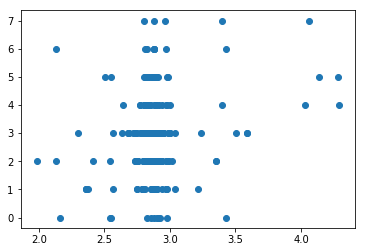

In [80]:
plt.scatter(dd[2],dd[5])

In [76]:
def m_grad_desc(X,Y,epochs,lr):
    c=np.array([0 for j in range(len(Y[0]))])
    m=np.array([np.array([0 for j in range(len(X[0][0]))]) for k in range(len(Y[0]))])
    print(m)
    n=len(X)
    for i in tqdm(range(epochs)):
        for k in range(len(X)):
            tmm=[]
            tmm1=[]
            for u in range(len(Y[0])):
                Y_pred = np.transpose(np.matmul(X[k][u],np.transpose(m[u])))+c  # The current predicted value of Y
                D_m = (-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u])  # Derivative wrt m
                D_c = (-2/n) * (Y[k][u] - Y_pred[u])  # Derivative wrt c
                #print(u,"r",m,D_m,m[u]-lr*(-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u]) )
                dm=m[u]-lr*(-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u])
                #print("t1",m[u])
                tmm.append(np.array(dm))
                m[u] = dm # Update m
                #print("t2",m[u])

                c[u] = c[u] - lr * D_c  # Update c
                tmm1.append(c[u] - lr * D_c)
            #print(tmm)
            m=tmm
            c=tmm1
            #print("aamm",m,c)
    return m,c

In [77]:

np.array(d1)[:,:3,:][0]#,np.array(d1)[:,:3,:][0][0]*np.array([1,2,3])
m,c=m_grad_desc(np.array(d1)[1:,:3],np.array(d3)[1:],10000,0.1)

  0%|          | 6/10000 [00:00<03:16, 50.97it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]]


100%|██████████| 10000/10000 [03:27<00:00, 48.18it/s]


In [125]:
#m,c=m_grad_desc(np.array(d1)[:,:3,:],np.array(d3)[:,:3],10000,0.1)
for i in range(1):
    X=np.array(d1)[:,:3,:]
    Y=np.array(d3)[:,:3]
    epochs=10000
    lr=0.1
    c=np.array([0 for j in range(len(Y[0]))])
    m=np.array([np.array([0 for j in range(len(X[0][0]))]) for k in range(len(Y[0]))])
    print(m)
    n=len(X)
    for i in tqdm(range(epochs)):
        for k in range(len(X)):
            for u in range(len(Y[0])):
                Y_pred = np.transpose(np.matmul(X[k][u],np.transpose(m[u])))+c  # The current predicted value of Y
                D_m = (-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u])  # Derivative wrt m
                D_c = (-2/n) * (Y[k][u] - Y_pred[u])  # Derivative wrt c
                print(u,"r",m,D_m,m[u]-lr*(-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u]) )
                dm=m[u]-lr*(-2/n) * np.transpose(X[k][u]) * (Y[k][u] - Y_pred[u])
                print("t1",m[u])
                m[u] = dm # Update m
                print("t2",m[u])

                c[u] = c[u] - lr * D_c  # Update c
            print("am",m,c)




















  0%|          | 0/10000 [00:00<?, ?it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00369577 -0.00294331 -0.00294331 -0.00788625 -0.00781558 -0.00527136
 -0.00425284 -0.00727514 -0.01001475 -0.00293084 -0.00879252 -0.00879252] [0.00036958 0.00029433 0.00029433 0.00078863 0.00078156 0.00052714
 0.00042528 0.00072751 0.00100147 0.00029308 0.00087925 0.00087925]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00101332 -0.0009811  -0.0009811  -0.00153505 -0.00111621 -0.00142177
 -0.00124613 -0.00155064 -0.00130225 -0.00097695 -0.00537321 -0.00537321] [1.01332286e-04 9.81104387e-05 9.81104387e-05 1.53505422e-04
 1.11621410e-04 1.42176992e-04 1.24612729e-04 1.55064380e-04
 1.30224978e-04 9.76947165e-05 5.37320941e-04 5.37320941e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0

 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00240297 -0.00231397 -0.00551794 -0.00212843 -0.00147829 -0.002096
 -0.0020236  -0.00




















  0%|          | 1/10000 [00:00<1:14:21,  2.24it/s]

 [-0.00953154 -0.00699671 -0.00699671 -0.01033942 -0.02621544 -0.0288985
 -0.00821966 -0.01696555 -0.01634296 -0.00696707 -0.00696707 -0.00696707] [0.00095315 0.00069967 0.00069967 0.00103394 0.00262154 0.00288985
 0.00082197 0.00169655 0.0016343  0.00069671 0.00069671 0.00069671]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00563568 -0.00405185 -0.00405185 -0.00616362 -0.00626663 -0.00446819
 -0.00660572 -0.00391021 -0.00530518 -0.00403468 -0.00403468 -0.00403468] [0.00056357 0.00040518 0.00040518 0.00061636 0.00062666 0.00044682
 0.00066057 0.00039102 0.00053052 0.00040347 0.00040347 0.00040347]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01291098 -0.01316851 -0.01316851 -0.01334449 -0.012

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0082897  -0.00753288 -0.00745861 -0.00765666 -0.00784409 -0.00858324
 -0.00804214 -0.0086858  -0.00710142 -0.00747983 -0.00747983 -0.00747983] [0.00082897 0.00075329 0.00074586 0.00076567 0.00078441 0.00085832
 0.00080421 0.00086858 0.00071014 0.00074798 0.00074798 0.00074798]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0




















  0%|          | 2/10000 [00:00<1:15:23,  2.21it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00703216 -0.00737595 -0.00737595 -0.0027325  -0.00659907 -0.00737595
 -0.00482354 -0.00450951 -0.00454077 -0.0073447  -0.0073447  -0.0073447 ] [0.00070322 0.0007376  0.0007376  0.00027325 0.00065991 0.0007376
 0.00048235 0.00045095 0.00045408 0.00073447 0.00073447 0.00073447]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0048414  -0.0049173  -0.0049173  -0.00114449 -0.00435175 -0.0049173
 -0.00351831 -0.00341413 -0.00332632 -0.00489647 -0.00489647 -0.00489647] [0.00048414 0.00049173 0.00049173 0.00011445 0.00043518 0.00049173
 0.00035183 0.00034141 0.00033263 0.00048965 0.00048965 0.00048965]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02374712 -0.02458652 -0.02458652 -0.00775398 -0.02190165 -0.02

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01326753 -0.00936201 -0.01419401 -0.00581606 -0.00906001 -0.00906001
 -0.00531571 -0.00804139 -0.00805035 -0.00451081 -0.00451081 -0.00451081] [0.00132675 0.0009362  0.0014194  0.00058161 0.000906   0.000906
 0.00053157 0.00080414 0.00080504 0.00045108 0.00045108 0.00045108]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01669035 -0.01766829 -0.01766829 -0.0150784  -0.01766829 -0.01766829
 -0.01301258 -0.01111754 -0.01252128 -0.01759342 -0.01759342 -0.01759342] [0.00166904 0.00176683 0.00176683 0.00150784 0.00176683 0.00176683
 0.001301




















  0%|          | 3/10000 [00:01<1:14:45,  2.23it/s]

 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00227958 -0.00147797 -0.00147797 -0.0012212  -0.00289957 -0.00381391
 -0.00467188 -0.00491612 -0.0088177  -0.00441511 -0.00441511 -0.00441511] [0.00022796 0.0001478  0.0001478  0.00012212 0.00028996 0.00038139
 0.00046719 0.00049161 0.00088177 0.00044151 0.00044151 0.00044151]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00850144 -0.00665085 -0.00665085 -0.00549541 -0.00986669 -0.00839498
 -0.01028315 -0.00993557 -0.03108742 -0.01692461 -0.01692461 -0.01692461] [0.00085014 0.00066509 0.00066509 0.00054954 0.00098667 0.0008395
 0.00102831 0.00099356 0.00310874 0.00169246

 0.00038256 0.00040862 0.00042071 0.00034295 0.00048992 0.00048992]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00996732 -0.01057816 -0.02091032 -0.00462091 -0.01057816 -0.01057816
 -0.00594162 -0.00738011 -0.00765947 -0.00489923 -0.00734884 -0.00734884] [0.00099673 0.00105782 0.00209103 0.00046209 0.00105782 0.00105782
 0.00059416 0.00073801 0.00076595 0.00048992 0.00073488 0.00073488]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00153942 -0.0013489  -0.00404669 -0.00192523 -0.00157371 -0.00157371
 -0.00158229 -0.00138605 -0.00133651 -0.00134318 -0.00134318 -0.00134318] [0.00015394 0.00013489 0.00040467 0.00019252 0.00015737 0.00015737
 0.00015823 0.0001386  0.00013365 0.00013432 0.00013432




















  0%|          | 4/10000 [00:01<1:14:42,  2.23it/s]

am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.000951   -0.00075738 -0.00075738 -0.00242617 -0.00178967 -0.00148908
 -0.00109434 -0.00245291 -0.00273639 -0.00075417 -0.0022625  -0.0022625 ] [9.50997933e-05 7.57375182e-05 7.57375182e-05 2.42616795e-04
 1.78967327e-04 1.48907663e-04 1.09434295e-04 2.45291143e-04
 2.73639225e-04 7.54165965e-05 2.26249789e-04 2.26249789e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00199399 -0.00176721 -0.00176721 -0.0036446  -0.00311829 -0.00280806
 -0.00237696 -0.004525   -0.00453676 -0.0

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00258799 -0.00266053 -0.00474269 -0.0022988  -0.00717187 -0.00717187
 -0.00265318 -0.00356241 -0.00451722 -0.00460741 -0.00460741 -0.00645037] [0.0002588  0.00026605 0.00047427 0.00022988 0.00071719 0.00071719
 0.00026532 0.00035624 0.00045172 0.00046074 0.00046074 0.00064504]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00213438 -0.00167625 -0.00167625 -0.00415156 -0.00176504 -0.00301157
 -0.00593791 -0.00263157 -0.01234815 -0.00166915 -0.00166915 -0.00166915] [0.00021344 0.00016763 0.00016763 0.00041516 0.0001765  0.00030116
 0.00059379 0.00026316 0.00123481 0.00016691 0.00016691 0.00016691]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00269727 -0.00293344 -0




















  0%|          | 5/10000 [00:02<1:14:41,  2.23it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00199399 -0.00176721 -0.00176721 -0.0036446  -0.00311829 -0.00280806
 -0.00237696 -0.004525   -0.00453676 -0.00175972 -0.00779305 -0.00779305] [0.0001994  0.00017672 0.00017672 0.00036446 0.00031183 0.00028081
 0.0002377  0.0004525  0.00045368 0.00017597 0.0007793  0.0007793 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00345729 -0.00623633 -0.00207878 -0.00334278 -0.00642571 -0.00207878
 -0.00426326 -0.00664152 -0.0062055  -0.00310495 -0.00206997 -0.00206997] [0.00034573 0.00062363 0.00020788 0.00033428 0.00064257 0.00020788
 0.00042633 0.00066415 0.00062055 0.0003105  0.000207   0.000207  ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 

 0.00032087 0.00024398 0.00056609 0.0002921  0.0002921  0.0002921 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01129339 -0.01131469 -0.01131469 -0.01895904 -0.01153843 -0.01184207
 -0.01853287 -0.01126675 -0.03550491 -0.01126675 -0.01126675 -0.01126675] [0.00112934 0.00113147 0.00113147 0.0018959  0.00115384 0.00118421
 0.00185329 0.00112668 0.00355049 0.00112668 0.00112668 0.00112668]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00420833 -0.00289272 -0.00289272 -0.00331151 -0.0031542  -0.00289272
 -0.00355665 -0.00341161 -0.00244941 -0.00288046 -0.00288046 -0.00288046] [0.00042083 0.00028927 0.00028927 0.00033115 0.00031542 0.00028927
 0.00035567 0.00034116 0.00024494 0.00028805 0.00028805




















  0%|          | 6/10000 [00:02<1:14:29,  2.24it/s]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00706873 -0.01663022 -0.00519694 -0.00844724 -0.01268407 -0.00519694
 -0.00868506 -0.01123949 -0.01378952 -0.00724489 -0.00517492 -0.00517492] [0.00070687 0.00166302 0.00051969 0.00084472 0.00126841 0.00051969
 0.00086851 0.00112395 0.00137895 0.00072449 0.00051749 0.00051749]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00160277 -0.00173967 -0.00173967 -0.00173967 -0.00161119 -0.00167543
 -0.00252946 -0.0022662  -0.00503892 -0.00173229 -0.00173229 -0.00173229] [0.00016028 0.00017397 0.00017397 0.00017397 0.00016112 0.00016754
 0.00025295 0.00022662 0.00050389 0.00017323 0.00017323 0.00017323]
t1 [0 0 0 0 0 0 0

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00112971 -0.00192848 -0.00192848 -0.00259854 -0.00213072 -0.00192848
 -0.00297034 -0.00244532 -0.00240038 -0.00192031 -0.00192031 -0.00192031] [0.00011297 0.00019285 0.00019285 0.00025985 0.00021307 0.00019285
 0.00029703 0.00024453 0.00024004 0.00019203 0.00019203 0.00019203]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01067608 -0.00964238 -0.00964238 -0.01182009 -0.01056985 -0.00964238
 -0.01305399 -0.01171386 -0.00969958 -0.00960153 -0.00960153 -0.00960153] [0.00106761 0.00096424 0.00096424 0.00118201 0.00105699 0.00096424
 0.0013054  0.00117139 0.00096996 0.00096015 0.00096015 0.00096015]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 




















  0%|          | 7/10000 [00:03<1:13:57,  2.25it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00189763 -0.00198819 -0.00198819 -0.00239888 -0.00170386 -0.00192395
 -0.00333611 -0.00156696 -0.00355831 -0.00197976 -0.00197976 -0.00197976] [0.00018976 0.00019882 0.00019882 0.00023989 0.00017039 0.0001924
 0.00033361 0.0001567  0.00035583 0.00019798 0.00019798 0.00019798]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00700078 -0.00745571 -0.00745571 -0.0082771  -0.0066301  -0.00719876
 -0.01173116 -0.00766632 -0.01719446 -0.00742412 -0.00742412 -0.00742412] [0.00070008 0.00074557 0.00074557 0.00082771 0.00066301 0.00071988
 0.00117312 0.00076663 0.00171945 0.00074241 0.00074241 0.00074241]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0

 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00586657 -0.0063961  -0.01131618 -0.00310215 -0.0063961  -0.0063961
 -0.00382557 -0.00408616 -0.00420708 -0.00342946 -0.00489923 -0.00489923] [0.00058666 0.00063961 0.00113162 0.00031021 0.00063961 0.00063961
 0.00038256 0.00040862 0.00042071 0.00034295 0.00048992 0.00048992]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00996732 -0.01057816 -0.02091032 -0.00462091 -0.01057816 -0.01057816
 -0.00594162 -0.00738011 -0.00765947 -0.00489923 -0.00734884 -0.00734884] [0.00099673 0.00105782 0.00209103 0.00046209 0.00105782 0.00105782
 0.0005




















  0%|          | 8/10000 [00:03<1:13:47,  2.26it/s]

[0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00147616 -0.0030817  -0.0030817  -0.00288702 -0.0030817  -0.0030817
 -0.00248519 -0.00254751 -0.00212134 -0.00306865 -0.00306865 -0.00306865] [0.00014762 0.00030817 0.00030817 0.0002887  0.00030817 0.00030817
 0.00024852 0.00025475 0.00021213 0.00030686 0.00030686 0.00030686]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00380405 -0.00532294 -0.00532294 -0.0048849  -0.00532294 -0.00532294
 -0.00429314 -0.00455133 -0.00361115 -0.00530039 -0.00530039 -0.00530039] [0.00038041 0.00053229 0.00053229 0.00048849 0.00053229 0.00053229
 0.00042931 0.00045513 0.00036111 0

 0.00059416 0.00073801 0.00076595 0.00048992 0.00073488 0.00073488]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00153942 -0.0013489  -0.00404669 -0.00192523 -0.00157371 -0.00157371
 -0.00158229 -0.00138605 -0.00133651 -0.00134318 -0.00134318 -0.00134318] [0.00015394 0.00013489 0.00040467 0.00019252 0.00015737 0.00015737
 0.00015823 0.0001386  0.00013365 0.00013432 0.00013432 0.00013432]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00435343 -0.00449632 -0.00854301 -0.00752753 -0.00854301 -0.00854301
 -0.00289594 -0.00332652 -0.0032122  -0.00447727 -0.00447727 -0.00447727] [0.00043534 0.00044963 0.0008543  0.00075275 0.0008543  0.0008543
 0.00028959 0.00033265 0.00032122 0.00044773 0.00044773 




















  0%|          | 9/10000 [00:04<1:13:30,  2.27it/s]

[0.00038041 0.00053229 0.00053229 0.00048849 0.00053229 0.00053229
 0.00042931 0.00045513 0.00036111 0.00053004 0.00053004 0.00053004]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00160187 -0.001454   -0.00378041 -0.00414761 -0.0017448  -0.00378041
 -0.00189144 -0.00297824 -0.00149097 -0.00144784 -0.00144784 -0.00144784] [0.00016019 0.0001454  0.00037804 0.00041476 0.00017448 0.00037804
 0.00018914 0.00029782 0.0001491  0.00014478 0.00014478 0.00014478]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00297701 -0.00319881 -0.00639761 -0.00599345 -0.00407121 -0.00639761
 -0.00249029 -0.00164746 -0.00261967 -0.00318525 -0.00318525 -0.00318525] [0.0002977  0.00031988 0.00063976 0.00059935 0.00040712

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01114841 -0.01079118 -0.0249546  -0.01706698 -0.01753566 -0.01753566
 -0.00909077 -0.00914792 -0.00882785 -0.01074545 -0.01074545 -0.01074545] [0.00111484 0.00107912 0.00249546 0.0017067  0.00175357 0.00175357
 0.00090908 0.00091479 0.00088278 0.00107455 0.00107455 0.00107455]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00428152 -0.00450418 -0.00450418 -0.00380862 -0.00342691 -0.00374394
 -0.00458371 -0.00175587 -0.00261366 -0.0044851  -0.0044851  -0.0044851 ] [0.00042815 0.00045042 0.00045042 0.00038086 0.00034269 0.00037439
 0.00045837 0.00017559 0.00026137 0.00044851 0.00044851 0.00044851]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 10/10000 [00:04<1:12:47,  2.29it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00915776 -0.00930562 -0.02035605 -0.02028211 -0.01163203 -0.02035605
 -0.00876345 -0.0092514  -0.00822128 -0.00926619 -0.00926619 -0.00926619] [0.00091578 0.00093056 0.0020356  0.00202821 0.0011632  0.0020356
 0.00087635 0.00092514 0.00082213 0.00092662 0.00092662 0.00092662]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00805382 -0.0084309  -0.0084309  -0.0084309  -0.00744254 -0.00716865
 -0.00995911 -0.01020521 -0.00475925 -0.00839518 -0.00839518 -0.00839518] [0.00080538 0.00084309 0.00084309 0.00084309 0.00074425 0.00071687
 0.00099591 0.00102052 0.00047593 0.00083952 0.00083952 0.00083952]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00286919 -0.00300279 -0.00300279 -0.00313321 -0.00489544 -0.00343857
 -0.00570657 -0.00522943 -0.00319364 -0.00299006 -0.00299006 -0.00299006] [0.00028692 0.00030028 0.00030028 0.00031332 0.00048954 0.00034386
 0.00057066 0.00052294 0.00031936 0.00029901 0.00029901 0.00029901]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02095166 -0.02202045 -0.02202045 -0.01941209 -0.02023489 -0.01956053
 -0.02594358 -0.01399605 -0.01471281 -0.02192714 -0.02192714 -0.02192714] [0.00209517 0.00220204 0.00220204 0.00194121 0.00202349 0.00195605
 0.00259436 0.0013996  0.00147128 0.00219271 0.00219271 0.00219271]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 




















  0%|          | 11/10000 [00:04<1:13:22,  2.27it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00280732 -0.00304449 -0.00304449 -0.00304449 -0.00246794 -0.0022794
 -0.00366967 -0.00173659 -0.001166   -0.00303159 -0.00303159 -0.00303159] [0.00028073 0.00030445 0.00030445 0.00030445 0.00024679 0.00022794
 0.00036697 0.00017366 0.0001166  0.00030316 0.00030316 0.00030316]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02410389 -0.0257611  -0.0257611  -0.0257611  -0.0216429  -0.02035782
 -0.03079721 -0.02143947 -0.01177905 -0.02565194 -0.02565194 -0.02565194] [0.00241039 0.00257611 0.00257611 0.00257611 0.00216429 0.00203578
 0.00307972 0.00214395 0.00117791 0.00256519 0.00256519 0.00256519]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01262113 -0.01358333 -0.01367021 -0.01182306 -0.01038782 -0.01240874
 -0.01103142 -0.00650687 -0.01059699 -0.01361229 -0.01361229 -0.01361229] [0.00126211 0.00135833 0.00136702 0.00118231 0.00103878 0.00124087
 0.00110314 0.00065069 0.0010597  0.00136123 0.00136123 0.00136123]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00200081 -0.00207161 -0.0020885  -0.00192358 -0.00158408 -0.00161545
 -0.00159373 -0.00112792 -0.00140065 -0.00207966 -0.00207966 -0.00207966] [0.00020008 0.00020716 0.00020885 0.00019236 0.00015841 0.00016155
 0.00015937 0.00011279 0.00014006 0.00020797 0.00020797 0.00020797]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02578048 -0.02733721 -0.02753029 -0.02439673 -0.02090516 -




















  0%|          | 12/10000 [00:05<1:13:13,  2.27it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0022247  -0.00218156 -0.00218156 -0.00638753 -0.00233665 -0.00142151
 -0.00216102 -0.00148108 -0.00232946 -0.00313779 -0.00313779 -0.00313779] [0.00022247 0.00021816 0.00021816 0.00063875 0.00023367 0.00014215
 0.0002161  0.00014811 0.00023295 0.00031378 0.00031378 0.00031378]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00154989 -0.00145437 -0.00145437 -0.00345722 -0.00172142 -0.0008453
 -0.00159817 -0.00117706 -0.00146259 -0.00217232 -0.00217232 -0.00217232] [1.54989316e-04 1.45437290e-04 1.45437290e-04 3.45721694e-04
 1.72141877e-04 8.45302894e-05 1.59816683e-04 1.17705603e-04
 1.46258970e-04 2.17231546e-04 2.17231546e-04 2.17231546e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00754918 -0.

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0051814  -0.01242334 -0.02129715 -0.01041921 -0.01242334 -0.02129715
 -0.00721185 -0.01307007 -0.00912198 -0.01811423 -0.01811423 -0.02297415] [0.00051814 0.00124233 0.00212971 0.00104192 0.00124233 0.00212971
 0.00072119 0.00130701 0.0009122  0.00181142 0.00181142 0.00229741]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00312181 -0.00432598 -0.00665536 -0.00369006 -0.00432598 -0.00665536
 -0.00272136 -0.00614211 -0.00473207 -0.00563308 -0.00563308 -0.00728987] [0.00031218 0.0004326  0.00066554 0.00036901 0.0004326  0.00066554
 0.00027214 0.00061421 0.00047321 0.00056331 0.00056331 0.00072899]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 13/10000 [00:05<1:13:23,  2.27it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00095908 -0.00059097 -0.00059097 -0.00079631 -0.00161015 -0.00471777
 -0.00116066 -0.00200706 -0.00137727 -0.00058847 -0.00058847 -0.00058847] [9.59079484e-05 5.90973259e-05 5.90973259e-05 7.96311425e-05
 1.61015172e-04 4.71776958e-04 1.16066146e-04 2.00705537e-04
 1.37726819e-04 5.88469135e-05 5.88469135e-05 5.88469135e-05]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00298116 -0.00295487 -0.00295487 -0.00274953 -0.00190439 -0.00099789
 -0.00280462 -0.00196574 -0.0019407  -0.00294235 -0.00294235 -0.00294235] [2.98115960e-04 2.95486630e-04 2.95486630e-04 2.74952813e-04
 1.90438629e-04 9.97893406e-05 2.80461886e-04 1.96573732e-04
 1.94069608e-04 2.9423

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01635169 -0.0318348  -0.05279918 -0.02684375 -0.0318348  -0.05279918
 -0.01897059 -0.0372042  -0.02700496 -0.04484377 -0.04484377 -0.05721446] [0.00163517 0.00318348 0.00527992 0.00268437 0.00318348 0.00527992
 0.00189706 0.00372042 0.0027005  0.00448438 0.00448438 0.00572145]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00827116 -0.00876562 -0.00876562 -0.00819456 -0.0085567  -0.00824331
 -0.00712903 -0.00466602 -0.00364228 -0.00872848 -0.00872848 




















  0%|          | 14/10000 [00:06<1:13:45,  2.26it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00788048 -0.00709168 -0.00709168 -0.00709168 -0.00702908 -0.01143133
 -0.00793056 -0.00794559 -0.00663593 -0.00706163 -0.00706163 -0.00706163] [0.00078805 0.00070917 0.00070917 0.00070917 0.00070291 0.00114313
 0.00079306 0.00079456 0.00066359 0.00070616 0.00070616 0.00070616]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00227958 -0.00147797 -0.00147797 -0.0012212  -0.00289957 -0.00381391
 -0.00467188 -0.00491612 -0.0088177  -0.00441511 -0.00441511 -0.

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00827116 -0.00876562 -0.00876562 -0.00819456 -0.0085567  -0.00824331
 -0.00712903 -0.00466602 -0.00364228 -0.00872848 -0.00872848 -0.00872848] [0.00082712 0.00087656 0.00087656 0.00081946 0.00085567 0.00082433
 0.0007129  0.0004666  0.00036423 0.00087285 0.00087285 0.00087285]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01162095 -0.01205273 -0.01205273 -0.01348039 -0.01195987 -0.01180434
 -0.01097328 -0.0090883  -0.00870527 -0.01200166 -0.01200166 -0.01200166] [0.00116209 0.00120527 0.00120527 0.00134804 0.00119599 0.00118043
 0.00109733 0.00090883 0.00087053 0.00120017 0.00120017 0.00120017]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 15/10000 [00:06<1:13:20,  2.27it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00227958 -0.00147797 -0.00147797 -0.0012212  -0.00289957 -0.00381391
 -0.00467188 -0.00491612 -0.0088177  -0.00441511 -0.00441511 -0.00441511] [0.00022796 0.0001478  0.0001478  0.00012212 0.00028996 0.00038139
 0.00046719 0.00049161 0.00088177 0.00044151 0.00044151 0.00044151]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00850144 -0.00665085 -0.00665085 -0.00549541 -0.00986669 -0.00839498
 -0.01028315 -0.00993557 -0.03108742 -0.01692461 -0.01692461 -0.01692461] [0.00085014 0.00066509 0.00066509 0.00054954 0.00098667 0.0008395
 0.00102831 0.00099356 0.00310874 0.00169246 0.00169246 0.00169246]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]


 -0.00201581 -0.00159308 -0.00263172 -0.00206348 -0.00206348 -0.00206348] [0.00021061 0.00020723 0.00020723 0.0001918  0.00020723 0.0001928
 0.00020158 0.00015931 0.00026317 0.00020635 0.00020635 0.00020635]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00258531 -0.00266433 -0.00266433 -0.00245861 -0.00266433 -0.00243352
 -0.00258907 -0.00101355 -0.00216759 -0.00265304 -0.00265304 -0.00265304] [0.00025853 0.00026643 0.00026643 0.00024586 0.00026643 0.00024335
 0.00025891 0.00010136 0.00021676 0.0002653  0.0002653  0.0002653 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00938287 -0.00947319 -0.00947319 -0.00875316 -0.00947319 -0.00872306
 -0.00920976 -0.00521326 -0.00959863 -0.00943305 -0.00943305 -0.00943305] [0.00093829 0.00094732 0.00094732 0.00087532 0.00094732 0.00087231
 0.00092




















  0%|          | 16/10000 [00:07<1:13:28,  2.26it/s]

[-0.0032625  -0.00278161 -0.00278161 -0.00403805 -0.00267789 -0.00347937
 -0.00532749 -0.00485603 -0.00650613 -0.00276982 -0.00553964 -0.00553964] [0.00032625 0.00027816 0.00027816 0.0004038  0.00026779 0.00034794
 0.00053275 0.0004856  0.00065061 0.00027698 0.00055396 0.00055396]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00599932 -0.00611954 -0.00611954 -0.00611954 -0.00528977 -0.00495975
 -0.00530863 -0.00832597 -0.00950461 -0.00609361 -0.00664757 -0.00664757] [0.00059993 0.00061195 0.00061195 0.00061195 0.00052898 0.00049597
 0.00053086 0.0008326  0.00095046 0.00060936 0.00066476 0.00066476]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01852363 -0.01780229 -0.01780229 -0.02031517 -0.01593532 -0.01687823
 -0.02127223 -0.02636399 -0.0320215  -0.01772686 -0.02437443 -0.02437443] [

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00313897 -0.00339296 -0.00339296 -0.00437539 -0.00356549 -0.00339296
 -0.00489056 -0.00304552 -0.00361341 -0.00337858 -0.00337858 -0.00337858] [0.0003139  0.0003393  0.0003393  0.00043754 0.00035655 0.0003393
 0.00048906 0.00030455 0.00036134 0.00033786 0.00033786 0.00033786]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00064457 -0.00056549 -0.00056549 -0.00115495 -0.0010615  -0.00056549
 -0.00239856 -0.00152875 -0.00360382 -0.0005631  -0.0005631  -0.0005631 ] [6.44566888e-05 5.65493627e-05 5.65493627e-05 1.15494885e-04
 1.06149863e-04 5.65493627e-05 2.39855560e-04 1.52874972e-04
 3.60382379e-04 5.63097467e-05 5.63097467e-05 5.63097467e-05]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0




















  0%|          | 17/10000 [00:07<1:13:52,  2.25it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00

2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00756707 -0.00791691 -0.00791691 -0.01106067 -0.00925397 -0.00791691
 -0.01457823 -0.00914854 -0.01443446 -0.00788336 -0.00788336 -0.00788336] [0.00075671 0.00079169 0.00079169 0.00110607 0.0009254  0.00079169
 0.00145782 0.00091485 0.00144345 0.00078834 0.00078834 0.00078834]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00303038 -0.00465558 -0.00465558 -0.00478002 -0.00465558 -0.00465558
 -0.00370869 -0.00335056 -0.00499701 -0.00320944 -0.00320944 -0.00320944] [0.00030304 0.00046556 0.00046556 0.000478   0.00046556 0.00046556
 0.00037087 0.00033506 0.0004997  0.00032094 0.00032094 0.00032094]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 18/10000 [00:08<1:14:35,  2.23it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00367471 -0.00238961 -0.00238961 -0.00235502 -0.00238961 -0.00238961
 -0.00208163 -0.00179896 -0.00202931 -0.00456068 -0.00337094 -0.00337094] [0.00036747 0.00023896 0.00023896 0.0002355  0.00023896 0.00023896
 0.00020816 0.0001799  0.00020293 0.00045607 0.00033709 0.00033709]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0

 -0.00215177 -0.0017595  -0.00132095 -0.00285284 -0.00285284 -0.00285284] [0.00027064 0.00034022 0.00034022 0.00033399 0.00034022 0.00034022
 0.00021518 0.00017595 0.0001321  0.00028528 0.00028528 0.00028528]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01266477 -0.01718985 -0.01718985 -0.01718985 -0.01718985 -0.01718985
 -0.01201833 -0.01030435 -0.01145838 -0.01337267 -0.01337267 -0.01337267] [0.00126648 0.00171899 0.00171899 0.00171899 0.00171899 0.00171899
 0.00120183 0.00103044 0.00114584 0.00133727 0.00133727 0.00133727]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00757816 -0.00604    -0.008154   -0.00183759 -0.004832   -0.004832
 -0.00340006 -0.00375197 -0.00538226 -0.00270648 -0.00270




















  0%|          | 19/10000 [00:08<1:13:23,  2.27it/s]

[-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00573271 -0.00318615 -0.00318615 -0.00315156 -0.00318615 -0.00318615
 -0.00397931 -0.0025955  -0.0031119  -0.00674188 -0.00436239 -0.00436239] [0.00057327 0.00031862 0.00031862 0.00031516 0.00031862 0.00031862
 0.00039793 0.00025955 0.00031119 0.00067419 0.00043624 0.00043624]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00252951 -0.00341123 -0.00341123 -0.00353822 -0.00333276 -0.00346698
 -0.00220326 -0.003086   -0.00339987 -0.00339677 -0.00339677 -0.00339677] [0.00025295 0.00034112 0.00034112 0.00035382 0.00033328 0.0003467
 0.00022033 0.0003086  0.00033999 0.

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01326753 -0.00936201 -0.01419401 -0.00581606 -0.00906001 -0.00906001
 -0.00531571 -0.00804139 -0.00805035 -0.00451081 -0.00451081 -0.00451081] [0.00132675 0.0009362  0.0014194  0.00058161 0.000906   0.000906
 0.00053157 0.00080414 0.00080504 0.00045108 0.00045108 0.00045108]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01669035 -0.01766829 -0.01766829 -0.0150784  -0.01766829 -0.01766829
 -0.01301258 -0.01111754 -0.012521




















  0%|          | 20/10000 [00:08<1:13:38,  2.26it/s]

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00199264 -0.00243659 -0.00243659 -0.00421448 -0.0040658  -0.00389854
 -0.00345872 -0.00307878 -0.003595   -0.00242627 -0.00242627 -0.00242627] [0.00019926 0.00024366 0.00024366 0.00042145 0.00040658 0.00038985
 0.00034587 0.00030788 0.0003595  0.00024263 0.00024263 0.00024263]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01057749 -0.01388857 -0.01388857 -0.01693637 -0.01609698 -0.01624876
 -0.01179785 -0.01387618 -0.01559211 -0.01382972 -0.01382972 -0.01382972] [0.00105775 0.00138886 0.00138886 0.00169364 0.0016097  0.00162488
 0.00117978 0.00138762 0.00155921 0.00138297 0.00138297 0.00138297]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 

 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01669035 -0.01766829 -0.01766829 -0.0150784  -0.01766829 -0.01766829
 -0.01301258 -0.01111754 -0.01252128 -0.01759342 -0.01759342 -0.01759342] [0.00166904 0.00176683 0.00176683 0.00150784 0.00176683 0.00176683
 0.00130126 0.00111175 0.00125213 0.00175934 0.00175934 0.00175934]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02532096 -0.02705456 -0.02705456 -0.02379323 -0.02705456 -0.02705456
 -0.02056231 -0.01746241 -0.02143964 -0.02693993 -0.02693993 -0.02693993] [0.0025321  0.00270546 0.00270546 0.00237932 0.00270546 0.00270546
 0.002




















  0%|          | 21/10000 [00:09<1:14:17,  2.24it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00458603 -0.00456371 -0.00807426 -0.00624312 -0.00667004 -0.00667004
 -0.00501443 -0.00618214 -0.00737215 -0.00734092 -0.00734092 -0.00734092] [0.0004586  0.00045637 0.00080743 0.00062431 0.000667   0.000667
 0.00050144 0.00061821 0.00073722 0.00073409 0.00073409 0.00073409]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0050903  -0.00526582 -0.0108827  -0.00804451 -0.00877637 -0.00877637
 -0.0052569  -0.00604528 -0.00589653 -0.00838962 -0.00838962 -0.00838962] [0.00050903 0.00052658 0.00108827 0.00080445 0.00087764 0.00087764
 0.00052569 0.00060453 0.00058965 0.00083896 0.00083896 0.00083896]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [

 -0.02056231 -0.01746241 -0.02143964 -0.02693993 -0.02693993 -0.02693993] [0.0025321  0.00270546 0.00270546 0.00237932 0.00270546 0.00270546
 0.00205623 0.00174624 0.00214396 0.00269399 0.00269399 0.00269399]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00639098 -0.00683655 -0.00976649 -0.00581851 -0.00449286 -0.00944094
 -0.00485014 -0.00387349 -0.00239196 -0.00680758 -0.00680758 -0.00680758] [0.0006391  0.00068365 0.00097665 0.00058185 0.00044929 0.00094409
 0.00048501 0.00038735 0.0002392  0.00068076 0.00068076 0.00068076]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0




















  0%|          | 22/10000 [00:09<1:14:21,  2.24it/s]

[-0.01935265 -0.01965908 -0.03791393 -0.02857527 -0.03089283 -0.03089283
 -0.02054266 -0.02445484 -0.02653737 -0.03146107 -0.03146107 -0.03146107] [0.00193526 0.00196591 0.00379139 0.00285753 0.00308928 0.00308928
 0.00205427 0.00244548 0.00265374 0.00314611 0.00314611 0.00314611]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. 

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01058037 -0.01106869 -0.01855634 -0.00948509 -0.00743523 -0.01595194
 -0.00812357 -0.0073028  -0.00592059 -0.01102179 -0.01102179 -0.01102179] [0.00105804 0.00110687 0.00185563 0.00094851 0.00074352 0.00159519
 0.00081236 0.00073028 0.00059206 0.00110218 0.00110218 0.00110218]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00450155 -0.01443576 -0.01443576 -0.01297225 -0.0139011  -0.0139011
 -0.01652002 -0.00734928 -0.0099025  -0.00958306 -0.00958306 -0.00958306] [0.00045015 0.00144358 0.00144358 0.00129722 0.00139011 0.00139011
 0.001652   0.00073493 0.00099025 0.00095831 0.00095831 0.00095831]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0




















  0%|          | 23/10000 [00:10<1:13:21,  2.27it/s]

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00703216 -0.00737595 -0.00737595 -0.0027325  -0.00659907 -0.00737595
 -0.00482354 -0.00450951 -0.00454077 -0.0073447  -0.0073447  -0.0073447 ] [0.00070322 0.0007376  0.0007376  0.00027325 0.00065991 0.0007376
 0.00048235 0.00045095 0.00045408 0.00073447 0.00073447 0.00073447]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0048414  -0.0049173  -0.0049173  -0.00114449 -0.00435175 -0.0049173
 -0.00351831 -0.00341413 -0.003326

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00123696 -0.00681689 -0.00681689 -0.00545759 -0.0060149  -0.0060149
 -0.00547458 -0.00469128 -0.00537773 -0.00519082 -0.00519082 -0.00519082] [0.0001237  0.00068169 0.00068169 0.00054576 0.00060149 0.00060149
 0.00054746 0.00046913 0.00053777 0.00051908 0.00051908 0.00051908]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01076395 -0.04116865 -0.04116865 -0.0354358  -0.03836169 -0.03836169
 -0.04168405 -0.02380756 -0.0298774  -0.02888228 -0.02888228 -0.02888228] [0.0010764  0.00411686 0.00411686 0.00354358 0.00383617 0.00383617
 0.0041684  0.00238076 0.00298774 0.00288823 0.00288823 0.00288823]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0




















  0%|          | 24/10000 [00:10<1:12:46,  2.28it/s]

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0048414  -0.0049173  -0.0049173  -0.00114449 -0.00435175 -0.0049173
 -0.00351831 -0.00341413 -0.00332632 -0.00489647 -0.00489647 -0.00489647] [0.00048414 0.00049173 0.00049173 0.00011445 0.00043518 0.00049173
 0.00035183 0.00034141 0.00033263 0.00048965 0.00048965 0.00048965]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02374712 -0.02458652 -0.02458652 -0.00775398 -0.02190165 -0.02458652
 -0.01668371 -0.01584729 -0.01573418 -0.02448234 -0.02448234 -0.02448234] [0.00237471 0.00245865 0.00245865 0.0007754  0.00219016 0.00245865
 0.00166837 0.00158473 0.00157342 0.00244823 0.00244823 0.00244823]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00309615 -0.00337562 -0.00597225 -0.00153542 -0.00337562 -0.00337562
 -0.0012389  -0.00147546 -0.00222034 -0.00155138 -0.00155138 -0.00155138] [0.00030962 0.00033756 0.00059723 0.00015354 0.00033756 0.00033756
 0.00012389 0.00014755 0.00022203 0.00015514 0.00015514 0.00015514]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00526038 -0.00558276 -0.01103569 -0.00296357 -0.00558276 -0.00558276
 -0.00260929 -0.00310716 -0.00404238 -0.00297347 -0.00297347 -0.00297347] [0.00052604 0.00055828 0.00110357 0.00029636 0.00055828 0.00055828
 0.00026093 0.00031072 0.00040424 0.000297




















  0%|          | 25/10000 [00:11<1:11:57,  2.31it/s]

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00153903 -0.00165347 -0.00349065 -0.00155771 -0.00154059 -0.00165347
 -0.00187533 -0.00171574 -0.00191347 -0.00164646 -0.00164646 -0.00164646] [0.0001539  0.00016535 0.00034907 0.00015577 0.00015406 0.00016535
 0.00018753 0.00017157 0.00019135 0.00016465 0.00016465 0.00016465]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00400288 -0.00422552 -0.00808361 -0.00412977 -0.00293093 -0.00422552
 -0.00410875 -0.00367826 -0.00429014 -0.00420762 -0.00420762 -0.00420762] [0.00040029 0.00042255 0.00080836 0.00041298 0.00029309 0.00042255
 0.00041088 0.00036783 0.00042901 0.000420

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00177069 -0.00155694 -0.00155694 -0.00150285 -0.00122181 -0.00089063
 -0.00206493 -0.00098299 -0.00158729 -0.00155035 -0.00155035 -0.00155035] [1.77069500e-04 1.55694493e-04 1.55694493e-04 1.50284769e-04
 1.22180594e-04 8.90625278e-05 2.06493120e-04 9.82986418e-05
 1.58729216e-04 1.55034771e-04 1.55034771e-04 1.55034771e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00518542 -0.00498222 -0.00498222 -0.00449535 -0.0041




















  0%|          | 26/10000 [00:11<1:11:41,  2.32it/s]

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00202897 -0.0013611  -0.0013611  -0.0014084  -0.0013611  -0.0013611
 -0.0026184  -0.00218238 -0.00127229 -0.00135534 -0.00135534 -0.00135534] [0.0002029  0.00013611 0.00013611 0.00014084 0.00013611 0.00013611
 0.00026184 0.00021824 0.00012723 0.00013553 0.00013553 0.00013553]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00370843 -0.00272221 -0.00272221 -0.00286409 -0.00272221 -0.00272221
 -0.00415829 -0.00366345 -0.00279

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00518542 -0.00498222 -0.00498222 -0.00449535 -0.00415757 -0.00242118
 -0.00546382 -0.00246076 -0.00413778 -0.00496111 -0.00496111 -0.00496111] [0.00051854 0.00049822 0.00049822 0.00044953 0.00041576 0.00024212
 0.00054638 0.00024608 0.00041378 0.00049611 0.00049611 0.00049611]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00643859 -0.00698853 -0.00698853 -0.00716198 -0.00647243 -0.00673048
 -0.01016129 -0.00910371 -0.02024221 -0.00695892 -0.00695892 -0.00695892] [0.00064386 0.00069885 0.00069885 0.0007162  0.00064724 0.00067305
 0.00101613 0.00091037 0.00202422 0.00069589 0.00069589 0.00069589]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 




















  0%|          | 27/10000 [00:11<1:11:41,  2.32it/s]

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00370843 -0.00272221 -0.00272221 -0.00286409 -0.00272221 -0.00272221
 -0.00415829 -0.00366345 -0.00279949 -0.00271067 -0.00271067 -0.00271067] [0.00037084 0.00027222 0.00027222 0.00028641 0.00027222 0.00027222
 0.00041583 0.00036634 0.00027995 0.00027107 0.00027107 0.00027107]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00223573 -0.00772615 -0.00772615 -0.0048152  -0.00175421 -0.00772615
 -0.00535538 -0.00277317 -0.00275953 -0.00512894 -0.00512894 -0.00897564] [0.00022357 0.00077261 0.00077261 0.00048152 0.00017542 0.00077261
 0.00053554 0.00027732 0.00027595 0.00051289 0.00051289 0.00089756]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00190577 -0.00199672 -0.00199672 -0.00173656 -0.00171118 -0.00193221
 -0.00335043 -0.00157369 -0.00357359 -0.00198826 -0.00198826 -0.00198826] [0.00019058 0.00019967 0.00019967 0.00017366 0.00017112 0.00019322
 0.00033504 0.00015737 0.00035736 0.00019883 0.00019883 0.00019883]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01757709 -0.01871928 -0.01871928 -0.01763526 -0.01664641 -0.01807416
 -0.02945379 -0.01924808 -0.04317069 -0.01863996 -0.01863996 -0.01863996] [0.00175771 0.00187193 0.00187193 0.00176353 0.00166464 0.00180742
 0.00294538 0.00192481 0.00431707 0.001864   0.001864   0.001864  ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 28/10000 [00:12<1:12:01,  2.31it/s]

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00071273 -0.00289731 -0.00289731 -0.00125291 -0.00103738 -0.00289731
 -0.0016976  -0.00142137 -0.0015039  -0.00144251 -0.00144251 -0.00288503] [7.12731638e-05 2.89730526e-04 2.89730526e-04 1.25290719e-04
 1.03738260e-04 2.89730526e-04 1.69759717e-04 1.42137104e-04
 1.50389786e-04 1.44251427e-04 1.44251427e-04 2.88502854e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00549178 -0.02028114 -0.02028114 -0.01098152 -0.00574346 -0.02028114
 -0.01312586 -0.00842387 -0.00865099 -0.01202095 -0.01202095 -0.02211855] [0.00054918 0.00202811 0.00202811 0.00109815 0.00057435 0.00202811
 0.00131259 0.00084239 0.0008651  0.0012021  0.0012021  0.00221186]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0082897  -0.00753288 -0.00745861 -0.00765666 -0.00784409 -0.00858324
 -0.00804214 -0.0086858  -0.00710142 -0.00747983 -0.00747983 -0.00747983] [0.00082897 0.00075329 0.00074586 0.




















  0%|          | 29/10000 [00:12<1:11:37,  2.32it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00220813 -0.00232124 -0.0044974  -0.00224563 -0.00232124 -0.00229419
 -0.00273311 -0.00296056 -0.00369824 -0.00447834 -0.00447834 -0.00447834] [0.00022081 0.00023212 0.00044974 0.00022456 0.00023212 0.00022942
 0.00027331 0.00029606 0.00036982 0.00044783 0.00044783 0.00044783]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00364783 -0.00348186 -0.00870464 -0.00469165 -0.00348186 -0.00350399
 -0.00593834 -0.0083358  -0.00759812 -0.00866776 -0.00866776 -0.00866776] [0.00036478 0.00034819 0.00087046 0.00046917 0.00034819 0.0003504
 0.00059383 0.00083358 0.00075981 0.00086678 0.00086678 0.00086678]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01369628 -0.01392743 -0.02959578 -0.01523804 -0.01392743 -0.013

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0082897  -0.00753288 -0.00745861 -0.00765666 -0.00784409 -0.00858324
 -0.00804214 -0.0086858  -0.00710142 -0.00747983 -0.00747983 -0.00747983] [0.00082897 0.00075329 0.00074586 0.00076567 0.00078441 0.00085832
 0.00080421 0.00086858 0.00071014 0.00074798 0.00074798 0.00074798]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0010928  -0.00116235 -0.00111637 -0.00096784 -0.00188852 -0.00287994
 -0.00128377 -0.00189795 -0.00254868 -0.00110812 -0.00110812 -0.00110812] [1.09279761e-04 1.16235000e-04 1.11637469e-04 9.67839096e-05
 1.88852403e-04 2.87994021e-04 1.28377196e-04 1.89795487e-04
 2.54868225e-04 1.10812272e-04 1.10812272e-04 1.10812272e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 




















  0%|          | 30/10000 [00:13<1:12:29,  2.29it/s]

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00452845 -0.00521961 -0.00521961 -0.00567301 -0.00521961 -0.0077133
 -0.00773541 -0.00923384 -0.00498738 -0.00519749 -0.00519749 -0.00519749] [0.00045285 0.00052196 0.00052196 0.0005673  0.00052196 0.00077133
 0.00077354 0.00092338 0.00049874 0.00051975 0.00051975 0.00051975]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00119063 -0.00347974 -0.00347974 -0.0042354  -0.00347974 -0.00240522
 -0.0031572  -0.00220617 -0.00180069 -0.00346499 -0.00346499 -0.00346499] [0.00011906 0.00034797 0.00034797 0.00042354 0.00034797 0.00024052
 0.00031572 0.00022062 0.00018007 0.0003465  0.0003465  0.0003465 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0

2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01542413 -0.01469324 -0.01441031 -0.01408023 -0.01801289 -0.02296408
 -0.01585794 -0.01917288 -0.01966328 -0.0144056  -0.0144056  -0.0144056 ] [0.00154241 0.00146932 0.00144103 0.00140802 0.00180129 0.00229641
 0.00158579 0.00191729 0.00196633 0.00144056 0.00144056 0.00144056]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00633042 -0.00682494 -0.00682494 -0.00587639 -0.00620029 -0.01364988
 -0.00600074 -0.00653864 -0.00630729 -0.00679602 -0.00679602 -0.00679602] [0.00063304 0.00068249 0.00068249 0.00058764 0.00062003 0.00136499
 0.00060007 0.00065386 0.00063073 0.0006796  0.0006796  0.0006796 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 31/10000 [00:13<1:12:43,  2.28it/s]

2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01080046 -0.02087843 -0.02087843 -0.02450562 -0.02087843 -0.01990528
 -0.02294268 -0.02113646 -0.0138526  -0.02078996 -0.02078996 -0.02078996] [0.00108005 0.00208784 0.00208784 0.00245056 0.00208784 0.00199053
 0.00229427 0.00211365 0.00138526 0.002079   0.002079   0.002079  ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00520258 -0.004736   -0.004736   -0.00607302 -0.00655214 -0.00497933
 -0.0034316  -0.00353695 -0.00675784 -0.00471594 -0.00471594 -0.00471594] [0.00052026 0.0004736  0.0004736  0.0006073  0.00065521 0.00049793
 0.00034316 0.0003537  0.00067578 0.00047159 0.00047159 0.00047159]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00342597 -0.00363997 -0.00363997 -0.00332379 -0.00452297 -0.00818993
 -0.00346645 -0.00326016 -0.00302495 -0.00362455 -0.00362455 -0.00362455] [0.0003426  0.000364   0.000364   0.00033238 0.0004523  0.00081899
 0.00034665 0.00032602 0.0003025  0.00036245 0.00036245 0.00036245]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01911562 -0.02047483 -0.02047483 -0.01810345 -0.02164123 -0.04322463
 -0.01866737 -0.01904814 -0.01807453 -0.02038807 -0.02038807 -0.02038807] [0.00191156 0.00204748 0.00204748 0.00181034 0.00216412 0.00432246
 0.00186674 0.00190481 0.00180745 0.00203881 0.00203881 0.00203881]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00273767 -0.00269879 -0




















  0%|          | 32/10000 [00:14<1:11:42,  2.32it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00182617 -0.00148    -0.00148    -0.00189139 -0.00208204 -0.00130315
 -0.00112881 -0.00109244 -0.00150007 -0.00147373 -0.00147373 -0.00147373] [0.00018262 0.000148   0.000148   0.00018914 0.0002082  0.00013032
 0.00011288 0.00010924 0.00015001 0.00014737 0.00014737 0.00014737]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01328239 -0.01154401 -0.01154401 -0.01478371 -0.01607432 -0.01137845
 -0.00853384 -0.00858275 -0.01463696 -0.0114951  -0.0114951  -0.0114951 ] [0.00132824 0.0011544  0.0011544  0.00147837 0.00160743 0.00113785
 0.00085338 0.00085828 0.0014637  0.00114951 0.00114951 0.00114951]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 

 0.0002188  0.00020157 0.00020127 0.00026874 0.00026874 0.00055539]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00122284 -0.00125943 -0.00125943 -0.00116566 -0.0008752  -0.00115118
 -0.00121369 -0.00127544 -0.00103072 -0.0012541  -0.0012541  -0.00214988] [1.22284012e-04 1.25943384e-04 1.25943384e-04 1.16566244e-04
 8.75199788e-05 1.15117742e-04 1.21369169e-04 1.27544359e-04
 1.03072310e-04 1.25409726e-04 1.25409726e-04 2.14988101e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00792102 -0.00791644 -0.00791644 -0.00810398 -0.00484257 -0.00518563
 -0.00680338 -0.0065823  -0.00608676 -0.0078829  -0.0078829  -0.01540748] [0.0007921  0.00079164 0.00079164 0.0008104  0.00048426 0.00051856
 0.00068034 0.00065823 0.00060868 0.00078829 0.00078829 0.00154075]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2




















  0%|          | 33/10000 [00:14<1:10:59,  2.34it/s]

[0.0008947  0.00078276 0.00078276 0.00098675 0.00087397 0.00056883
 0.00176951 0.0008093  0.00122141 0.00077945 0.00077945 0.00077945]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00265067 -0.00260921 -0.00260921 -0.00294918 -0.00294089 -0.00196796
 -0.0043367  -0.0023107  -0.00308185 -0.00259815 -0.00259815 -0.00259815] [0.00026507 0.00026092 0.00026092 0.00029492 0.00029409 0.0001968
 0.00043367 0.00023107 0.00030819 0.00025982 0.00025982 0.00025982]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02253207 -0.02087367 -0.02087367 -0.02495332 -0.02341654 -0.01545625
 -0.04094025 -0.02003342 -0.02861285 -0.02078522 -0.02078522 -0.02078522] [0.00225321 0.00208737 0.00208737 0.00249533 0.00234165 0.00154562
 0.00409403 0.00200334 0.00286128 0.00207852 0.00207852 0.00207852]
t1 [0 0 0 0 0 

am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00226499 -0.00132252 -0.00240458 -0.00157877 -0.0016832  -0.0016832
 -0.00062662 -0.00054969 -0.00106219 -0.00191551 -0.00191551 -0.0005986 ] [2.26499008e-04 1.32251783e-04 2.40457787e-04 1.57876839e-04
 1.68320451e-04 1.68320451e-04 6.26616690e-05 5.49690576e-05
 1.06219171e-04 1.91551118e-04 1.91551118e-04 5.98597245e-05]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00528192 -0.0037271  -0.00565076 -0.00409797 -0.00384732 -0.00384732
 -0.00179375 -0.00156858 -0.00320492 -0.00




















  0%|          | 34/10000 [00:14<1:10:37,  2.35it/s]

am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00257629 -0.00279104 -0.00279104 -0.00157727 -0.00134386 -0.00337862
 -0.00257941 -0.00167064 -0.00341348 -0.00131647 -0.00131647 -0.00131647] [0.00025763 0.0002791  0.0002791  0.00015773 0.00013439 0.00033786
 0.00025794 0.00016706 0.00034135 0.00013165 0.00013165 0.00013165]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00353548 -0.00381931 -0.00381931 -0.00162209 -0.00173288 -0.00646345
 -0.00350809 -0.00269891 -0.00469073 -0.00146274 -0.00146274 -0.00146274] [0.00035355 0.00038193 0.00038193 0.00016221 0.00017329 0.00064635
 0.00035081 0.00026989 0.00046907 0.00014627 0.00014627 0.00014627]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00528192 -0.0037271  -0.00565076 -0.00409797 -0.00384732 -0.00384732
 -0.00179375 -0.00156858 -0.00320492 -0.00407046 -0.00407046 -0.00191551] [0.00052819 0.00037271 0.00056508 0.0004098  0.00038473 0.00038473
 0.00017938 0.00015686 0.00032049 0.00040705 0.00040705 0.00019155]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00257629 -0.00279104 -0.00279104 -0.00157727 -0.00134386 -0.00337862
 -0.00257941 -0.00167064 -0.00341348 -0.00131647 -0.00131647 -0.00131647] [0.00025763 0.0002791  0.0002791  0.00015773 0.00013439 0.00033786
 0.00025794 0.00016706 0.00034135 0.00013165 0.00013165 0.00013165]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00353548 -0.00381931 -0




















  0%|          | 35/10000 [00:15<1:10:56,  2.34it/s]

[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0130321  -0.01410208 -0.01410208 -0.00716494 -0.00663089 -0.01983104
 -0.01300035 -0.00906028 -0.01727654 -0.00614352 -0.00614352 -0.00614352] [0.00130321 0.00141021 0.00141021 0.00071649 0.00066309 0.0019831
 0.00130004 0.00090603 0.00172765 0.00061435 0.00061435 0.00061435]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00608356 -0.00520944 -0.00520944 -0.0083351  -0.0083351  -0.0083351
 -0.0031058  -0.00560677 -0.00581205 -0.00778104 -0.00778104 -0.00778104] [0.00060836 0.00052094 0.00052094 0.00083351 0.00083351 0.00083351
 0.00031058 0.00056068 0.00058121 0.0007781  0.0007781  0.0007781 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0

 0.00035081 0.00026989 0.00046907 0.00014627 0.00014627 0.00014627]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0130321  -0.01410208 -0.01410208 -0.00716494 -0.00663089 -0.01983104
 -0.01300035 -0.00906028 -0.01727654 -0.00614352 -0.00614352 -0.00614352] [0.00130321 0.00141021 0.00141021 0.00071649 0.00066309 0.0019831
 0.00130004 0.00090603 0.00172765 0.00061435 0.00061435 0.00061435]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00922186 -0.00934046 -0.00932968 -0.00874028 -0.0079712  -0.00815089
 -0.00805385 -0.00882654 -0.00721648 -0.00929014 -0.00929014 -0.00929014] [0.00092219 0.00093405 0.00093297 0.00087403 0.00079712 0.00081509
 0.00080539 0.00088265 0.00072165 0.00092901 0.00092901 




















  0%|          | 36/10000 [00:15<1:11:20,  2.33it/s]

[0.00048872 0.00046885 0.00046885 0.00080172 0.00072932 0.00072932
 0.00045428 0.00054302 0.00067038 0.00051874 0.00051874 0.00051874]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02194144 -0.01979586 -0.01979586 -0.03270467 -0.03125662 -0.03125662
 -0.0152972  -0.02207389 -0.02503179 -0.02593682 -0.02593682 -0.02593682] [0.00219414 0.00197959 0.00197959 0.00327047 0.00312566 0.00312566
 0.00152972 0.00220739 0.00250318 0.00259368 0.00259368 0.00259368]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00379916 -0.00272187 -0.00845213 -0.00352841 -0.00405702 -0.00405702
 -0.00366307 -0.00778169 -0.00391377 -0.00403983 -0.00370318 -0.00370318] [0.00037992 0.00027219 0.00084521 0.00035284 0.0004057 

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02385249 -0.02451017 -0.02459642 -0.02415437 -0.01372857 -0.01462704
 -0.02094865 -0.01461266 -0.01498642 -0.0244922  -0.0244922  -0.0244922 ] [0.00238525 0.00245102 0.00245964 0.00241544 0.00137286 0.0014627
 0.00209486 0.00146127 0.00149864 0.00244922 0.00244922 0.00244922]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 




















  0%|          | 37/10000 [00:16<1:10:56,  2.34it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00409284 -0.00221761 -0.00642362 -0.00398396 -0.00439511 -0.00439511
 -0.00446674 -0.00597093 -0.00324906 -0.00437648 -0.00336653 -0.00336653] [0.00040928 0.00022176 0.00064236 0.0003984  0.00043951 0.00043951
 0.00044667 0.00059709 0.00032491 0.00043765 0.00033665 0.00033665]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01578399 -0.00987896 -0.02975149 -0.01502473 -0.01690426 -0.01690426
 -0.0162596  -0.02750523 -0.01432564 -0.01683263 -0.01413941 -0.01413941] [0.0015784  0.0009879  0.00297515 0.00150247 0.00169043 0.00169043
 0.00162596 0.00275052 0.00143256 0.00168326 0.00141394 0.00141394]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]


 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00194121 -0.00207553 -0.00207553 -0.0009842  -0.00092343 -0.0017893
 -0.00099459 -0.00131599 -0.00051488 -0.00075154 -0.00075154 -0.00075154] [1.94121043e-04 2.07552812e-04 2.07552812e-04 9.84196884e-05
 9.23434120e-05 1.78930351e-04 9.94590515e-05 1.31599356e-04
 5.14884479e-05 7.51539457e-05 7.51539457e-05 7.51539457e-05]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00965728 -0.01056632 -0.01056632 -0.00448765 -0.00372092 -0.00371452
 -0.00443728 -0.00330198 -0.00287824 -0.00469712 -0.00469712 -0.00469712] [0.00096573 0.00105663 0.




















  0%|          | 38/10000 [00:16<1:11:08,  2.33it/s]

[0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00996688 -0.00646027 -0.00646027 -0.00814377 -0.00599491 -0.00472749
 -0.00498207 -0.00568832 -0.00597027 -0.00643289 -0.00643289 -0.00643289] [0.00099669 0.00064603 0.00064603 0.00081438 0.00059949 0.00047275
 0.00049821 0.00056883 0.00059703 0.00064329 0.00064329 0.00064329]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00150557 -0.0015074  -0.0015074  -0.00191892 -0.00146542 -0.00163058
 -0.0015074  -0.0020932  -0.00143166 -0.00150101 -0.00150101 -0.00150101] [0.00015056 0.00015074 0.00015074 0.00019189 0.00014654 0.00016306
 0.00015074 0.00020932 0.00014317 0.0001501  0.0001501  0.0001501 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01931145 -0.01464327 -0.01464327 -0.01853403 -0.01

 0.00044373 0.0003302  0.00028782 0.00046971 0.00046971 0.00046971]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00621313 -0.00588481 -0.00588481 -0.00809993 -0.00842824 -0.00785888
 -0.00559389 -0.01112961 -0.01024439 -0.00585987 -0.00585987 -0.00585987] [0.00062131 0.00058848 0.00058848 0.00080999 0.00084282 0.00078589
 0.00055939 0.00111296 0.00102444 0.00058599 0.00058599 0.00058599]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00100158 -0.0009808  -0.0009808  -0.00140679 -0.00119275 -0.00156887
 -0.00079378 -0.00206342 -0.00104314 -0.00097665 -0.00097665 -0.00097665] [1.00158133e-04 9.80801639e-05 9.80801639e-05 1.40678540e-04
 1.19275454e-04 1.56886703e-04 7.93784377e-05 2.06342379e-04





















  0%|          | 39/10000 [00:17<1:11:27,  2.32it/s]

[0.00193115 0.00146433 0.00146433 0.0018534  0.00138549 0.00128256
 0.00126723 0.00159572 0.0013687  0.00145812 0.00145812 0.00145812]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00451683 -0.0046719  -0.0046719  -0.005213   -0.00464551 -0.00464221
 -0.00391305 -0.00603454 -0.00717282 -0.00465211 -0.00465211 -0.00465211] [0.00045168 0.00046719 0.00046719 0.0005213  0.00046455 0.00046422
 0.0003913  0.00060345 0.00071728 0.00046521 0.00046521 0.00046521]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01277432 -0.01226002 -0.01226002 -0.01715883 -0.01649908 -0.01766794
 -0.01096129 -0.02422913 -0.01802119 -0.01220807 -0.01220807 -0.01220807] [0.00127743 0.001226   0.001226   0.00171588 0.00164991 0.00176679
 0.00109613 0.00242291 0.00180212 0.00122081 0.00122081 0.00122081]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00828183 -0.0079776  -0.0079776  -0.00867056 -0.00475275 -0.00712575
 -0.00594939 -0.00541868 -0.02404096 -0.01350445 -0.01350445 -0.01350445] [0.00082818 0.00079776 0.00079776 0.00086706 0.00047528 0.00071258
 0.00059494 0.00054187 0.0024041  0.00135044 0.00135044 0.00135044]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 




















  0%|          | 40/10000 [00:17<1:11:28,  2.32it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00639087 -0.0062292  -0.0062292  -0.00717612 -0.0083474  -0.00842658
 -0.00598175 -0.01102648 -0.01139601 -0.00620281 -0.00620281 -0.00620281] [0.00063909 0.00062292 0.00062292 0.00071761 0.00083474 0.00084266
 0.00059818 0.00110265 0.0011396  0.00062028 0.00062028 0.00062028]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00128593 -0.00134521 -0.00134521 -0.00143869 -0.00140791 -0.00144211
 -0.00142501 -0.00163591 -0.00155041 -0.00616172 -0.00455432 -0.00455432] [0.00012859 0.00013452 0.00013452 0.00014387 0.00014079 0.00014421
 0.0001425  0.00016359 0.00015504 0.00061617 0.00045543 0.00045543]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]


t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00108734 -0.00106368 -0.00106368 -0.00120227 -0.0005724  -0.00087438
 -0.0009679  -0.00176904 -0.00317301 -0.00158876 -0.00158876 -0.00158876] [1.08734171e-04 1.06367935e-04 1.06367935e-04 1.20227316e-04
 5.72403718e-05 8.74380483e-05 9.67903138e-05 1.76904299e-04
 3.17300959e-04 1.58875835e-04 1.58875835e-04 1.58875835e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0153918  -0.01489151 -0.01489151 -0.01636984 -0.00862662 -0.01299852
 -0.01180414 -0.01430108 -0.04474665 -0.02436096 -0.02436096 -0.02436096] [0.00153918 0.00148915 0.00148915 0.00163698 0.00086266 0.00129985
 0.00118041 0.00143011 0.00447466 0.0024361  0.0024361  0.0024361 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0




















  0%|          | 41/10000 [00:17<1:11:59,  2.31it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00046398 -0.00026904 -0.00026904 -0.00064296 -0.00049362 -0.000456
 -0.00140335 -0.00113202 -0.000741   -0.00294691 -0.00133951 -0.00133951] [4.63981842e-05 2.69041068e-05 2.69041068e-05 6.42962553e-05
 4.93621960e-05 4.56001810e-05 1.40334557e-04 1.13202449e-04
 7.41002942e-05 2.94691170e-04 1.33950532e-04 1.33950532e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00349981 -0.00322849 -0.00322849 -0.0041633  -0.00380306 -0.00379622
 -0.0056567  -0.00553586 -0.00458282 -0.01821727 -0.01178765 -0.01178765] [0.00034998 0.00032285 0.00032285 0.00041633 0.00038031 0.00037962
 0.00056567 0.00055359 0.00045828 0.00182173 0.00117876 0.00117876]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00118228 -0.00104796 -0.00104796 -0.00204929 -0.00214809 -0.00153641
 -0.0014254  -0.00201154 -0.00251776 -0.00339143 -0.




















  0%|          | 42/10000 [00:18<1:11:46,  2.31it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00161824 -0.00116612 -0.00116612 -0.00197647 -0.00442977 -0.00525001
 -0.00146259 -0.00294494 -0.00287577 -0.00116118 -0.00116118 -0.00116118] [0.00016182 0.00011661 0.00011661 0.00019765 0.00044298 0.000525
 0.00014626 0.00029449 0.00028758 0.00011612 0.00011612 0.00011612]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00311789 -0.00233224 -0.00233224 -0.00294    -0.00861742 -0.00876566
 -0.00255459 -0.00542048 -0.00514377 -0.00232236 -0.00232236 -0.00232236] [0.00031179 0.00023322 0.00023322 0.000294   0.00086174 0.00087657
 0.00025546 0.00054205 0.00051438 0.00023224 0.00023224 0.00023224]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00953154 -0.00699671 -0.00699671 -0.01033942 -0.02621544 -0.02

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00118228 -0.00104796 -0.00104796 -0.00204929 -0.00214809 -0.00153641
 -0.0014254  -0.00201154 -0.00251776 -0.00339143 -0.00339143 -0.00339143] [0.00011823 0.0001048  0.0001048  0.00020493 0.00021481 0.00015364
 0.00014254 0.00020115 0.00025178 0.00033914 0.00033914 0.00033914]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00079707 -0.00078597 -0.00078597 -0.00133215 -0.00154085 -0.00091363
 -0.00078042 -0.00119005 -0.00158082 -0.00234791 -0.00234791 -0.00234791] [7.97068387e-05 7.85967156e-05 7.85967156e-05 1.33214772e-04
 1.54085086e-04 9.13631313e-05 7.80416540e-05 1.19005196e-04
 1.58081530e-04 2.34791036e-04 2.34791036e-04 2.34791036e-04]
t1 [0 




















  0%|          | 43/10000 [00:18<1:11:24,  2.32it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00563568 -0.00405185 -0.00405185 -0.00616362 -0.00626663 -0.00446819
 -0.00660572 -0.00391021 -0.00530518 -0.00403468 -0.00403468 -0.00403468] [0.00056357 0.00040518 0.00040518 0.00061636 0.00062666 0.00044682
 0.00066057 0.00039102 0.00053052 0.00040347 0.00040347 0.00040347]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01291098 -0.01316851 -0.01316851 -0.01334449 -0.0122929  -0.00684608
 -0.01040003 -0.00561851 -0.00669156 -0.01311271 -0.01311271 -0.01311271] [0.0012911  0.00131685 0.00131685 0.00133445 0.00122929 0.00068461
 0.00104    0.00056185 0.00066916 0.00131127 0.00131127 0.00131127]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]


t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0039587  -0.00366785 -0.00366785 -0.00676287 -0.00737788 -0.00490008
 -0.00441163 -0.00640319 -0.00819715 -0.01147867 -0.01147867 -0.01147867] [0.00039587 0.00036678 0.00036678 0.00067629 0.00073779 0.00049001
 0.00044116 0.00064032 0.00081971 0.00114787 0.00114787 0.00114787]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0




















  0%|          | 44/10000 [00:19<1:11:03,  2.34it/s]

[0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.03709331 -0.03444072 -0.03444072 -0.03901622 -0.03711907 -0.02262855
 -0.0340115  -0.01905743 -0.02399348 -0.03429479 -0.03429479 -0.03429479] [0.00370933 0.00344407 0.00344407 0.00390162 0.00371191 0.00226286
 0.00340115 0.00190574 0.00239935 0.00342948 0.00342948 0.00342948]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00685663 -0.00719184 -0.00719184 -0.00629939 -0.00643435 -0.00719184
 -0.00470314 -0.00439695 -0.00371201 -0.00716137 -0.00716137 -0.00716137] [0.00068566 0.00071918 0.00071918 0.00062994 0.00064343 0.00071918
 0.00047031 0.00043969 0.0003712  0.00071614 0.00071614 0.00071614]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00240297 -0.00231397 -0.00551794 -0.00212843 -0.00147829 -0.002096
 -0.0020236  -0.00236677 -0.00262245 -0.00230417 -0.00230417 -0.00230417] [0.0002403  0.0002314  0.00055179 0.00021284 0.00014783 0.0002096
 0.00020236 0.00023668 0.00026225 0.00023042 0.00023042 0.00023042]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 




















  0%|          | 45/10000 [00:19<1:10:44,  2.35it/s]

r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01157718 -0.0119864  -0.0119864  -0.01049898 -0.01067747 -0.0119864
 -0.00813363 -0.00772586 -0.00615428 -0.01193561 -0.01193561 -0.01193561] [0.00115772 0.00119864 0.00119864 0.0010499  0.00106775 0.00119864
 0.00081336 0.00077259 0.00061543 0.00119356 0.00119356 0.00119356]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00369577 -0.00294331 -0.00294331 -0.00788625 -0.00781558 -0.00527136
 -0.00425284 -0.00727514 -0.01001475 -0.00293084 -0.00879252 -0.00879252] [0.00036958 0.00029

 [0.0002403  0.0002314  0.00055179 0.00021284 0.00014783 0.0002096
 0.00020236 0.00023668 0.00026225 0.00023042 0.00023042 0.00023042]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00308329 -0.00320396 -0.00640793 -0.00326581 -0.00204849 -0.00290831
 -0.00412412 -0.00363387 -0.00480896 -0.00319039 -0.00319039 -0.00319039] [0.00030833 0.0003204  0.00064079 0.00032658 0.00020485 0.00029083
 0.00041241 0.00036339 0.0004809  0.00031904 0.00031904 0.00031904]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01183385 -0.01174787 -0.02616571 -0.01128402 -0.00750759 -0.01065047
 -0.01225697 -0.01255112 -0.01508081 -0.01169809 -0.01169809 -0.01169809] [0.00118339 0.00117479 0.00261657 0.0011284  0.00075076 0.00106505
 0.0012257  0.00125511 0.00150808 0.00116981 0.00116981 0.00116981]
t1 [0 0 0 0 0

  0%|          | 46/10000 [00:20<1:09:31,  2.39it/s]

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00369577 -0.00294331 -0.00294331 -0.00788625 -0.00781558 -0.00527136
 -0.00425284 -0.00727514 -0.01001475 -0.00293084 -0.00879252 -0.00879252] [0.00036958 0.00029433 0.00029433 0.00078863 0.00078156 0.00052714
 0.00042528 0.00072751 0.00100147 0.00029308 0.00087925 0.00087925]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00101332 -0.0009811  -0.0009811  -0.00153505 -0.00111621 -0.00142177
 -0.00124613 -0.00155064 -0.00130225 -0.00097695 -0.00537321 -0.00537321] [1.01332286e-04 9.81104387e-05 9.81104387e-05 1.53505422e-04
 1.11621410e-04 1.42176992e-04 1.24612729e-04 1.55064380e-04
 1.30224978e-04 9.76947165e-05 5.37320941e-04 5.37320941e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00968633 




















  0%|          | 47/10000 [00:20<1:10:05,  2.37it/s]


am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00487547 -0.00962544 -0.01591899 -0.00846775 -0.00962544 -0.00962544
 -0.01153452 -0.00724104 -0.00880972 -0.00626689 -0.01142785 -0.01142785] [0.00048755 0.00096254 0.0015919  0.00084677 0.00096254 0.00096254
 0.00115345 0.0007241  0.00088097 0.00062669 0.00114279 0.00114279]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0079893  -0.01777004 -0.02517422 -0.01564761 -0.01777004 -0.01777004
 -0.02165567 -0.01634567 -0.01963991 -0.0136397  -0.02580483 -0.02580483] [0.00079893 0.0

2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00968633 -0.00858466 -0.00858466 -0.01753308 -0.01535054 -0.01369805
 -0.01154668 -0.01684714 -0.01902968 -0.00854829 -0.0378567  -0.0378567 ] [0.00096863 0.00085847 0.00085847 0.00175331 0.00153505 0.0013698
 0.00115467 0.00168471 0.00190297 0.00085483 0.00378567 0.00378567]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00954053 -0.00979794 -0.00979794 -0.01204261 -0.00718515 -0.00718515
 -0.01031275 -0.00657071 -0.0041406  -0.00715471 -0.00715471 -0.00715471] [0.00095405 0.00097979 0.00097979 0.00120426 0.00071852 0.00071852
 0.00103127 0.00065707 0.00041406 0.00071547 0.00071547 0.00071547]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0




















  0%|          | 48/10000 [00:20<1:10:46,  2.34it/s]

 [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0079893  -0.01777004 -0.02517422 -0.01564761 -0.01777004 -0.01777004
 -0.02165567 -0.01634567 -0.01963991 -0.0136397  -0.02580483 -0.02580483] [0.00079893 0.001777   0.00251742 0.00156476 0.001777   0.001777
 0.00216557 0.00163457 0.00196399 0.00136397 0.00258048 0.00258048]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.002886   -0.00290535 -0.00290535 -0.00369852 -0.00282445 -0.00314277
 -0.00290535 -0.00353496 -0.00341009 -0.00289304 -0.00289304 -0.00289304] [0.0002886  0.0002905

 -0.00190146 -0.00173401 -0.00089122 -0.00130086 -0.00130086 -0.00130086] [2.23498168e-04 1.95958766e-04 1.63298971e-04 2.17270665e-04
 1.63298971e-04 1.30639177e-04 1.90146429e-04 1.73401365e-04
 8.91224895e-05 1.30085621e-04 1.30085621e-04 1.30085621e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02101575 -0.02057567 -0.01959588 -0.02458203 -0.0156767  -0.01469691
 -0.02117351 -0.0150581  -0.00888457 -0.01463463 -0.01463463 -0.01463463] [0.00210157 0.00205757 0.00195959 0.0024582  0.00156767 0.00146969
 0.00211735 0.00150581 0.00088846 0.00146346 0.00146346 0.00146346]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00677343 -0.00710457 -0.00710457 -0.00622295 -0.00635627 -0.00710457
 -0.00




















  0%|          | 49/10000 [00:21<1:10:32,  2.35it/s]

 [0.0002886  0.00029053 0.00029053 0.00036985 0.00028244 0.00031428
 0.00029053 0.0003535  0.00034101 0.0002893  0.0002893  0.0002893 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00668652 -0.00705585 -0.00705585 -0.0089306  -0.00667597 -0.00618002
 -0.00610616 -0.00688525 -0.00631192 -0.00702595 -0.00702595 -0.00702595] [0.00066865 0.00070558 0.00070558 0.00089306 0.0006676  0.000618
 0.00061062 0.00068853 0.00063119 0.00070259 0.00070259 0.00070259]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00404878 -0.00435043 -0.00435043 -0.00498724 -0.00237631 -0.00988734
 -0.00666977 -0.00921701 -0.00854669 -0.00984545 -0.00984545 -0.00984545] [0.00040488 0.00043504 0.00043504 0.00049872 0.00023763 

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00466327 -0.00473638 -0.00473638 -0.00414864 -0.00419164 -0.00473638
 -0.00338886 -0.00328852 -0.00320394 -0.00471631 -0.00471631 -0.00471631] [0.00046633 0.00047364 0.00047364 0.00041486 0.00041916 0.00047364
 0.00033889 0.00032885 0.00032039 0.00047163 0.00047163 0.00047163]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0228734  -0.02368191 -0.02368191 -0.02074318 -0.02109583 -0.02368191
 -0.01606987 -0.01526423 -0.01515528 -0.02358157 -0.02358157 -0.02358157] [0.00228734 0.00236819 0.00236819 0.00207432 0.00210958 0.00236819
 0.00160699 0.00152642 0.00151553 0.00235816 0.00235816 0.00235816]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 




















  0%|          | 50/10000 [00:21<1:10:56,  2.34it/s]

 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0028623  -0.00290029 -0.00290029 -0.00407001 -0.00156522 -0.0042186
 -0.00390019 -0.00321311 -0.00533581 -0.00420072 -0.00420072 -0.00420072] [0.00028623 0.00029003 0.00029003 0.000407   0.00015652 0.00042186
 0.00039002 0.00032131 0.00053358 0.00042007 0.00042007 0.00042007]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01390373 -0.01450144 -0.01450144 -0.0184871  -0.00787356 -0.0270254
 -0.02086676 -0.02339446 -0.02758401 -0.02691089 -0.02691089 -0.02691089] [0.00139037 0.00145014 0.00145014 0.00184871 0.00078736 0.00270254
 0.00208668 0.00233945 0.0027584  0.00269109 0.00269109 0.00269109]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0

 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00103883 -0.00109144 -0.00191002 -0.00077118 -0.00066654 -0.00191002
 -0.00166664 -0.00097351 -0.00277484 -0.00081511 -0.00176607 -0.00339629] [1.03883221e-04 1.09143862e-04 1.91001759e-04 7.71175383e-05
 6.66540643e-05 1.91001759e-04 1.66664065e-04 9.73507755e-05
 2.77484396e-04 8.15110413e-05 1.76607256e-04 3.39629339e-04]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00185452 -0.00191002 -0.00327432 -0.00147125 -0.00144408 -0.00327432
 -0.00244186 -0.00129782 -0.00301996 -0.00163022 -0.00298874 -0.00461896] [0.00018545 0.000191   0.00032743 0.00014712 0.00014441 0.00032743
 0.00024419 0.00012978 0.000302   0.00016302 0.00029887 0.0004619 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0




















  1%|          | 51/10000 [00:22<1:10:51,  2.34it/s]

 [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00648389 -0.00650393 -0.00650393 -0.00568217 -0.00557444 -0.00290622
 -0.00645382 -0.00506585 -0.00572476 -0.00647637 -0.00647637 -0.00647637] [0.00064839 0.00065039 0.00065039 0.00056822 0.00055744 0.00029062
 0.00064538 0.00050659 0.00057248 0.00064764 0.00064764 0.00064764]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0067244  -0.00591266 -0.00591266 -0.00570722 -0.00463994 -0.00338224
 -0.0078418  -0.00702505 -0.0077967  -0.00588761 -0.00588761 -0.00588761] [0.00067244 0.00059127 0.00059127 0.00057072 0.00046399 0.00033822
 0.00078418 0.0007025  0.00077967 0.00058876 0.00058876 0.00058876]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.02953827 -0.02838079 -0.02838079 -0.02560735 -0.0

 -0.00821701 -0.00454265 -0.0115896  -0.00489066 -0.00950962 -0.0160305 ] [0.00057867 0.00060029 0.00103687 0.00044848 0.00042212 0.00103687
 0.0008217  0.00045427 0.00115896 0.00048907 0.00095096 0.00160305]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00468274 -0.00463454 -0.00463454 -0.00412217 -0.00432569 -0.00426499
 -0.00444709 -0.00305994 -0.00401862 -0.0046149  -0.0046149  -0.0046149 ] [0.00046827 0.00046345 0.00046345 0.00041222 0.00043257 0.0004265
 0.00044471 0.00030599 0.00040186 0.00046149 0.00046149 0.00046149]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00300638 -0.00294925 -0.00294925 -0.00309564 -0.00235833 -0.00307244
 -0.00300281 -0.00251722 -0.00261005 -0.00293676 -0.0029




















  1%|          | 52/10000 [00:22<1:10:51,  2.34it/s]

 [0.00295383 0.00283808 0.00283808 0.00256073 0.00236832 0.0013792
 0.00311242 0.00257351 0.00288693 0.00282605 0.00282605 0.00282605]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00369404 -0.00400365 -0.00400365 -0.00400365 -0.00358095 -0.00343816
 -0.00314128 -0.00345513 -0.00157771 -0.00398668 -0.00398668 -0.00398668] [0.0003694  0.00040036 0.00040036 0.00040036 0.00035809 0.00034382
 0.00031413 0.00034551 0.00015777 0.00039867 0.00039867 0.00039867]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01537824 -0.01516758 -0.01516758 -0.01443563 -0.01336804 -0.01467485
 -0.01489979 -0.01115431 -0.01325735 -0.01510331 -0.01510331 -0.01510331] [0.00153782 0.00151676 0.00151676 0.00144356 0.0013368  0.00146749
 0.00148998 0.00111543 0.00132574 0.00151033 0.00151033 0.00151033]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00805791 -0.00861171 -0.00861171 -0.00773165 -0.00861171 -0.00299864
 -0.00444752 -0.00429941 -0.0112




















  1%|          | 53/10000 [00:23<1:11:21,  2.32it/s]

 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00594751 -0.00633911 -0.00633911 -0.00633911 -0.00612705 -0.00572131
 -0.00651582 -0.00614402 -0.00324731 -0.00631225 -0.00631225 -0.00631225] [0.00059475 0.00063391 0.00063391 0.00063391 0.00061271 0.00057213
 0.00065158 0.0006144  0.00032473 0.00063122 0.00063122 0.00063122]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00189092 -0.00186328 -0.00186328 -0.00340286 -0.00186328 -0.00186328
 -0.00870256 -0.00873217 -0.002412   -0.00417462 -0.00417462 -0.00417462] [0.00018909 0.00018633 0.00018633 0.00034029 0.00018633 0.00018633
 0.00087026 0.00087322 0.0002412  0.00041746 0.00041746 0.00041746]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00805791 -0.00861171 -0.00861171 -0.00773165 -0.00861171 -0.00299864
 -0.00444752 -0.00429941 -0.01121325 -0.00605309 -0.00605309 -0.01715043] [0.00080579 0.00086117 0.00086117 0.00077316 0.00086117 0.00029986
 0.00044475 0.00042994 0.00112132 0.00060531 0.00060531 0.00171504]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.01583034 -0.01621027 -0.01621027 -0.01577024 -0.01621027 -0.00516874
 -0.00893797 -0.00980301 -0.02151639 -0.01210619 -0.01210619 -0.02976104] [0.00158303 0.00162103 0.00162103 0.00157702 0.00162103 0.00051687
 0.0008938  0.0009803  0.00215164 0.00121062 0.00121062 0.0029761 ]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 




















  1%|          | 54/10000 [00:23<1:12:09,  2.30it/s]

 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00175472 -0.00186328 -0.00186328 -0.00378776 -0.00186328 -0.00186328
 -0.00353708 -0.00523456 -0.00260939 -0.00371078 -0.00324693 -0.00324693] [0.00017547 0.00018633 0.00018633 0.00037878 0.00018633 0.00018633
 0.00035371 0.00052346 0.00026094 0.00037108 0.00032469 0.00032469]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00729128 -0.00745313 -0.00745313 -0.01438123 -0.00745313 -0.00745313
 -0.02447928 -0.02793346 -0.01004278 -0.0157708  -0.01484311 -0.01484311] [0.00072913 0.00074531 0.00074531 0.00143812 0.00074531 0.00074531
 0.00244793 0.00279335 0.00100428 0.00157708 0.00148431 0.00148431]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 

0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00260315 -0.00244411 -0.00229804 -0.00902664 -0.00995819 -0.00995819
 -0.01109423 -0.00399561 -0.00381385 -0.00228831 -0.00228831 -0.00228831] [0.00026032 0.00024441 0.0002298  0.00090266 0.00099582 0.00099582
 0.00110942 0.00039956 0.00038138 0.00022883 0.00022883 0.00022883]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00203676 -0.00194425 -0.00191504 -0.00333022 -0.00306406 -0.00306406
 -0.00239867 -0.00193127 -0.00127561 -0.00190692 -0.00190692 -0.00190692] [0.00020368 0.00019442 0.0001915  0.00033302 0.00030641 0.00030641
 0.00023987 0.00019313 0.00012756 0.00019069 0.00019069 0.00019069]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.010015   -0.00949891 -0.00919218 -0.02353061 -0.02412947 -




















  1%|          | 55/10000 [00:23<1:12:24,  2.29it/s]

 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00239974 -0.00255722 -0.00255722 -0.00218664 -0.00221626 -0.00409155
 -0.00152422 -0.00194175 -0.00133929 -0.00169759 -0.00169759 -0.00169759] [0.00023997 0.00025572 0.00025572 0.00021866 0.00022163 0.00040915
 0.00015242 0.00019418 0.00013393 0.00016976 0.00016976 0.00016976]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00418762 -0.00443251 -0.00443251 -0.00583392 -0.0063078  -0.01022887
 -0.00278982 -0.00302243 -0.00207322 -0.0028859  -0.0028859  -0.0028859 ] [0.00041876 0.00044325 0.00044325 0.00058339 0.00063078 0.00102289
 0.00027898 0.00030224 0.00020732 0.0002885

t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0029261  -0.00306397 -0.00306397 -0.00517091 -0.00598203 -0.00598203
 -0.00269921 -0.00271281 -0.00443644 -0.00334155 -0.00595668 -0.00595668] [0.00029261 0.0003064  0.0003064  0.00051709 0.0005982  0.0005982
 0.00026992 0.00027128 0.00044364 0.00033416 0.00059567 0.00059567]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00097063 -0.00102132 -0.00102132 -0.00130695 -0.00145903 -0.00145903
 -0.00108005 -0.00091499 -0.00127356 -0.00101699 -0.00145285 -0.00145285] [9.70626793e-05 1.02132195e-04 1.02132195e-04 1.30694589e-04
 1.45903136e-04 1.45903136e-04 1.08005414e-04 9.14985767e-05
 1.27356127e-04 1.01699432e-04 1.45284902e-04 1.45284902e-04]
t1 [0 0




















  1%|          | 56/10000 [00:24<1:12:26,  2.29it/s]

 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0064861  -0.00670779 -0.00670779 -0.00670779 -0.00646904 -0.0051019
 -0.00403605 -0.01307451 -0.00727057 -0.00667937 -0.00667937 -0.0180343 ] [0.00064861 0.00067078 0.00067078 0.00067078 0.0006469  0.00051019
 0.0004036  0.00130745 0.00072706 0.00066794 0.00066794 0.00180343]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00876277 -0.00872013 -0.00872013 -0.00906973 -0.009101   -0.00800103
 -0.0053236  -0.01750848 -0.0120541

t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00779345 -0.00817058 -0.00817058 -0.0129557  -0.01488212 -0.01488212
 -0.00755852 -0.00725559 -0.01142001 -0.00871709 -0.01481906 -0.01481906] [0.00077935 0.00081706 0.00081706 0.00129557 0.00148821 0.00148821
 0.00075585 0.00072556 0.001142   0.00087171 0.00148191 0.00148191]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00354116 -0.00350894 -0.00350894 -0.0025425  -0.00350894 -0.00204193
 -0.0045869  -0.00404668 -0.00400455 -0.00349407 -0.00524111 -0.00524111] [0.00035412 0.00035089 0.00035089 0.00025425 0.00035089 0.00020419
 0.00045869 0.00040467 0.00040046 0.00034941 0.00052411 0.00052411]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 




















  1%|          | 57/10000 [00:24<1:12:18,  2.29it/s]

 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00876277 -0.00872013 -0.00872013 -0.00906973 -0.009101   -0.00800103
 -0.0053236  -0.01750848 -0.01205413 -0.00868318 -0.00868318 -0.02270986] [0.00087628 0.00087201 0.00087201 0.00090697 0.0009101  0.0008001
 0.00053236 0.00175085 0.00120541 0.00086832 0.00086832 0.00227099]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00465373 -0.00437771 -0.00717944 -0.00389097 -0.00338939 -0.00189429
 -0.00275647 -0.00227641 -0.00258508 -0.00435916 -0.00435916 -0.00435916] [0.00046537 0.00043777 0.00071794 0.0003891  0.00033894 0.00018943
 0.00027565 0.00022764 0.00025851 0.00043592 0.00043592 0.00043592]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0

1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0132527  -0.01403577 -0.01403577 -0.00823709 -0.01403577 -0.00536749
 -0.01248697 -0.01103235 -0.01230112 -0.01397629 -0.01805271 -0.01805271] [0.00132527 0.00140358 0.00140358 0.00082371 0.00140358 0.00053675
 0.0012487  0.00110323 0.00123011 0.00139763 0.00180527 0.00180527]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00846651 -0.00476137 -0.00476137 -0.00586864 -0.00980283 -0.00980283
 -0.0060609  -0.00321856 -0.00654155 -0.0047412  -0.0047412  -0.00753014] [0.00084665 0.00




















  1%|          | 58/10000 [00:25<1:12:33,  2.28it/s]

 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.0076877  -0.00752966 -0.01120694 -0.00664744 -0.00511376 -0.00302804
 -0.00493271 -0.00468341 -0.00439626 -0.00749776 -0.00749776 -0.00749776] [0.00076877 0.00075297 0.00112069 0.00066474 0.00051138 0.0003028
 0.00049327 0.00046834 0.00043963 0.00074978 0.00074978 0.00074978]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
am [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [0 0 0]
0 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0. -0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0

 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00846651 -0.00476137 -0.00476137 -0.00586864 -0.00980283 -0.00980283
 -0.0060609  -0.00321856 -0.00654155 -0.0047412  -0.0047412  -0.00753014] [0.00084665 0.00047614 0.00047614 0.00058686 0.00098028 0.00098028
 0.00060609 0.00032186 0.00065416 0.00047412 0.00047412 0.00075301]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
1 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.00656707 -0.00168049 -0.00168049 -0.00551676 -0.00378109 -0.00378109
 -0.00380779 -0.00168049 -0.00399471 -0.00167336 -0.00167336 -0.00292839] [0.00065671 0.00016805 0.00016805 0.00055168 0.00037811 0.00037811
 0.00038078 0.00016805 0.00039947 0.00016734 0.00016734 0.00029284]
t1 [0 0 0 0 0 0 0 0 0 0 0 0]
t2 [0 0 0 0 0 0 0 0 0 0 0 0]
2 r [[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]] [-0.03211139 -0.01470425 -0.01470425 -0.02386621 -0.0308089  -0.0308089
 -0.02149858 -0.0108472  -0.02301173 -0.01464194

KeyboardInterrupt: 

In [149]:
tm1=[]
tm2=[]
for k in range(len(rft[0])):
    tm1+=[np.array([np.array(f[int(k/3)][(k-3*int(k/3))%3][rft[0][k]])[:,u].mean() for u in range(len(tar_set[0]))])]
    tm2+=[len(f[int(k/3)][(k-3*int(k/3))%3][rft[0][k]])]

print(tm1)  
for j in range(len(tm1)):
    tm1[j]*=(tm2[j]/sum(tm2))
print(tm1)
print("j",tm2)
np.transpose(np.matmul(tm1,np.transpose(m))).diagonal()+c

[array([ 0.70136778,  1.52355623,  2.22492401, -0.82218845,  0.44072948,
        0.62917933,  0.28343465,  0.23024316]), array([ 0.4,  1.6,  2. , -1.2,  0.4,  0.6,  0.2,  0.2]), array([ 0.33333333,  2.        ,  2.33333333, -1.66666667,  0.33333333,
        0.66666667,  0.33333333,  0.33333333]), array([ 0.58002407,  1.90132371,  2.48134777, -1.32129964,  0.38267148,
        0.71600481,  0.38267148,  0.38267148]), array([ 1.12707182,  1.6160221 ,  2.74309392, -0.48895028,  0.47513812,
        0.6961326 ,  0.44198895,  0.34530387]), array([ 0.46906475,  1.70647482,  2.17553957, -1.23741007,  0.37410072,
        0.62302158,  0.29496403,  0.2647482 ]), array([ 0.82955665,  1.34285714,  2.17241379, -0.51330049,  0.42561576,
        0.60394089,  0.30640394,  0.27684729]), array([ 1.37468354,  1.63797468,  3.01265823, -0.26329114,  0.61518987,
        0.76455696,  0.52911392,  0.40253165]), array([ 0.80740741,  1.47037037,  2.27777778, -0.66296296,  0.52962963,
        0.65555556,  0.3111111

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 12 is different from 8)

In [89]:
for t in range(len(d1)):
    print("=============================================================================================")
    print(np.transpose(np.matmul(np.array(d1)[t,:3],np.transpose(m))).diagonal()+c ,np.array(d3)[t,:3])

[1.70244027 1.32479247 3.01475981] [0 0 0]
[1.4754327  1.26168203 3.06780767] [2 1 3]
[1.58122196 1.34056744 3.04798917] [2 2 4]
[1.21088005 1.02509584 2.12527155] [1 1 2]
[1.42656411 1.2669509  3.1266546 ] [1 1 2]
[1.28952864 1.19059015 2.55787201] [0 3 3]
[1.909479   1.1821949  2.57239201] [2 1 3]
[1.03809326 1.32807798 2.44573705] [1 1 2]
[1.82202741 1.24156859 2.87235881] [3 0 3]
[1.6240976  1.40063924 3.05454243] [2 3 5]
[1.68209653 1.25297728 2.75582248] [2 0 2]
[1.81113678 1.47994011 3.22215566] [0 3 3]
[1.76583772 1.32509136 3.25575814] [2 1 3]
[1.44316648 0.99451006 2.26115907] [1 0 1]
[1.45940651 1.44873867 3.04566409] [0 2 2]
[2.13945226 1.50111015 4.02411925] [2 2 4]
[1.62580801 1.38263403 3.01724636] [4 2 6]
[1.36478077 1.23860862 2.48822957] [1 0 1]
[1.80972545 1.17697514 3.03713877] [2 1 3]
[1.56450219 1.33121931 3.05703118] [1 1 2]
[1.36057505 1.05963375 2.11897973] [0 2 2]
[1.42905163 1.06550213 2.72670082] [1 2 3]
[1.45940651 1.44873867 3.04566409] [1 3 4]
[1.60128568

In [165]:
dic={}
dic[str([3, 0, 3, 3, 0, 1, 1, 0])]=[3, 0, 3, 3, 0, 1, 1, 0]
dic

{'[3, 0, 3, 3, 0, 1, 1, 0]': [3, 0, 3, 3, 0, 1, 1, 0]}

In [179]:
d[0]

[array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
         [ 1,  2,  3, -1,  1,  1,  1,  0]]]),
 array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
         [ 1,  2,  3, -1,  1,  1,  1,  0]]]),
 array([[[ 0,  1,  1, -1,  0,  0,  0,  0],
         [ 3,  2,  5,  1,  1,  1,  1,  1],
         [ 1,  3,  4, -2,  1,  1,  1,  1],
         [ 1,  2,  3, -1,  1,  1,  1,  0],
         [ 0,  0,  0,  0,  0,  0,  0,  0],
         [ 3,  0,  3,  3,  0,  1,  1,  0],
         [ 1,  1,  2,  0,  1,  1,  0,  0],
     

In [168]:
ff=[]
transformer = KernelPCA(n_components=4, kernel="rbf")
l=transformer.fit_transform(fet_set[:,:8])
pw=sklearn.metrics.pairwise.cosine_similarity(l)
ff.append(list(map(list,list(tar_set[pw[-1].argsort()[g:][::-1][1:]]))))
pw=sklearn.metrics.pairwise.laplacian_kernel(l)
ff.append(list(map(list,list(tar_set[pw[-1].argsort()[g:][::-1][1:]]))))
for i in range(12):
    ff.append([[d[2][i][0][u][p] for p in range(len(d[2][i][0][u]))] for u in range(len(d[2][i][0]))])
ff

[[[1, 1, 2, 0, 1, 1, 0, 0],
  [1, 2, 3, -1, 1, 1, 1, 0],
  [0, 0, 0, 0, 0, 0, 0, 0],
  [0, 1, 1, -1, 0, 0, 0, 0],
  [1, 2, 3, -1, 1, 1, 1, 0],
  [1, 3, 4, -2, 1, 1, 1, 1],
  [3, 2, 5, 1, 1, 1, 1, 1],
  [3, 0, 3, 3, 0, 1, 1, 0],
  [0, 2, 2, -2, 0, 1, 0, 0],
  [1, 0, 1, 1, 0, 0, 0, 0],
  [1, 3, 4, -2, 1, 1, 1, 1],
  [1, 0, 1, 1, 0, 0, 0, 0],
  [3, 0, 3, 3, 0, 1, 1, 0],
  [2, 0, 2, 2, 0, 1, 0, 0]],
 [[3, 2, 5, 1, 1, 1, 1, 1],
  [1, 3, 4, -2, 1, 1, 1, 1],
  [1, 2, 3, -1, 1, 1, 1, 0],
  [3, 0, 3, 3, 0, 1, 1, 0],
  [0, 1, 1, -1, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0, 0, 0],
  [1, 1, 2, 0, 1, 1, 0, 0],
  [1, 2, 3, -1, 1, 1, 1, 0],
  [0, 2, 2, -2, 0, 1, 0, 0],
  [1, 0, 1, 1, 0, 0, 0, 0],
  [1, 0, 1, 1, 0, 0, 0, 0],
  [3, 0, 3, 3, 0, 1, 1, 0],
  [1, 3, 4, -2, 1, 1, 1, 1],
  [1, 1, 2, 0, 1, 1, 0, 0]],
 [[0, 1, 1, -1, 0, 0, 0, 0],
  [2, 0, 2, 2, 0, 1, 0, 0],
  [0, 1, 1, -1, 0, 0, 0, 0],
  [4, 1, 5, 3, 1, 1, 1, 1],
  [1, 2, 3, -1, 1, 1, 1, 0],
  [3, 1, 4, 2, 1, 1, 1, 1],
  [4, 3, 7, 1, 1, 1, 1, 1],
  [

In [311]:
ff=[]
ki=103
transformer = KernelPCA(n_components=4, kernel="rbf")
l=transformer.fit_transform(fet_set[:,:8])
pw=sklearn.metrics.pairwise.cosine_similarity(l)
ff.append(list(map(list,list(tar_set[pw[-1-ki].argsort()[g:][::-1][1:]]))))
pw=sklearn.metrics.pairwise.laplacian_kernel(l)
ff.append(list(map(list,list(tar_set[pw[-1-ki].argsort()[g:][::-1][1:]]))))
for i in range(12):
    ff.append([[d[ki][i][0][u][p] for p in range(len(d[ki][i][0][u]))] for u in range(len(d[ki][i][0]))])
dic={}
dic1={}
for i in range(len(ff)):
    for j in range(len(ff[i])):
        if(str(ff[i][j]) not in dic):
            dic[str(ff[i][j])]=ff[i][j]
        if(str(ff[i][j]) not in dic1):
            dic1[str(ff[i][j])]=1
        else:
            dic1[str(ff[i][j])]+=1
print(len(ff),dic1)            
[dic[i] for i in [k for (k,v) in dic1.items() if v >= len(ff)-6]],d3[ki]

14 {'[2, 1, 3, 1, 1, 1, 1, 0]': 24, '[2, 0, 2, 2, 0, 1, 0, 0]': 17, '[1, 1, 2, 0, 1, 1, 0, 0]': 12, '[2, 2, 4, 0, 1, 1, 1, 1]': 6, '[1, 3, 4, -2, 1, 1, 1, 1]': 7, '[1, 2, 3, -1, 1, 1, 1, 0]': 3, '[1, 5, 6, -4, 1, 1, 1, 1]': 2, '[1, 0, 1, 1, 0, 0, 0, 0]': 10, '[3, 0, 3, 3, 0, 1, 1, 0]': 16, '[3, 1, 4, 2, 1, 1, 1, 1]': 3, '[2, 3, 5, -1, 1, 1, 1, 1]': 3, '[0, 3, 3, -3, 0, 1, 1, 0]': 2, '[0, 0, 0, 0, 0, 0, 0, 0]': 5, '[0, 1, 1, -1, 0, 0, 0, 0]': 2, '[0, 4, 4, -4, 0, 1, 1, 1]': 1}


([[2, 1, 3, 1, 1, 1, 1, 0],
  [2, 0, 2, 2, 0, 1, 0, 0],
  [1, 1, 2, 0, 1, 1, 0, 0],
  [1, 0, 1, 1, 0, 0, 0, 0],
  [3, 0, 3, 3, 0, 1, 1, 0]],
 array([3, 0, 3, 3, 0, 1, 1, 0]))

In [298]:
g=-15
transformer = KernelPCA(n_components=3, kernel="rbf")
transformer = FastICA(n_components=3,random_state=0,tol=0)

l=transformer.fit_transform(fet_set[:,:8])
pw=sklearn.metrics.pairwise.laplacian_kernel(l)
print(tar_set[pw[-1].argsort()[g:][::-1][1:]][3]==d[0][0][0][0],"\n",pw[-1][pw[-1].argsort()[g:][::-1][1:]])
pw=sklearn.metrics.pairwise.cosine_similarity(l)
print(tar_set[pw[-1].argsort()[g:][::-1][1:]],\
      "\n",pw[-1][pw[-1].argsort()[g:][::-1][1:]])
pw=sklearn.metrics.pairwise.chi2_kernel(fet_set[:,:12])
print(tar_set[pw[-1].argsort()[g:][::-1][1:]],\
      "\n",pw[-1][pw[-1].argsort()[g:][::-1][1:]])
pw=sklearn.metrics.pairwise.rbf_kernel(l)
print(tar_set[pw[-1].argsort()[g:][::-1][1:]],"\n",pw[-1][pw[-1].argsort()[g:][::-1][1:]])


[False False False False  True  True  True False] 
 [1.         1.         1.         1.         0.9969958  0.9969958
 0.9969958  0.99623519 0.99623519 0.99623519 0.99584742 0.99584742
 0.99584742 0.99557   ]
[[ 1  2  3 -1  1  1  1  0]
 [ 1  1  2  0  1  1  0  0]
 [ 0  2  2 -2  0  1  0  0]
 [ 1  0  1  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 1  2  3 -1  1  1  1  0]
 [ 4  2  6  2  1  1  1  1]
 [ 1  3  4 -2  1  1  1  1]
 [ 0  0  0  0  0  0  0  0]
 [ 0  1  1 -1  0  0  0  0]
 [ 1  2  3 -1  1  1  1  0]
 [ 1  0  1  1  0  0  0  0]
 [ 0  2  2 -2  0  1  0  0]] 
 [1.         1.         1.         1.         0.99973859 0.99973859
 0.99390077 0.99390077 0.99390077 0.99173021 0.99173021 0.99173021
 0.9897406  0.9897406 ]
[[ 1  2  3 -1  1  1  1  0]
 [ 1  1  2  0  1  1  0  0]
 [ 1  0  1  1  0  0  0  0]
 [ 0  2  2 -2  0  1  0  0]
 [ 1  3  4 -2  1  1  1  1]
 [ 1  2  3 -1  1  1  1  0]
 [ 4  2  6  2  1  1  1  1]
 [ 0  2  2 -2  0  1  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 2  3  

/home/franc/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


In [209]:
for p in range(len(classes)): 
    print(classes[p],tar_set[1000+p,6],tar_set[1000+p,0],tar_set[1000+p,1])

[0.55679166] 1 3 1
[0.5552369] 1 3 1
[0.56284666] 1 2 1
[0.55276155] 1 2 1
[0.5620043] 1 2 1
[0.5473577] 1 3 2
[0.5647279] 1 2 2
[0.5557842] 1 3 3
[0.55755043] 0 1 1
[0.55618906] 0 0 0
[0.56458986] 1 2 3
[0.5503695] 1 4 2
[0.5668583] 0 1 1
[0.5553329] 0 2 0
[0.5584869] 0 0 2
[0.5600394] 1 1 3
[0.5603992] 0 1 1
[0.5553874] 0 1 0
[0.5561311] 0 1 1
[0.56821954] 0 1 0
[0.56256795] 1 1 3
[0.56654155] 1 3 1
[0.544832] 1 7 0
[0.56552875] 1 1 2
[0.5518123] 0 0 0
[0.55663204] 1 3 1
[0.54252374] 0 2 0
[0.5540239] 0 2 0
[0.5635215] 1 1 2
[0.56655943] 1 2 4
[0.5584226] 1 3 0
[0.5533227] 0 1 0
[0.5628034] 1 2 1
[0.56000435] 1 2 2
[0.5636654] 1 4 1
[0.5556507] 1 4 1
[0.5620114] 0 2 0
[0.54824436] 1 0 3
[0.5538599] 1 4 3
[0.5669161] 0 0 2
[0.5605958] 1 3 1
[0.55990505] 0 0 0
[0.5659458] 0 0 0
[0.56275094] 1 1 2
[0.54740983] 1 6 0
[0.55577636] 1 7 1
[0.56612796] 0 0 0
[0.5534737] 1 2 2
[0.5590543] 1 1 3
[0.5561798] 0 0 2
[0.572174] 1 0 4
[0.56193566] 1 1 3
[0.5535523] 0 1 1
[0.5536753] 1 4 0
[0.563032

In [68]:
fet_set[800:]

array([[6.90217904e-01, 6.90217904e-01, 7.30831570e-01, ...,
        7.45129100e-01, 3.19887352e-01, 9.47858902e-10],
       [1.80003394e-01, 1.80003394e-01, 8.87074729e-02, ...,
        1.18071038e-01, 3.06415665e-01, 4.55925009e-09],
       [6.31332092e-01, 6.31332092e-01, 3.86802871e-02, ...,
        1.42342783e-02, 1.50874666e-01, 4.42053204e-01],
       ...,
       [6.37415905e-01, 6.37415905e-01, 6.61448536e-01, ...,
        6.66509761e-01, 7.17535696e-02, 8.45040341e-01],
       [3.18327882e-01, 3.18327882e-01, 3.58475190e-02, ...,
        6.11318717e-02, 4.05225964e-01, 9.97671423e-01],
       [4.30249214e-01, 4.30249214e-01, 7.65514187e-02, ...,
        5.97109234e-02, 7.00528922e-02, 5.00492119e-01]])

In [99]:
dd=(classes-classes.min())/(classes.max()-classes.min())

In [98]:
classes

array([[0.88947237],
       [0.7716745 ],
       [0.78414935],
       [0.8530185 ],
       [0.85396576],
       [0.7973808 ],
       [0.7814999 ],
       [0.77245724],
       [0.7570178 ],
       [0.84934497],
       [0.83317286],
       [0.7508545 ],
       [0.8947363 ],
       [0.8635433 ],
       [0.853372  ],
       [0.78281915],
       [0.76826656],
       [0.79647344],
       [0.7722208 ],
       [0.8790365 ],
       [0.7767948 ],
       [0.739926  ],
       [0.7010618 ],
       [0.80036557],
       [0.86970055],
       [0.83481157],
       [0.76218075],
       [0.77788365],
       [0.77881163],
       [0.76234937],
       [0.80261123],
       [0.8337281 ],
       [0.78747237],
       [0.80341995],
       [0.8285976 ],
       [0.75894606],
       [0.80964035],
       [0.76136935],
       [0.8914817 ],
       [0.785254  ],
       [0.88568723],
       [0.7860573 ],
       [0.7488409 ],
       [0.7976613 ],
       [0.96864533],
       [0.7996118 ],
       [0.7430433 ],
       [0.764

In [309]:
import random
def f(c,r):
    for j in range(r):
        t=1
        for i in range(5):
            if random.choice(list(range(100)))>86:
                t=0
        if(t==1):
            c=c*0.7+c*0.3*2.5
        else:
            c=c*0.7
    return c


In [346]:
tt=[]
for i in range(100):
    tt.append(f(100,300))

In [349]:
np.array(tt).mode()

AttributeError: 'numpy.ndarray' object has no attribute 'mode'

In [345]:
tt

[35584.11331018689,
 11.810997132214798,
 5.701860684517486,
 450.4394040009937,
 8293.087049698752,
 50.67881932751347,
 24.465636916730674,
 50.67881932751341,
 933.053051144914,
 152684.89435646514,
 5.7018606845174755,
 0.14950881205094493,
 0.003920279031295973,
 8293.087049698735,
 24.465636916730627,
 0.07217666788666315,
 73709.94899967278,
 50.67881932751343,
 8293.08704969873,
 0.00392027903129598,
 933.053051144916,
 316275.8525955348,
 2.7526223994222367,
 11.810997132214798,
 24.465636916730617,
 35584.11331018695,
 104.97755432127786,
 73709.94899967287,
 35584.11331018687,
 104.97755432127784,
 450.4394040009932,
 11.810997132214796,
 217.45350537979002,
 655142.8375193224,
 450.4394040009927,
 933.053051144914,
 655142.8375193224,
 35584.11331018693,
 8293.087049698735,
 73709.94899967304,
 11.810997132214801,
 933.0530511449143,
 4003.5592653718077,
 1357081.5920043113,
 24.46563691673061,
 222072967.0773032,
 933.0530511449127,
 17178.537460090214,
 222072967.07730344